# OPTIMIZACIÓN DE MODELO DE VENTANA FECHA Y VALOR 12 - 4

In [2]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

In [3]:
import tensorflow as tf
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt
from array import *
from pickle import dump
import math

import numpy as np
import pandas as pd
import seaborn as sns

np.random.seed(123)

from sklearn.preprocessing import StandardScaler, MinMaxScaler, MaxAbsScaler
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

In [4]:
FILEPATH = "../../datasources/THC-id-17.csv"
df_original = pd.read_csv(FILEPATH, parse_dates=True)

FILEPATH = "../../datasources/THC-id-17-preprocessed.csv"
df = pd.read_csv(FILEPATH, parse_dates=True)

In [5]:
df_original

,datetime,id,value
0,2019-01-01 03:00:00,17.0,0.087
1,2019-01-01 03:15:00,17.0,0.100
2,2019-01-01 03:30:00,17.0,0.084
3,2019-01-01 03:45:00,17.0,0.057
4,2019-01-01 04:00:00,17.0,0.167
...,...,...,...
64588,2020-11-03 22:00:00,17.0,0.031
64589,2020-11-03 22:15:00,17.0,0.055
64590,2020-11-03 22:30:00,17.0,0.019
64591,2020-11-03 22:45:00,17.0,0.021


In [6]:
df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
0,0.707107,0.707107,-0.993712,-0.111964,0.004172,0.999991,0.087
1,0.751840,0.659346,-0.994716,-0.102669,0.004351,0.999991,0.100
2,0.793353,0.608761,-0.995632,-0.093364,0.004530,0.999990,0.084
3,0.831470,0.555570,-0.996461,-0.084051,0.004709,0.999989,0.057
4,0.866025,0.500000,-0.997204,-0.074730,0.004888,0.999988,0.167
...,...,...,...,...,...,...,...
64588,-0.500000,0.866025,-0.826239,0.563320,-0.835100,0.550099,0.031
64589,-0.442289,0.896873,-0.820936,0.571021,-0.835001,0.550248,0.055
64590,-0.382683,0.923880,-0.815561,0.578671,-0.834902,0.550398,0.019
64591,-0.321439,0.946930,-0.810115,0.586271,-0.834804,0.550548,0.021


In [7]:
df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
0,0.707107,0.707107,-0.993712,-0.111964,0.004172,0.999991,0.087
1,0.751840,0.659346,-0.994716,-0.102669,0.004351,0.999991,0.100
2,0.793353,0.608761,-0.995632,-0.093364,0.004530,0.999990,0.084
3,0.831470,0.555570,-0.996461,-0.084051,0.004709,0.999989,0.057
4,0.866025,0.500000,-0.997204,-0.074730,0.004888,0.999988,0.167
...,...,...,...,...,...,...,...
64588,-0.500000,0.866025,-0.826239,0.563320,-0.835100,0.550099,0.031
64589,-0.442289,0.896873,-0.820936,0.571021,-0.835001,0.550248,0.055
64590,-0.382683,0.923880,-0.815561,0.578671,-0.834902,0.550398,0.019
64591,-0.321439,0.946930,-0.810115,0.586271,-0.834804,0.550548,0.021


### División de los datos

In [8]:
train_df, aux = train_test_split(df, test_size=0.3, shuffle=False)
test_df, val_df = train_test_split(aux, test_size=0.5, shuffle=False)

In [9]:
train_df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
0,0.707107,0.707107,-0.993712,-0.111964,0.004172,0.999991,0.087
1,0.751840,0.659346,-0.994716,-0.102669,0.004351,0.999991,0.100
2,0.793353,0.608761,-0.995632,-0.093364,0.004530,0.999990,0.084
3,0.831470,0.555570,-0.996461,-0.084051,0.004709,0.999989,0.057
4,0.866025,0.500000,-0.997204,-0.074730,0.004888,0.999988,0.167
...,...,...,...,...,...,...,...
45210,0.382683,0.923880,0.056070,0.998427,0.968510,-0.248976,0.041
45211,0.442289,0.896873,0.065403,0.997859,0.968465,-0.249150,0.024
45212,0.500000,0.866025,0.074730,0.997204,0.968420,-0.249323,0.017
45213,0.555570,0.831470,0.084051,0.996461,0.968376,-0.249497,0.046


In [10]:
test_df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
45215,6.593458e-01,0.751840,0.102669,0.994716,0.968286,-0.249844,0.016
45216,7.071068e-01,0.707107,0.111964,0.993712,0.968241,-0.250017,0.046
45217,7.518398e-01,0.659346,0.121251,0.992622,0.968197,-0.250191,0.009
45218,7.933533e-01,0.608761,0.130526,0.991445,0.968152,-0.250364,0.003
45219,8.314696e-01,0.555570,0.139790,0.990181,0.968107,-0.250538,0.034
...,...,...,...,...,...,...,...
54899,-6.540313e-02,0.997859,0.442289,-0.896873,-0.405068,-0.914287,0.018
54900,-5.539676e-12,1.000000,0.433884,-0.900969,-0.405231,-0.914214,0.018
54901,6.540313e-02,0.997859,0.425441,-0.904986,-0.405395,-0.914142,0.038
54902,1.305262e-01,0.991445,0.416961,-0.908924,-0.405559,-0.914069,0.039


In [11]:
val_df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
54904,0.258819,0.965926,0.399892,-0.916562,-0.405887,-0.913923,0.018
54905,0.321439,0.946930,0.391305,-0.920261,-0.406050,-0.913851,0.017
54906,0.382683,0.923880,0.382683,-0.923880,-0.406214,-0.913778,0.018
54907,0.442289,0.896873,0.374029,-0.927417,-0.406378,-0.913705,0.048
54908,0.500000,0.866025,0.365341,-0.930874,-0.406541,-0.913632,0.024
...,...,...,...,...,...,...,...
64588,-0.500000,0.866025,-0.826239,0.563320,-0.835100,0.550099,0.031
64589,-0.442289,0.896873,-0.820936,0.571021,-0.835001,0.550248,0.055
64590,-0.382683,0.923880,-0.815561,0.578671,-0.834902,0.550398,0.019
64591,-0.321439,0.946930,-0.810115,0.586271,-0.834804,0.550548,0.021


## Funciones auxiliares

In [12]:
def split_data(data, n_input, n_out):
    X, y = list(), list()
    in_start = 0
    
    for _ in range(len(data)):
        in_end = in_start + n_input
        out_end = in_end + n_out
        if out_end <= len(data):
            X.append(np.array(data.iloc[in_start:in_end, :]))
            y.append(np.array(data.iloc[in_end:out_end, -1]))
        in_start += 1
        
    return np.array(X).reshape(len(X), n_input, data.shape[1]), np.array(y)

In [13]:
def plot_history(history):
    hist = pd.DataFrame(history.history)
    hist['epoch'] = history.epoch
    plt.figure()
    plt.xlabel('Epoch')
    plt.ylabel('Mean Abs Error [MPG]')
    plt.plot(hist['epoch'], hist['mae'], label='Train Error')
    plt.plot(hist['epoch'], hist['val_mae'], label = 'Val Error')
    plt.ylim(bottom=0)
    plt.legend()
    plt.figure()
    plt.xlabel('Epoch')
    plt.ylabel('Mean Square Error [$MPG^2$]')
    plt.plot(hist['epoch'], hist['mse'], label='Train Error')
    plt.plot(hist['epoch'], hist['val_mse'], label = 'Val Error')
    plt.ylim(bottom=0)
    plt.legend()
    plt.show()

In [14]:
def plot_window_predictions(index_min, index_max, real_outputs, pred_outputs, num_plots, start):
    for n in range(start, start + num_plots):
        limit = index_min + n + n_entrada
        input_indices = np.array(df_original['datetime'].iloc[index_min + n : limit])
        input_values = np.array(df_original['value'].iloc[index_min + n : limit])
        output_indices = np.array(df_original['datetime'].iloc[limit : limit + n_predicciones])
        real_values = real_outputs[n]
        pred_values = pred_outputs[n]
        
        plt.figure()
        plt.xlabel('Time')
        plt.ylabel(f'Valores de prediccion - Iteracion {n+1}')
        plt.scatter(input_indices, input_values, color='b',zorder=2)
        plt.plot(input_indices, input_values, label='Inputs', color='b', zorder=1)
        plt.scatter(output_indices, real_values, edgecolors='k', label='Real output', c='#2ca02c', s=64)
        plt.scatter(output_indices, pred_values, marker='X', edgecolors='k', label='Prediction output', c='#ff7f0e', s=64)
        plt.xticks(rotation = 90)
        plt.legend()

In [15]:
def plot_window_predictions_values(index_min, pred_outputs, max_plots):
    plt.figure()
    plt.xlabel('Time')
    plt.ylabel(f'Valores de prediccion')
    plt.plot(np.array(df_original['datetime'].iloc[index_min + n_entrada : index_min + n_entrada + max_plots + n_predicciones]), 
             np.array(df_original['value'].iloc[index_min + n_entrada : index_min + n_entrada + max_plots + n_predicciones]), 
             color='b', zorder=1)
    
    for n in range(max_plots):
        limit = index_min + n + n_entrada
        output_indices = np.array(df_original['datetime'].iloc[limit : limit + n_predicciones])
        pred_values = pred_outputs[n]
        
        plt.scatter(output_indices, pred_values, marker='X', edgecolors='k', label='Prediction output', c='#ff7f0e', s=64)
        plt.xticks(rotation = 90)

In [16]:
import tensorflow.keras.backend as K

def smape(y_true, y_pred):
    return K.mean(2*K.abs(y_pred-y_true)/(K.abs(y_true)+K.abs(y_pred)))

## Parámetros
####  En este caso vamos a generar una ventana de 12 valores de entrada que corresponde a las 3 horas anteriores y una salida de 4 valores que corresponden al consumo de la siguiente hora

In [17]:
###### PARAMETERS ######
n_epochs = 200
batch_size = 128
n_entrada = 12           # Número de mediciones en las 3 horas anteriores
n_predicciones = 4       # Mediciones en una hora
n_features = df.shape[1] 
########################

## Extraer datos de entrada y salida

In [18]:
data_trainX, data_trainY = split_data(train_df, n_entrada, n_predicciones)
data_valX, data_valY = split_data(val_df, n_entrada, n_predicciones)
data_testX, data_testY = split_data(test_df, n_entrada, n_predicciones)

In [19]:
data_trainX.shape

(45200, 12, 7)

In [20]:
data_trainY.shape

(45200, 4)

In [21]:
data_valX.shape

(9674, 12, 7)

In [22]:
data_valY.shape

(9674, 4)

In [23]:
data_testX.shape

(9674, 12, 7)

In [24]:
data_testY.shape

(9674, 4)

In [25]:
data_trainX[0]

array([[ 0.70710678,  0.70710678, -0.99371221, -0.11196448,  0.00417166,
         0.9999913 ,  0.087     ],
       [ 0.75183981,  0.65934582, -0.99471562, -0.10266853,  0.00435086,
         0.99999053,  0.1       ],
       [ 0.79335334,  0.60876143, -0.99563208, -0.09336361,  0.00453005,
         0.99998974,  0.084     ],
       [ 0.83146961,  0.55557023, -0.99646149, -0.08405052,  0.00470924,
         0.99998891,  0.057     ],
       [ 0.8660254 ,  0.5       , -0.9972038 , -0.07473009,  0.00488844,
         0.99998805,  0.167     ],
       [ 0.89687274,  0.44228869, -0.99785892, -0.06540313,  0.00506763,
         0.99998716,  0.053     ],
       [ 0.92387953,  0.38268343, -0.99842682, -0.05607045,  0.00524682,
         0.99998624,  0.057     ],
       [ 0.94693013,  0.32143947, -0.99890742, -0.04673286,  0.00542602,
         0.99998528,  0.058     ],
       [ 0.96592583,  0.25881905, -0.9993007 , -0.03739119,  0.00560521,
         0.99998429,  0.038     ],
       [ 0.98078528,  0.1950

In [26]:
data_trainY[0]

array([0.055, 0.055, 0.05 , 0.05 ])

## Estandarización y normalización de los datos

In [27]:
# Normalizado
maxabs_scaler = MaxAbsScaler()
    
maxabs_scaler.fit(data_trainX.reshape(-1, data_trainX.shape[-1]))
    
scaled_trainX = maxabs_scaler.transform(data_trainX.reshape(-1, data_trainX.shape[-1])).reshape(data_trainX.shape)
scaled_valX = maxabs_scaler.transform(data_valX.reshape(-1, data_valX.shape[-1])).reshape(data_valX.shape)
scaled_testX = maxabs_scaler.transform(data_testX.reshape(-1, data_testX.shape[-1])).reshape(data_testX.shape)

In [28]:
scaled_trainX.shape

(45200, 12, 7)

In [29]:
scaled_valX.shape

(9674, 12, 7)

In [30]:
scaled_testX.shape

(9674, 12, 7)

In [31]:
scaled_trainX[0]

array([[ 0.70710678,  0.70710678, -0.99371221, -0.11196448,  0.00417166,
         0.9999913 ,  0.12869822],
       [ 0.75183981,  0.65934582, -0.99471562, -0.10266853,  0.00435086,
         0.99999053,  0.14792899],
       [ 0.79335334,  0.60876143, -0.99563208, -0.09336361,  0.00453005,
         0.99998974,  0.12426036],
       [ 0.83146961,  0.55557023, -0.99646149, -0.08405052,  0.00470924,
         0.99998891,  0.08431953],
       [ 0.8660254 ,  0.5       , -0.9972038 , -0.07473009,  0.00488844,
         0.99998805,  0.24704142],
       [ 0.89687274,  0.44228869, -0.99785892, -0.06540313,  0.00506763,
         0.99998716,  0.07840237],
       [ 0.92387953,  0.38268343, -0.99842682, -0.05607045,  0.00524682,
         0.99998624,  0.08431953],
       [ 0.94693013,  0.32143947, -0.99890742, -0.04673286,  0.00542602,
         0.99998528,  0.08579882],
       [ 0.96592583,  0.25881905, -0.9993007 , -0.03739119,  0.00560521,
         0.99998429,  0.05621302],
       [ 0.98078528,  0.1950

### Algunos modelos necesitan otros tipos de entrada

In [32]:
scaled_trainX_4D = scaled_trainX.reshape(scaled_trainX.shape[0], 1, n_entrada, n_features)
scaled_valX_4D = scaled_valX.reshape(scaled_valX.shape[0], 1, n_entrada, n_features)
scaled_testX_4D = scaled_testX.reshape(scaled_testX.shape[0], 1, n_entrada, n_features)

scaled_trainX_5D = scaled_trainX.reshape(scaled_trainX.shape[0], 1, 1, n_entrada, n_features)
scaled_valX_5D = scaled_valX.reshape(scaled_valX.shape[0], 1, 1, n_entrada, n_features)
scaled_testX_5D = scaled_testX.reshape(scaled_testX.shape[0], 1, 1, n_entrada, n_features)

data_trainY_3D = data_trainY.reshape(data_trainY.shape[0], 1, n_predicciones)
data_valY_3D = data_valY.reshape(data_valY.shape[0], 1, n_predicciones)
data_testY_3D = data_testY.reshape(data_testY.shape[0], 1, n_predicciones)

data_trainY_3D_2 = data_trainY.reshape(data_trainY.shape[0], n_predicciones, 1)
data_valY_3D_2 = data_valY.reshape(data_valY.shape[0], n_predicciones, 1)
data_testY_3D_2 = data_testY.reshape(data_testY.shape[0], n_predicciones, 1)

### Early stopping

In [33]:
early_stop = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=100)

# MODELO 1: DROPOUT 0.1

### Construimos el modelo

In [34]:
def build_model1():    
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.LSTM(128, activation='tanh', return_sequences = True, dropout=0.1),
        tf.keras.layers.LSTM(128, activation='tanh'),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [35]:
model1 = build_model1()
model1.summary()

2022-06-24 10:06:19.701494: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-06-24 10:06:20.303123: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 24887 MB memory:  -> device: 0, name: Tesla V100-PCIE-32GB, pci bus id: 0000:5b:00.0, compute capability: 7.0


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 12, 128)           69632     
                                                                 
 lstm_1 (LSTM)               (None, 128)               131584    
                                                                 
 dense (Dense)               (None, 4)                 516       
                                                                 
Total params: 201,732
Trainable params: 201,732
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [36]:
history1 = model1.fit(scaled_trainX, data_trainY_3D_2, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY_3D_2), verbose = 1, callbacks=[early_stop])

Epoch 1/200


2022-06-24 10:06:23.138551: I tensorflow/stream_executor/cuda/cuda_dnn.cc:366] Loaded cuDNN version 8100


354/354 [==============================] - 9s 16ms/step - loss: 0.0062 - mae: 0.0477 - mse: 0.0062 - smape: 0.8635 - val_loss: 0.0064 - val_mae: 0.0500 - val_mse: 0.0064 - val_smape: 0.8861
Epoch 2/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0056 - mae: 0.0445 - mse: 0.0056 - smape: 0.8105 - val_loss: 0.0061 - val_mae: 0.0436 - val_mse: 0.0061 - val_smape: 0.7755
Epoch 3/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0053 - mae: 0.0426 - mse: 0.0053 - smape: 0.7679 - val_loss: 0.0057 - val_mae: 0.0421 - val_mse: 0.0057 - val_smape: 0.7382
Epoch 4/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0052 - mae: 0.0417 - mse: 0.0052 - smape: 0.7494 - val_loss: 0.0061 - val_mae: 0.0432 - val_mse: 0.0061 - val_smape: 0.7862
Epoch 5/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0051 - mae: 0.0415 - mse: 0.0051 - smape: 0.7461 - val_loss: 0.0058 - val_mae: 0.0411 - val_mse: 0.0058 - val_smape: 0.7517
Ep

354/354 [==============================] - 5s 14ms/step - loss: 0.0044 - mae: 0.0379 - mse: 0.0044 - smape: 0.7051 - val_loss: 0.0070 - val_mae: 0.0469 - val_mse: 0.0070 - val_smape: 0.7965
Epoch 42/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0044 - mae: 0.0377 - mse: 0.0044 - smape: 0.7032 - val_loss: 0.0070 - val_mae: 0.0464 - val_mse: 0.0070 - val_smape: 0.7879
Epoch 43/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0043 - mae: 0.0376 - mse: 0.0043 - smape: 0.7017 - val_loss: 0.0073 - val_mae: 0.0468 - val_mse: 0.0073 - val_smape: 0.7764
Epoch 44/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0043 - mae: 0.0374 - mse: 0.0043 - smape: 0.7002 - val_loss: 0.0074 - val_mae: 0.0482 - val_mse: 0.0074 - val_smape: 0.8082
Epoch 45/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0043 - mae: 0.0373 - mse: 0.0043 - smape: 0.6999 - val_loss: 0.0071 - val_mae: 0.0463 - val_mse: 0.0071 - val_smape: 0.795

354/354 [==============================] - 5s 13ms/step - loss: 0.0031 - mae: 0.0319 - mse: 0.0031 - smape: 0.6649 - val_loss: 0.0082 - val_mae: 0.0487 - val_mse: 0.0082 - val_smape: 0.8191
Epoch 82/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0030 - mae: 0.0317 - mse: 0.0030 - smape: 0.6618 - val_loss: 0.0089 - val_mae: 0.0511 - val_mse: 0.0089 - val_smape: 0.8290
Epoch 83/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0030 - mae: 0.0315 - mse: 0.0030 - smape: 0.6627 - val_loss: 0.0095 - val_mae: 0.0530 - val_mse: 0.0095 - val_smape: 0.8389
Epoch 84/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0030 - mae: 0.0315 - mse: 0.0030 - smape: 0.6618 - val_loss: 0.0088 - val_mae: 0.0515 - val_mse: 0.0088 - val_smape: 0.8353
Epoch 85/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0029 - mae: 0.0314 - mse: 0.0029 - smape: 0.6627 - val_loss: 0.0085 - val_mae: 0.0500 - val_mse: 0.0085 - val_smape: 0.822

In [37]:
hist1 = pd.DataFrame(history1.history)
hist1['epoch'] = history1.epoch
hist1

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.006198,0.047702,0.006198,0.863473,0.006403,0.049965,0.006403,0.886102,0
1,0.005591,0.044517,0.005591,0.810499,0.006063,0.043552,0.006063,0.775499,1
2,0.005264,0.042563,0.005264,0.767920,0.005729,0.042061,0.005729,0.738203,2
3,0.005151,0.041712,0.005151,0.749398,0.006053,0.043151,0.006053,0.786217,3
4,0.005110,0.041510,0.005110,0.746075,0.005811,0.041071,0.005811,0.751691,4
...,...,...,...,...,...,...,...,...,...
98,0.002610,0.029686,0.002610,0.650315,0.008462,0.048794,0.008462,0.803341,98
99,0.002566,0.029493,0.002566,0.649376,0.008598,0.050533,0.008598,0.802354,99
100,0.002534,0.029418,0.002534,0.649771,0.008607,0.050254,0.008607,0.812842,100
101,0.002495,0.029133,0.002495,0.647985,0.008616,0.049651,0.008616,0.829732,101


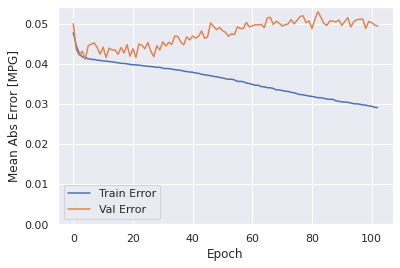

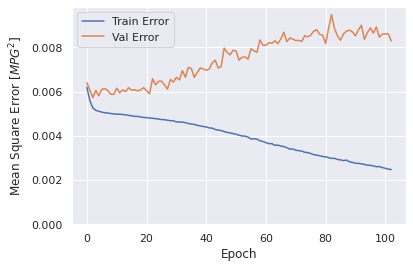

In [38]:
sns.set(rc = {'figure.figsize':(15,5), 'figure.dpi':80})
plot_history(history1)

### Evaluar predicciones

In [39]:
score_train1 = model1.evaluate(scaled_trainX, data_trainY_3D_2, verbose=1)
print(f'Loss:{score_train1[0]}')
print(f'MAE:{score_train1[1]}')
print(f'MSE:{score_train1[2]}')
print(f'SMAPE:{score_train1[3]}')

1413/1413 [==============================] - 10s 7ms/step - loss: 0.0028 - mae: 0.0306 - mse: 0.0028 - smape: 0.6531
Loss:0.0027643798384815454
MAE:0.030613316223025322
MSE:0.0027643798384815454
SMAPE:0.6530699133872986


In [40]:
score_val1 = model1.evaluate(scaled_valX, data_valY_3D_2, verbose=1)
print(f'Loss:{score_val1[0]}')
print(f'MAE:{score_val1[1]}')
print(f'MSE:{score_val1[2]}')
print(f'SMAPE:{score_val1[3]}')

303/303 [==============================] - 2s 7ms/step - loss: 0.0083 - mae: 0.0493 - mse: 0.0083 - smape: 0.8222
Loss:0.008290527388453484
MAE:0.049323324114084244
MSE:0.008290527388453484
SMAPE:0.8222410082817078


In [41]:
score_test1 = model1.evaluate(scaled_testX, data_testY_3D_2, verbose=1)
print(f'Loss:{score_test1[0]}') 
print(f'MAE:{score_test1[1]}')
print(f'MSE:{score_test1[2]}')
print(f'SMAPE:{score_test1[3]}')

303/303 [==============================] - 2s 7ms/step - loss: 0.0082 - mae: 0.0525 - mse: 0.0082 - smape: 0.7902
Loss:0.008181027136743069
MAE:0.05249451845884323
MSE:0.008181027136743069
SMAPE:0.7901593446731567


### Comparativa de resultados

In [42]:
result = hist1.iloc[-1]
comparativa1 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test1[1], score_test1[2], score_test1[3], math.sqrt(score_test1[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

### Obtener predicciones

In [43]:
trainPredict1 = model1.predict(scaled_trainX)
testPredict1 = model1.predict(scaled_testX)

### Visualización de las predicciones

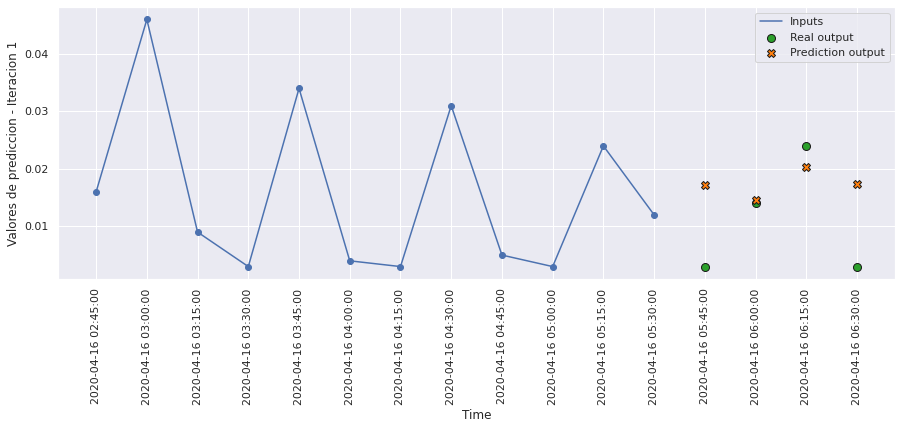

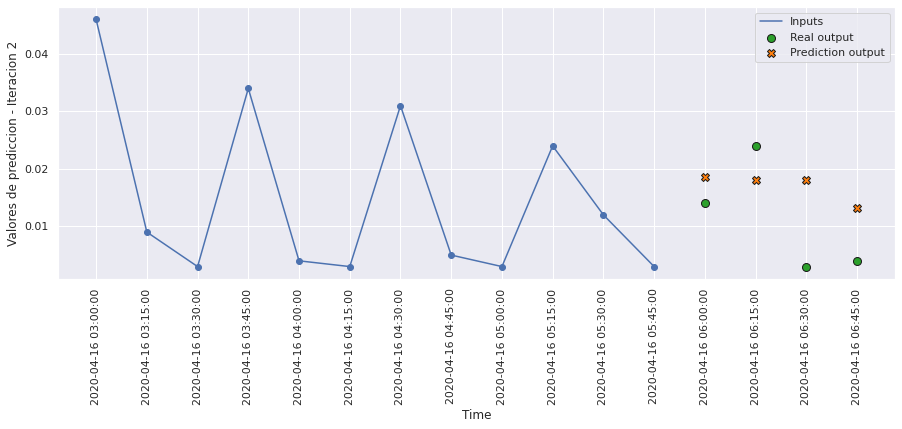

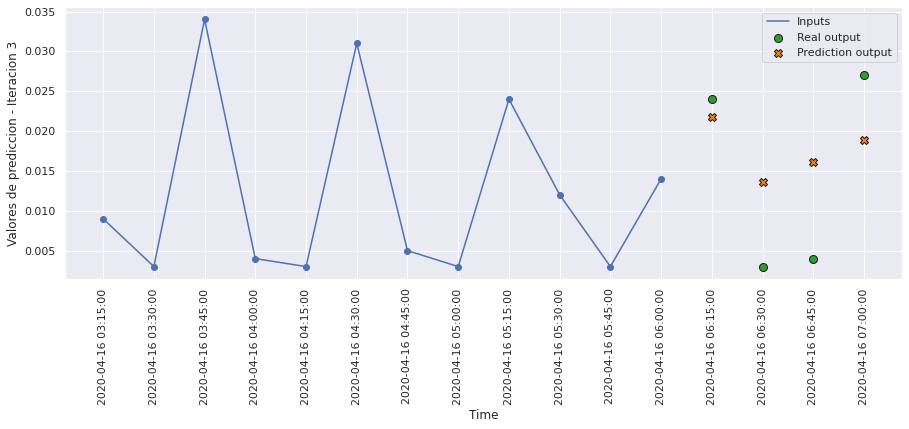

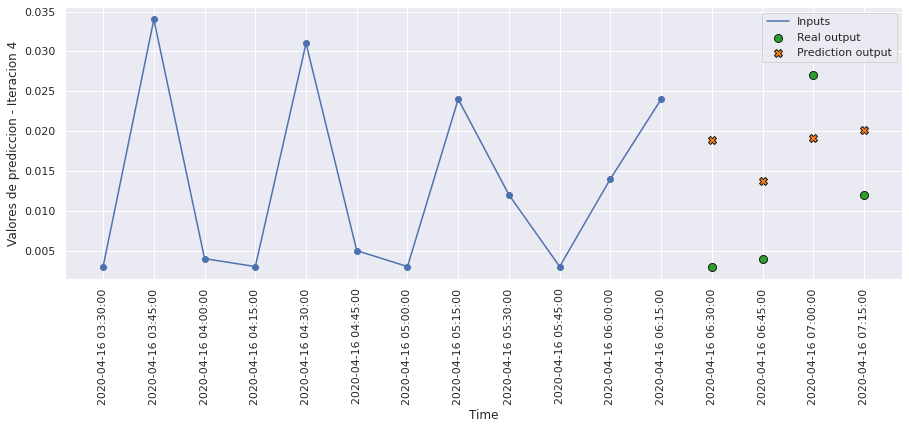

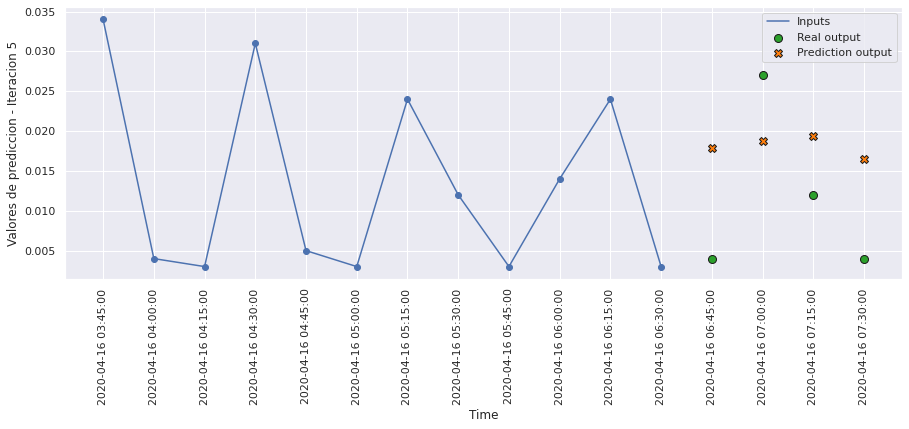

...

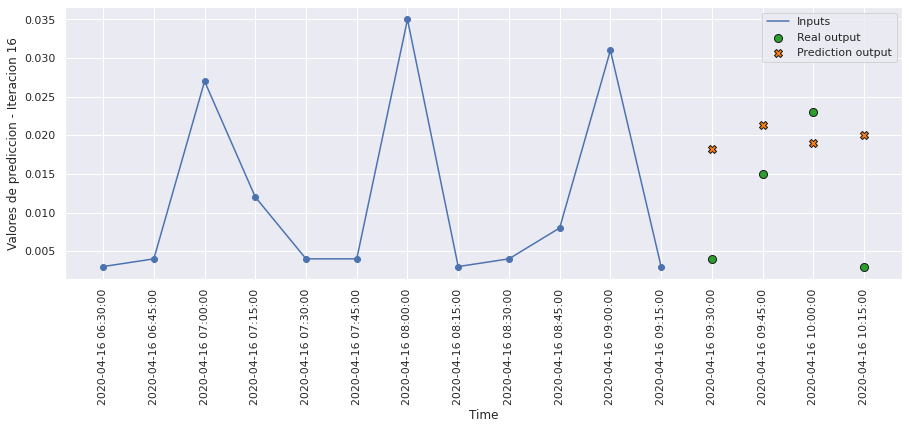

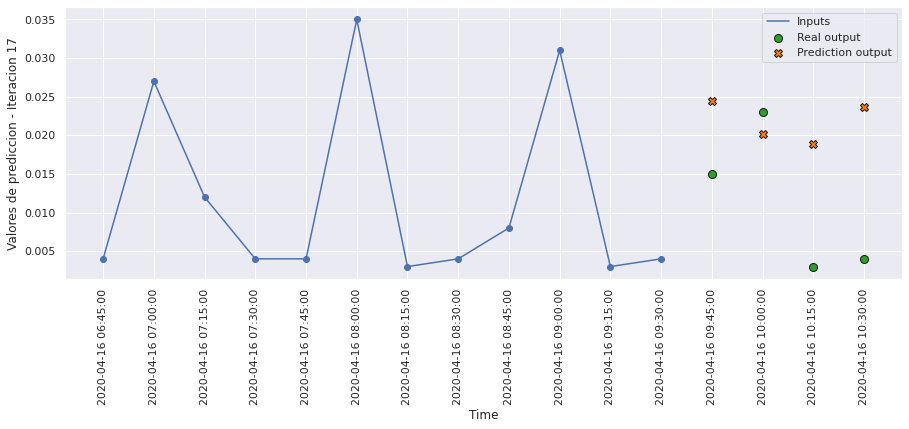

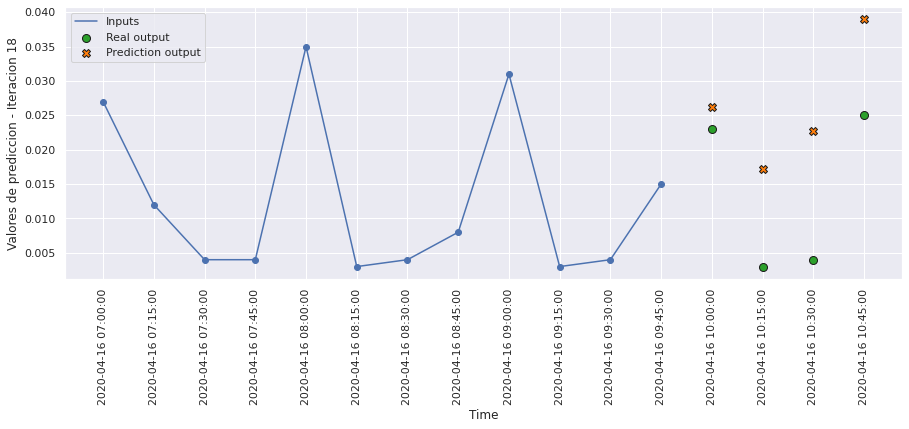

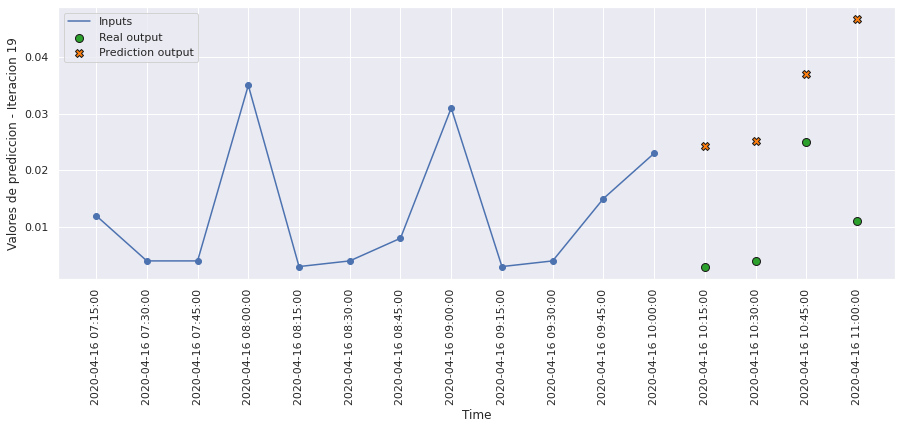

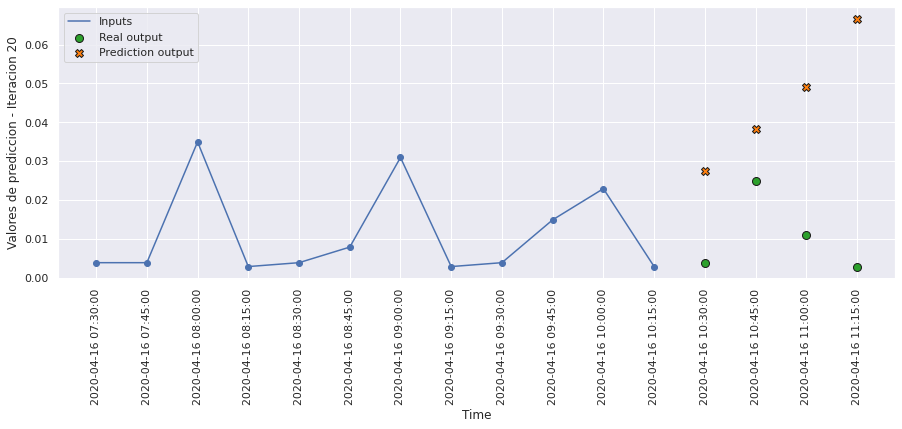

In [44]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict1, 20, 0)

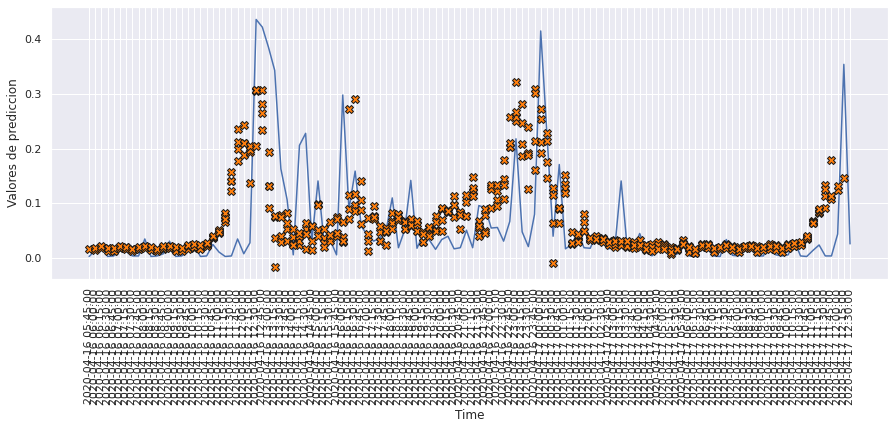

In [45]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict1, 120)

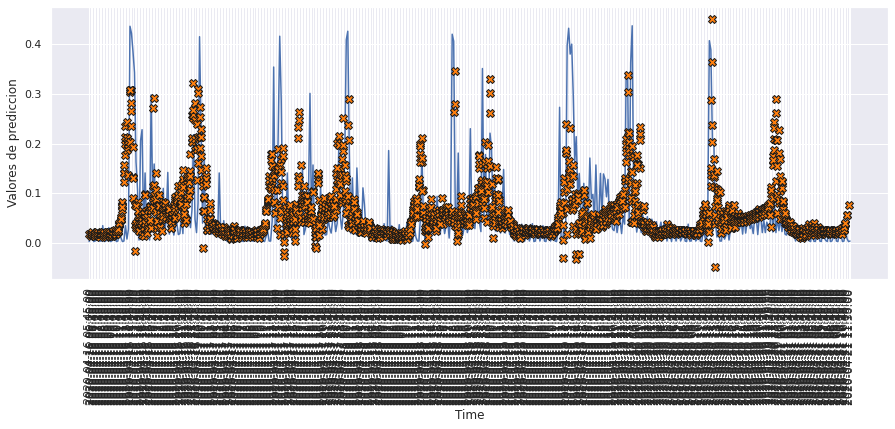

In [46]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict1, 500)

# MODELO 2: KERNEL REGULARIZER L1 0.01

### Construimos el modelo

In [47]:
def build_model2():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.LSTM(128, activation='tanh', return_sequences = True, 
                             kernel_regularizer=tf.keras.regularizers.L1L2(0.01, 0)),
        tf.keras.layers.LSTM(128, activation='tanh'),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [48]:
model2 = build_model2()
model2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_2 (LSTM)               (None, 12, 128)           69632     
                                                                 
 lstm_3 (LSTM)               (None, 128)               131584    
                                                                 
 dense_1 (Dense)             (None, 4)                 516       
                                                                 
Total params: 201,732
Trainable params: 201,732
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [49]:
history2 = model2.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 8s 16ms/step - loss: 0.2110 - mae: 0.0500 - mse: 0.0069 - smape: 0.8695 - val_loss: 0.0119 - val_mae: 0.0587 - val_mse: 0.0074 - val_smape: 0.9821
Epoch 2/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0114 - mae: 0.0505 - mse: 0.0069 - smape: 0.8725 - val_loss: 0.0114 - val_mae: 0.0483 - val_mse: 0.0070 - val_smape: 0.8624
Epoch 3/200
354/354 [==============================] - 5s 15ms/step - loss: 0.0113 - mae: 0.0504 - mse: 0.0069 - smape: 0.8721 - val_loss: 0.0114 - val_mae: 0.0444 - val_mse: 0.0070 - val_smape: 0.8049
Epoch 4/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0113 - mae: 0.0503 - mse: 0.0069 - smape: 0.8708 - val_loss: 0.0114 - val_mae: 0.0478 - val_mse: 0.0070 - val_smape: 0.8563
Epoch 5/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0113 - mae: 0.0503 - mse: 0.0069 - smape: 0.8712 - val_loss: 0.0114 - val_mae: 0.0490 - val_mse: 0.0070 - val_smap

354/354 [==============================] - 5s 14ms/step - loss: 0.0112 - mae: 0.0503 - mse: 0.0069 - smape: 0.8723 - val_loss: 0.0113 - val_mae: 0.0480 - val_mse: 0.0070 - val_smape: 0.8590
Epoch 42/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0112 - mae: 0.0503 - mse: 0.0069 - smape: 0.8717 - val_loss: 0.0114 - val_mae: 0.0507 - val_mse: 0.0071 - val_smape: 0.8939
Epoch 43/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0112 - mae: 0.0503 - mse: 0.0069 - smape: 0.8724 - val_loss: 0.0113 - val_mae: 0.0494 - val_mse: 0.0070 - val_smape: 0.8768
Epoch 44/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0112 - mae: 0.0503 - mse: 0.0069 - smape: 0.8712 - val_loss: 0.0113 - val_mae: 0.0514 - val_mse: 0.0071 - val_smape: 0.9033
Epoch 45/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0112 - mae: 0.0504 - mse: 0.0069 - smape: 0.8728 - val_loss: 0.0113 - val_mae: 0.0499 - val_mse: 0.0071 - val_smape: 0.884

354/354 [==============================] - 5s 14ms/step - loss: 0.0112 - mae: 0.0503 - mse: 0.0069 - smape: 0.8716 - val_loss: 0.0114 - val_mae: 0.0494 - val_mse: 0.0070 - val_smape: 0.8777
Epoch 82/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0112 - mae: 0.0503 - mse: 0.0069 - smape: 0.8723 - val_loss: 0.0114 - val_mae: 0.0499 - val_mse: 0.0071 - val_smape: 0.8840
Epoch 83/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0112 - mae: 0.0503 - mse: 0.0069 - smape: 0.8719 - val_loss: 0.0113 - val_mae: 0.0484 - val_mse: 0.0070 - val_smape: 0.8650
Epoch 84/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0112 - mae: 0.0503 - mse: 0.0069 - smape: 0.8719 - val_loss: 0.0114 - val_mae: 0.0491 - val_mse: 0.0070 - val_smape: 0.8733
Epoch 85/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0112 - mae: 0.0503 - mse: 0.0069 - smape: 0.8719 - val_loss: 0.0113 - val_mae: 0.0475 - val_mse: 0.0070 - val_smape: 0.852

354/354 [==============================] - 5s 14ms/step - loss: 0.0112 - mae: 0.0502 - mse: 0.0069 - smape: 0.8711 - val_loss: 0.0113 - val_mae: 0.0505 - val_mse: 0.0071 - val_smape: 0.8915
Epoch 122/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0112 - mae: 0.0503 - mse: 0.0069 - smape: 0.8721 - val_loss: 0.0113 - val_mae: 0.0497 - val_mse: 0.0070 - val_smape: 0.8820
Epoch 123/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0112 - mae: 0.0503 - mse: 0.0069 - smape: 0.8722 - val_loss: 0.0113 - val_mae: 0.0504 - val_mse: 0.0071 - val_smape: 0.8906
Epoch 124/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0112 - mae: 0.0503 - mse: 0.0069 - smape: 0.8722 - val_loss: 0.0114 - val_mae: 0.0497 - val_mse: 0.0070 - val_smape: 0.8812
Epoch 125/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0112 - mae: 0.0503 - mse: 0.0069 - smape: 0.8708 - val_loss: 0.0114 - val_mae: 0.0512 - val_mse: 0.0071 - val_smape: 0

354/354 [==============================] - 5s 14ms/step - loss: 0.0112 - mae: 0.0503 - mse: 0.0069 - smape: 0.8720 - val_loss: 0.0114 - val_mae: 0.0494 - val_mse: 0.0070 - val_smape: 0.8770
Epoch 162/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0112 - mae: 0.0503 - mse: 0.0069 - smape: 0.8722 - val_loss: 0.0114 - val_mae: 0.0506 - val_mse: 0.0071 - val_smape: 0.8925
Epoch 163/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0112 - mae: 0.0504 - mse: 0.0069 - smape: 0.8731 - val_loss: 0.0113 - val_mae: 0.0484 - val_mse: 0.0070 - val_smape: 0.8649
Epoch 164/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0112 - mae: 0.0502 - mse: 0.0069 - smape: 0.8710 - val_loss: 0.0114 - val_mae: 0.0520 - val_mse: 0.0071 - val_smape: 0.9096
Epoch 165/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0112 - mae: 0.0504 - mse: 0.0069 - smape: 0.8730 - val_loss: 0.0113 - val_mae: 0.0481 - val_mse: 0.0070 - val_smape: 0

In [50]:
hist2 = pd.DataFrame(history2.history)
hist2['epoch'] = history2.epoch
hist2

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.211021,0.049976,0.006864,0.869513,0.011906,0.058720,0.007361,0.982077,0
1,0.011354,0.050479,0.006935,0.872544,0.011350,0.048299,0.007027,0.862371,1
2,0.011307,0.050377,0.006922,0.872096,0.011357,0.044382,0.007015,0.804930,2
3,0.011289,0.050292,0.006923,0.870823,0.011377,0.047828,0.007020,0.856313,3
4,0.011276,0.050319,0.006920,0.871203,0.011396,0.049019,0.007036,0.872198,4
...,...,...,...,...,...,...,...,...,...
182,0.011218,0.050278,0.006909,0.872196,0.011265,0.047897,0.007019,0.857562,182
183,0.011217,0.050272,0.006909,0.871762,0.011341,0.050712,0.007064,0.894452,183
184,0.011217,0.050361,0.006910,0.873041,0.011389,0.048793,0.007030,0.869719,184
185,0.011220,0.050332,0.006911,0.872109,0.011332,0.048115,0.007022,0.860491,185


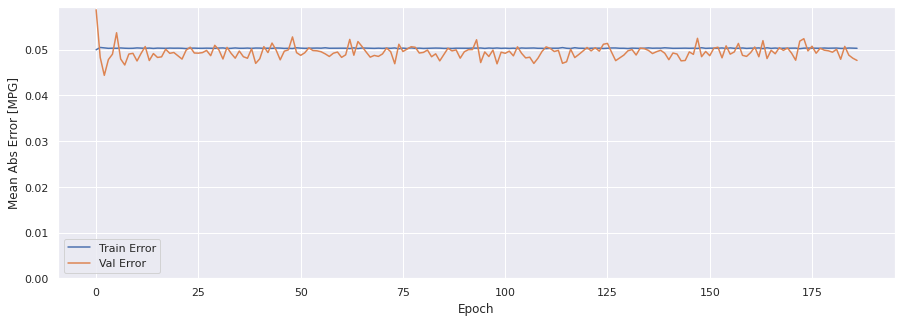

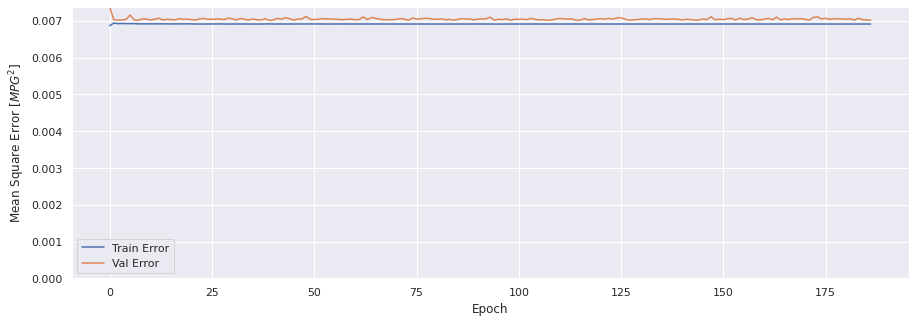

In [51]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history2)

### Evaluar predicciones

In [52]:
score_train2 = model2.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train2[0]}')
print(f'MAE:{score_train2[1]}')
print(f'MSE:{score_train2[2]}')
print(f'SMAPE:{score_train2[3]}')

1413/1413 [==============================] - 10s 7ms/step - loss: 0.0112 - mae: 0.0491 - mse: 0.0069 - smape: 0.8573
Loss:0.011196626350283623
MAE:0.04906020313501358
MSE:0.006912596058100462
SMAPE:0.857347846031189


In [53]:
score_val2 = model2.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val2[0]}')
print(f'MAE:{score_val2[1]}')
print(f'MSE:{score_val2[2]}')
print(f'SMAPE:{score_val2[3]}')

303/303 [==============================] - 2s 7ms/step - loss: 0.0113 - mae: 0.0476 - mse: 0.0070 - smape: 0.8523
Loss:0.011299974285066128
MAE:0.04764501005411148
MSE:0.007015933282673359
SMAPE:0.8523172736167908


In [54]:
score_test2 = model2.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test2[0]}')
print(f'MAE:{score_test2[1]}')
print(f'MSE:{score_test2[2]}')
print(f'SMAPE:{score_test2[3]}')

303/303 [==============================] - 2s 7ms/step - loss: 0.0111 - mae: 0.0498 - mse: 0.0068 - smape: 0.8636
Loss:0.0111311636865139
MAE:0.04977445304393768
MSE:0.006847113370895386
SMAPE:0.8635585308074951


### Comparativa de resultados

In [55]:
result = hist2.iloc[-1]
comparativa2 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test2[1], score_test2[2], score_test2[3], math.sqrt(score_test2[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

### Obtener predicciones

In [56]:
trainPredict2 = model2.predict(scaled_trainX)
testPredict2 = model2.predict(scaled_testX)

### Visualización de las predicciones

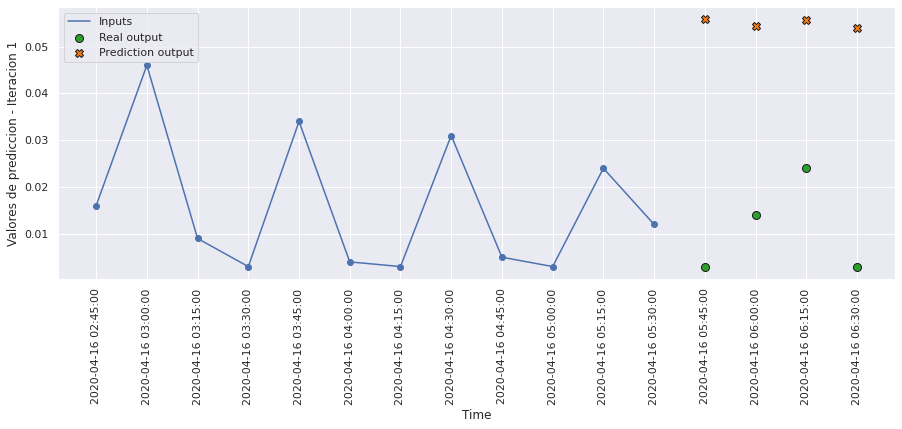

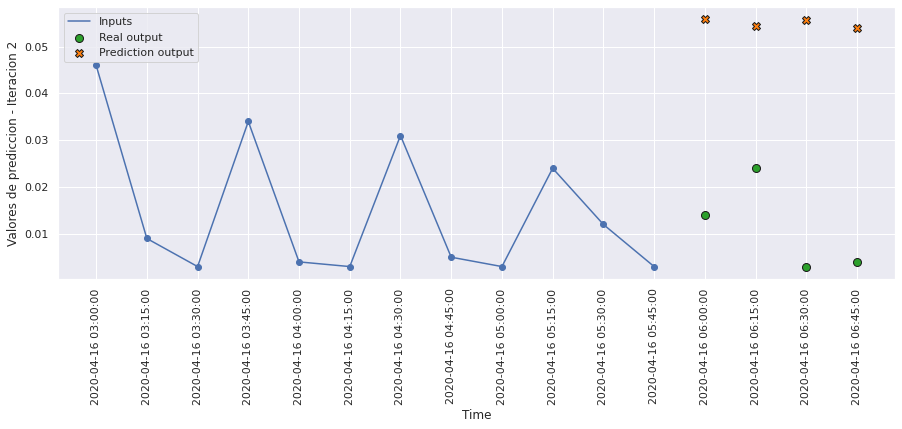

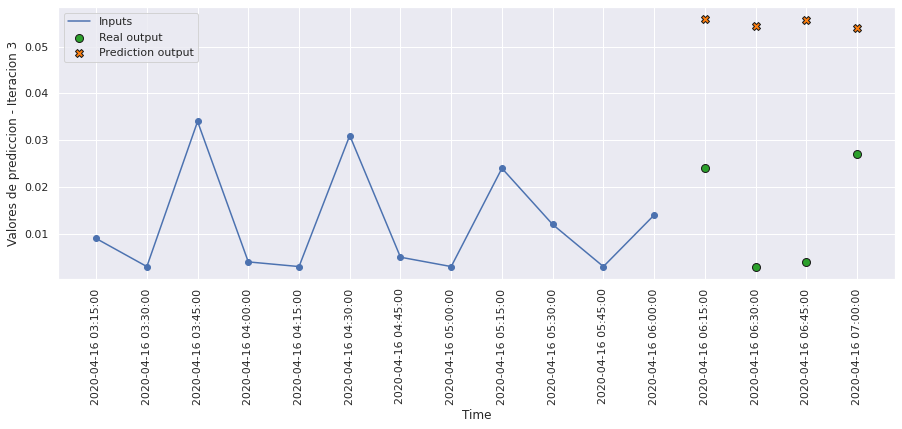

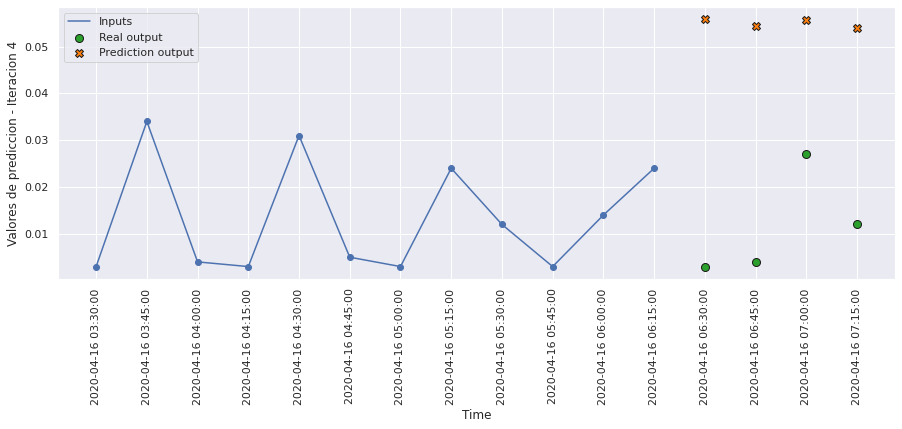

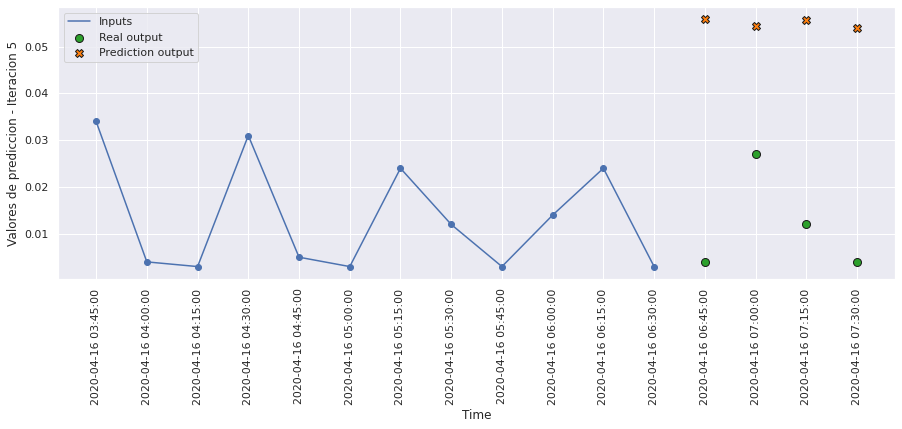

...

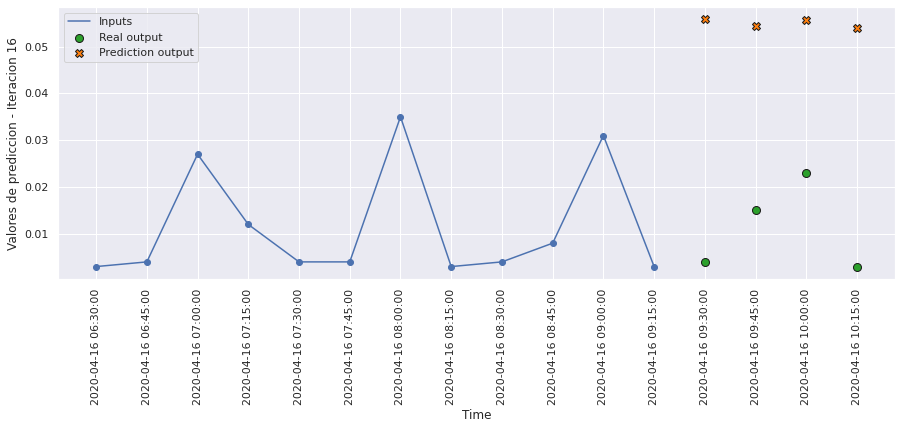

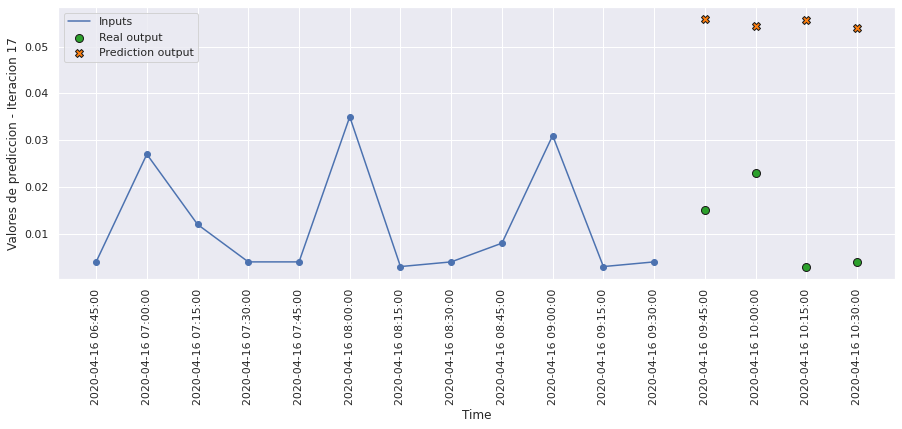

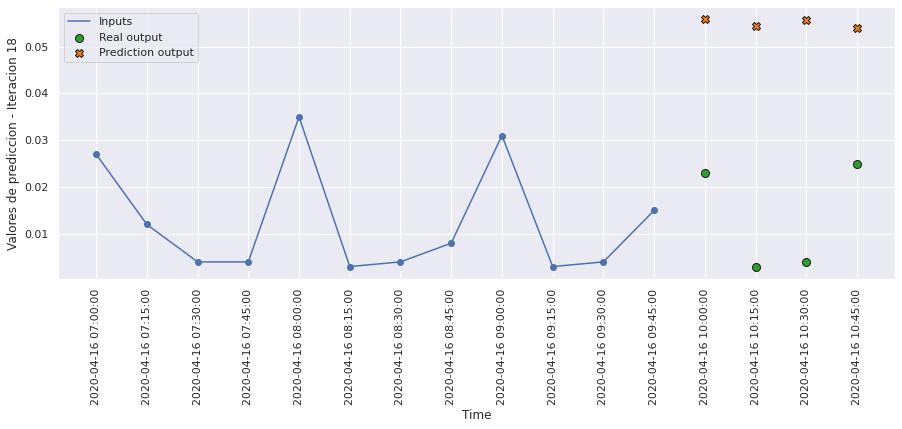

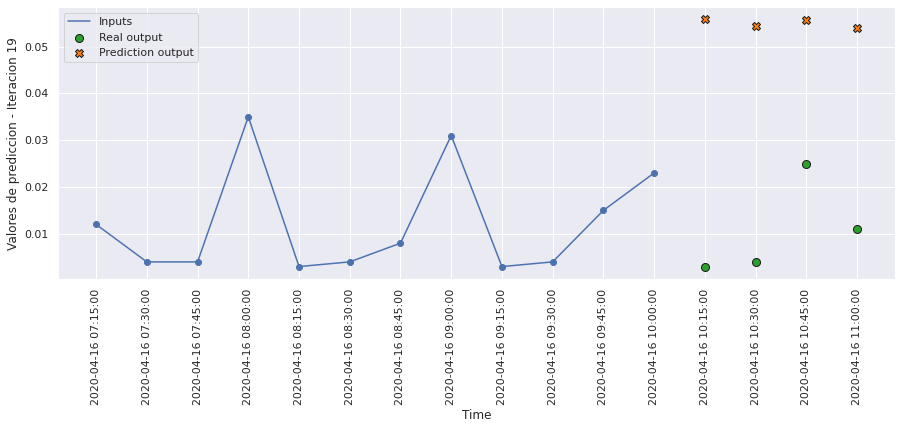

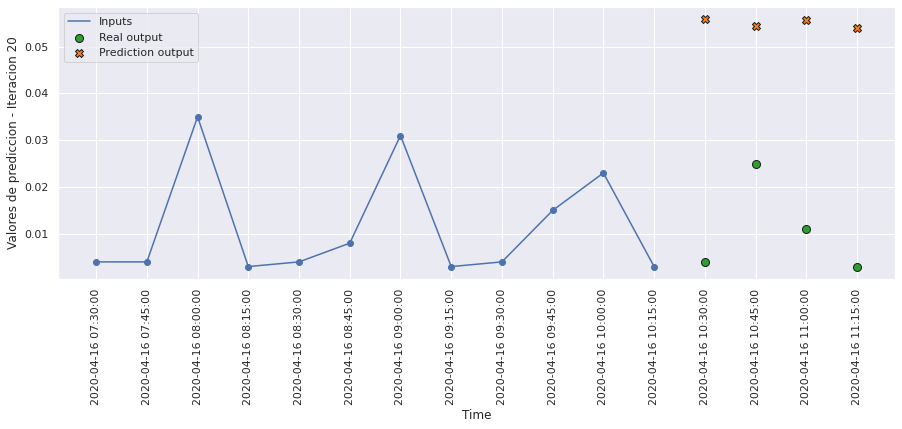

In [57]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict2, 20, 0)

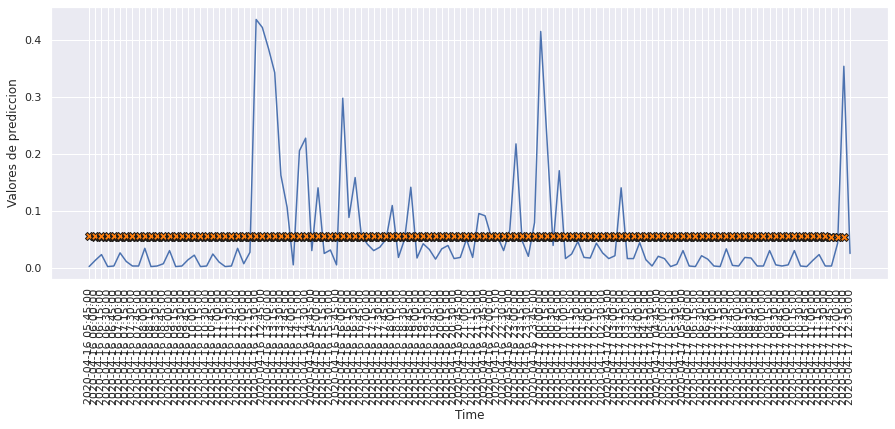

In [58]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict2, 120)

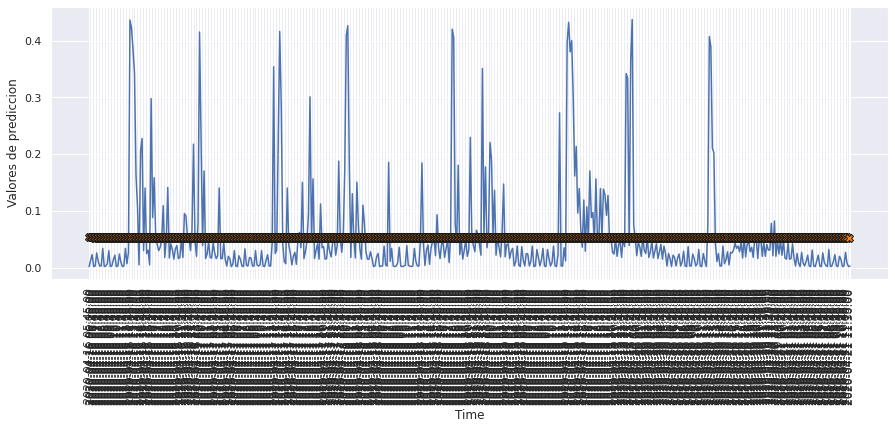

In [59]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict2, 500)

# MODELO 3: KERNEL REGULARIZER L2 0.01

### Construimos el modelo

In [60]:
def build_model3():    
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.LSTM(128, activation='tanh', return_sequences = True, 
                             kernel_regularizer=tf.keras.regularizers.L1L2(0, 0.01)),
        tf.keras.layers.LSTM(128, activation='tanh'),
        tf.keras.layers.Dense(n_predicciones)
    ])


    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [61]:
model3 = build_model3()
model3.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_4 (LSTM)               (None, 12, 128)           69632     
                                                                 
 lstm_5 (LSTM)               (None, 128)               131584    
                                                                 
 dense_2 (Dense)             (None, 4)                 516       
                                                                 
Total params: 201,732
Trainable params: 201,732
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [62]:
history3 = model3.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 8s 16ms/step - loss: 0.0190 - mae: 0.0477 - mse: 0.0065 - smape: 0.8367 - val_loss: 0.0068 - val_mae: 0.0484 - val_mse: 0.0068 - val_smape: 0.8514
Epoch 2/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0063 - mae: 0.0474 - mse: 0.0062 - smape: 0.8525 - val_loss: 0.0066 - val_mae: 0.0464 - val_mse: 0.0066 - val_smape: 0.9330
Epoch 3/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0062 - mae: 0.0472 - mse: 0.0061 - smape: 0.8456 - val_loss: 0.0066 - val_mae: 0.0453 - val_mse: 0.0065 - val_smape: 0.8205
Epoch 4/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0061 - mae: 0.0469 - mse: 0.0060 - smape: 0.8437 - val_loss: 0.0068 - val_mae: 0.0442 - val_mse: 0.0067 - val_smape: 0.9466
Epoch 5/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0059 - mae: 0.0454 - mse: 0.0058 - smape: 0.8090 - val_loss: 0.0069 - val_mae: 0.0521 - val_mse: 0.0068 - val_smap

354/354 [==============================] - 5s 14ms/step - loss: 0.0051 - mae: 0.0411 - mse: 0.0050 - smape: 0.7423 - val_loss: 0.0063 - val_mae: 0.0436 - val_mse: 0.0062 - val_smape: 0.7772
Epoch 42/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0051 - mae: 0.0410 - mse: 0.0050 - smape: 0.7426 - val_loss: 0.0062 - val_mae: 0.0443 - val_mse: 0.0061 - val_smape: 0.7806
Epoch 43/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0051 - mae: 0.0409 - mse: 0.0050 - smape: 0.7405 - val_loss: 0.0063 - val_mae: 0.0437 - val_mse: 0.0062 - val_smape: 0.7641
Epoch 44/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0051 - mae: 0.0410 - mse: 0.0050 - smape: 0.7433 - val_loss: 0.0062 - val_mae: 0.0435 - val_mse: 0.0061 - val_smape: 0.7639
Epoch 45/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0051 - mae: 0.0409 - mse: 0.0050 - smape: 0.7396 - val_loss: 0.0061 - val_mae: 0.0434 - val_mse: 0.0059 - val_smape: 0.770

354/354 [==============================] - 5s 14ms/step - loss: 0.0050 - mae: 0.0406 - mse: 0.0049 - smape: 0.7373 - val_loss: 0.0064 - val_mae: 0.0451 - val_mse: 0.0063 - val_smape: 0.7843
Epoch 82/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0051 - mae: 0.0405 - mse: 0.0049 - smape: 0.7360 - val_loss: 0.0063 - val_mae: 0.0423 - val_mse: 0.0062 - val_smape: 0.7326
Epoch 83/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0050 - mae: 0.0404 - mse: 0.0049 - smape: 0.7356 - val_loss: 0.0061 - val_mae: 0.0410 - val_mse: 0.0060 - val_smape: 0.7514
Epoch 84/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0050 - mae: 0.0404 - mse: 0.0049 - smape: 0.7352 - val_loss: 0.0061 - val_mae: 0.0415 - val_mse: 0.0060 - val_smape: 0.7490
Epoch 85/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0050 - mae: 0.0404 - mse: 0.0049 - smape: 0.7347 - val_loss: 0.0059 - val_mae: 0.0429 - val_mse: 0.0058 - val_smape: 0.770

354/354 [==============================] - 5s 14ms/step - loss: 0.0050 - mae: 0.0401 - mse: 0.0048 - smape: 0.7321 - val_loss: 0.0063 - val_mae: 0.0442 - val_mse: 0.0062 - val_smape: 0.7839
Epoch 122/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0049 - mae: 0.0399 - mse: 0.0048 - smape: 0.7306 - val_loss: 0.0064 - val_mae: 0.0450 - val_mse: 0.0063 - val_smape: 0.7769
Epoch 123/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0049 - mae: 0.0400 - mse: 0.0048 - smape: 0.7301 - val_loss: 0.0062 - val_mae: 0.0433 - val_mse: 0.0061 - val_smape: 0.7618
Epoch 124/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0049 - mae: 0.0399 - mse: 0.0048 - smape: 0.7299 - val_loss: 0.0066 - val_mae: 0.0427 - val_mse: 0.0064 - val_smape: 0.7693
Epoch 125/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0049 - mae: 0.0399 - mse: 0.0048 - smape: 0.7290 - val_loss: 0.0065 - val_mae: 0.0440 - val_mse: 0.0064 - val_smape: 0

354/354 [==============================] - 5s 14ms/step - loss: 0.0048 - mae: 0.0391 - mse: 0.0046 - smape: 0.7229 - val_loss: 0.0064 - val_mae: 0.0425 - val_mse: 0.0063 - val_smape: 0.7657
Epoch 162/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0048 - mae: 0.0392 - mse: 0.0046 - smape: 0.7238 - val_loss: 0.0063 - val_mae: 0.0431 - val_mse: 0.0061 - val_smape: 0.7716
Epoch 163/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0048 - mae: 0.0392 - mse: 0.0046 - smape: 0.7239 - val_loss: 0.0071 - val_mae: 0.0465 - val_mse: 0.0069 - val_smape: 0.7972
Epoch 164/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0048 - mae: 0.0392 - mse: 0.0046 - smape: 0.7238 - val_loss: 0.0064 - val_mae: 0.0418 - val_mse: 0.0063 - val_smape: 0.7667
Epoch 165/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0048 - mae: 0.0391 - mse: 0.0046 - smape: 0.7231 - val_loss: 0.0066 - val_mae: 0.0444 - val_mse: 0.0065 - val_smape: 0

In [63]:
hist3 = pd.DataFrame(history3.history)
hist3['epoch'] = history3.epoch
hist3

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.019036,0.047700,0.006520,0.836678,0.006810,0.048414,0.006755,0.851354,0
1,0.006285,0.047425,0.006210,0.852537,0.006630,0.046384,0.006554,0.933037,1
2,0.006201,0.047218,0.006131,0.845590,0.006591,0.045314,0.006528,0.820537,2
3,0.006108,0.046940,0.006037,0.843700,0.006777,0.044225,0.006688,0.946575,3
4,0.005911,0.045369,0.005789,0.808989,0.006894,0.052101,0.006751,1.027813,4
...,...,...,...,...,...,...,...,...,...
187,0.004557,0.038235,0.004394,0.717310,0.006862,0.044319,0.006702,0.767469,187
188,0.004565,0.038196,0.004401,0.716608,0.007249,0.047310,0.007089,0.780374,188
189,0.004553,0.038204,0.004390,0.717807,0.006926,0.044808,0.006756,0.777205,189
190,0.004543,0.038115,0.004375,0.716167,0.006747,0.044181,0.006584,0.767228,190


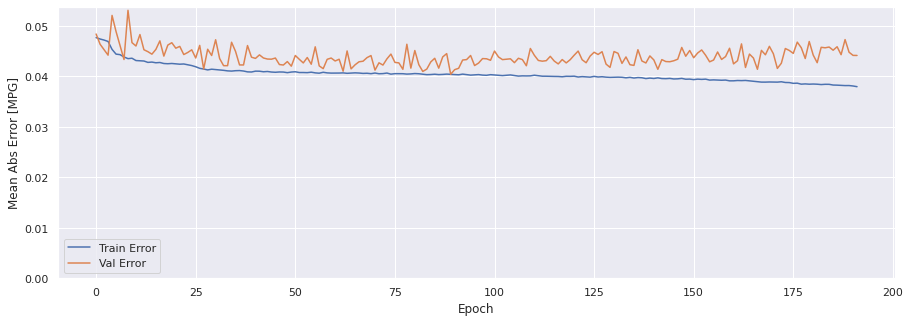

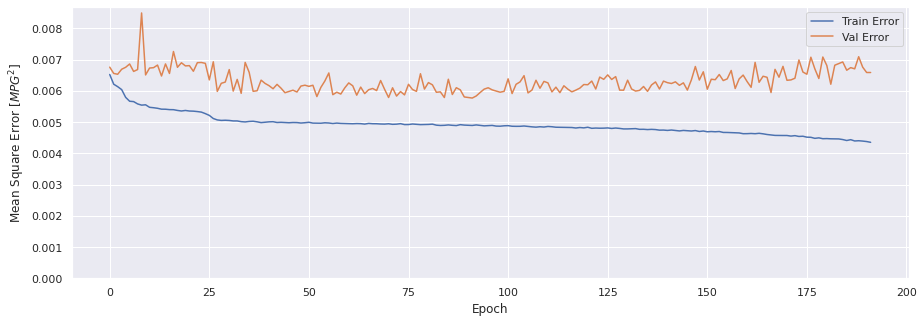

In [64]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history3)

### Evaluar predicciones

In [65]:
score_train3 = model3.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train3[0]}')
print(f'MAE:{score_train3[1]}')
print(f'MSE:{score_train3[2]}')
print(f'SMAPE:{score_train3[3]}')

1413/1413 [==============================] - 10s 7ms/step - loss: 0.0045 - mae: 0.0376 - mse: 0.0043 - smape: 0.7094
Loss:0.004467503167688847
MAE:0.037618350237607956
MSE:0.00431704381480813
SMAPE:0.7094303369522095


In [66]:
score_val3 = model3.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val3[0]}')
print(f'MAE:{score_val3[1]}')
print(f'MSE:{score_val3[2]}')
print(f'SMAPE:{score_val3[3]}')

303/303 [==============================] - 2s 7ms/step - loss: 0.0067 - mae: 0.0442 - mse: 0.0066 - smape: 0.7743
Loss:0.006734571419656277
MAE:0.04416494444012642
MSE:0.006584111601114273
SMAPE:0.7743343114852905


In [67]:
score_test3 = model3.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test3[0]}')
print(f'MAE:{score_test3[1]}')
print(f'MSE:{score_test3[2]}')
print(f'SMAPE:{score_test3[3]}')

303/303 [==============================] - 2s 7ms/step - loss: 0.0066 - mae: 0.0465 - mse: 0.0064 - smape: 0.7719
Loss:0.006591088138520718
MAE:0.04651731997728348
MSE:0.006440629251301289
SMAPE:0.7718689441680908


### Comparativa de resultados

In [68]:
result = hist3.iloc[-1]
comparativa3 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test3[1], score_test3[2], score_test3[3], math.sqrt(score_test3[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

### Obtener predicciones

In [69]:
trainPredict3 = model3.predict(scaled_trainX)
testPredict3 = model3.predict(scaled_testX)

### Visualización de las predicciones

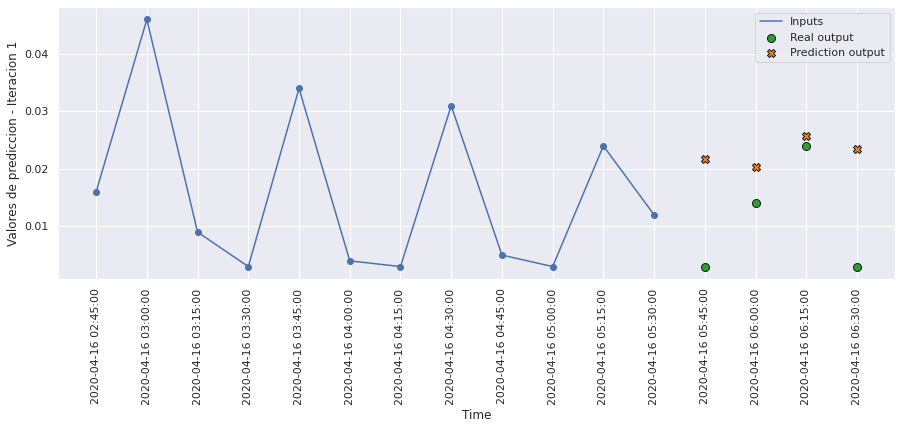

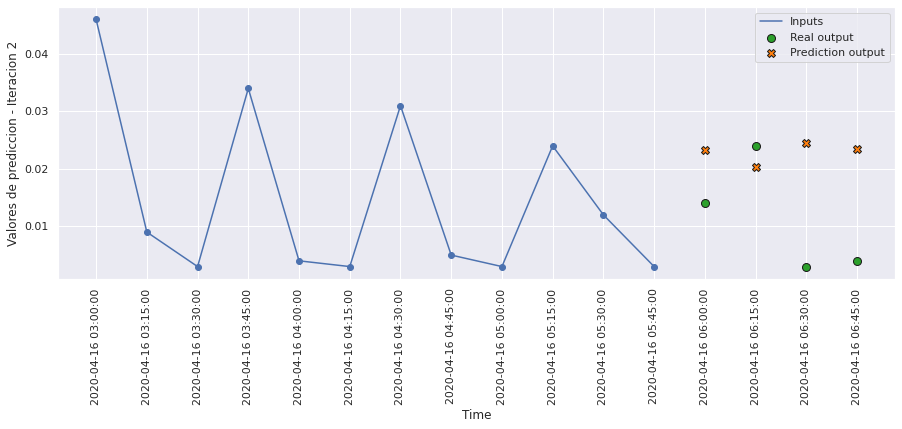

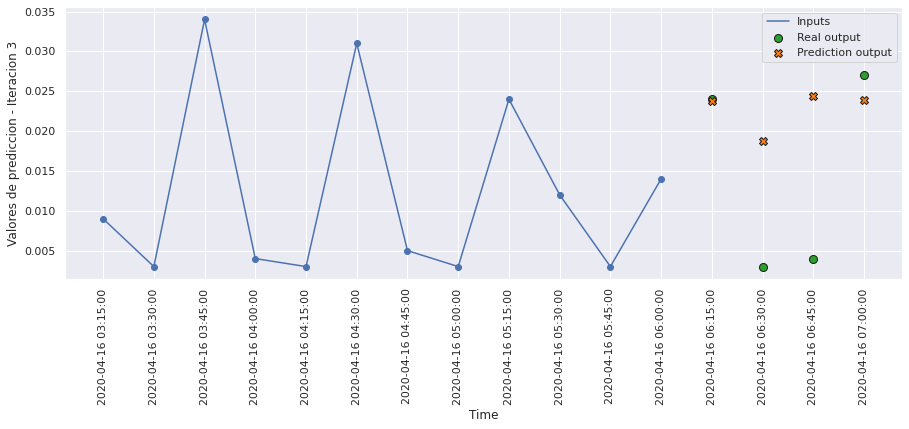

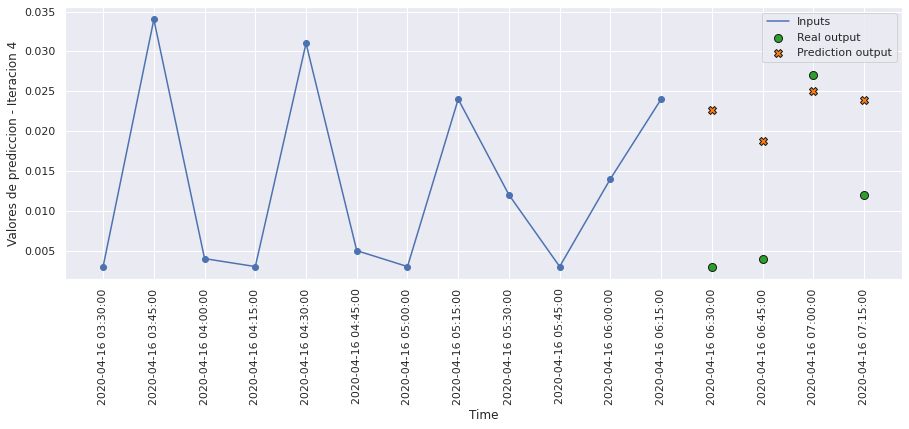

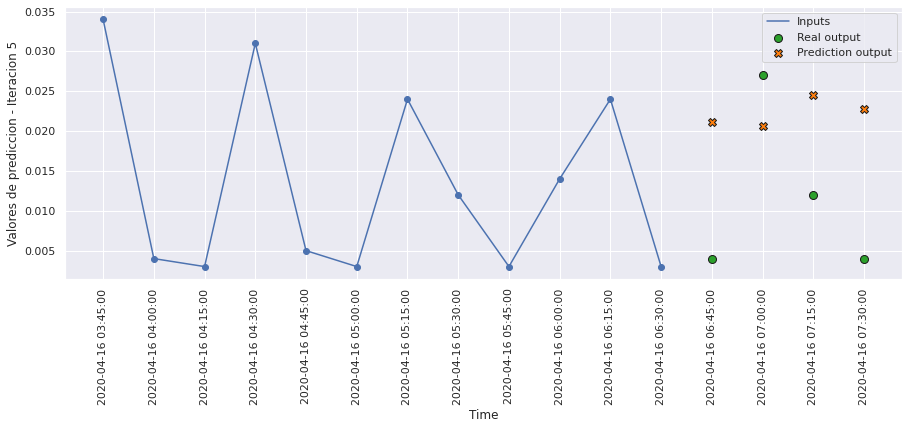

...

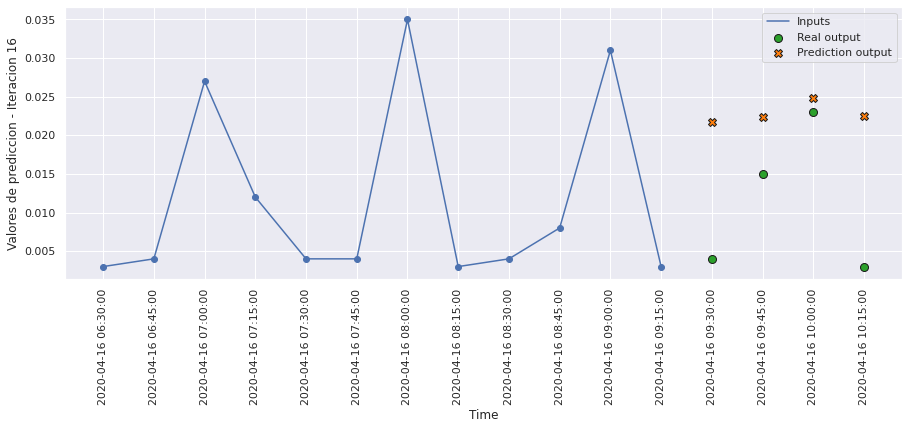

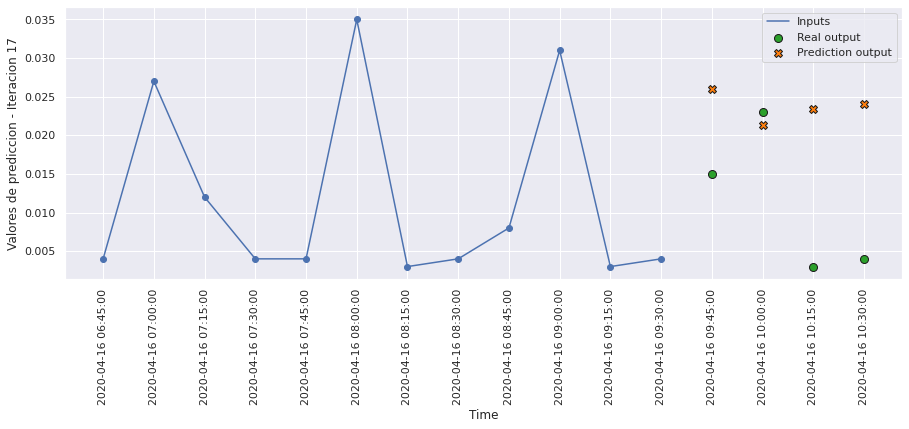

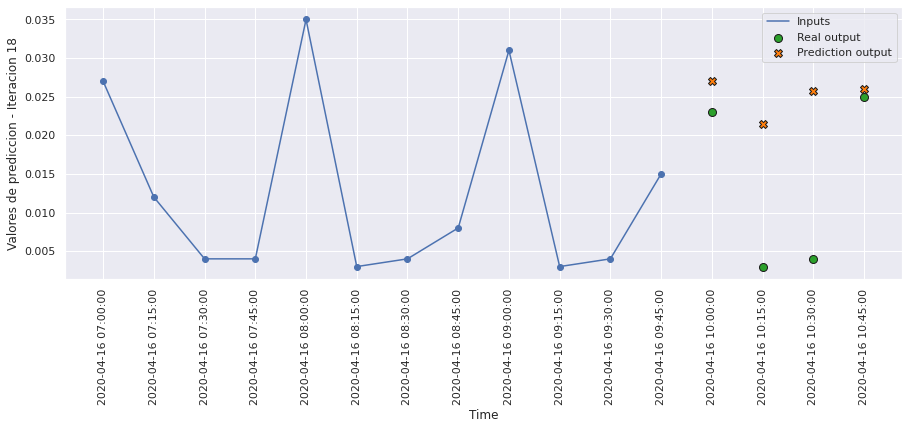

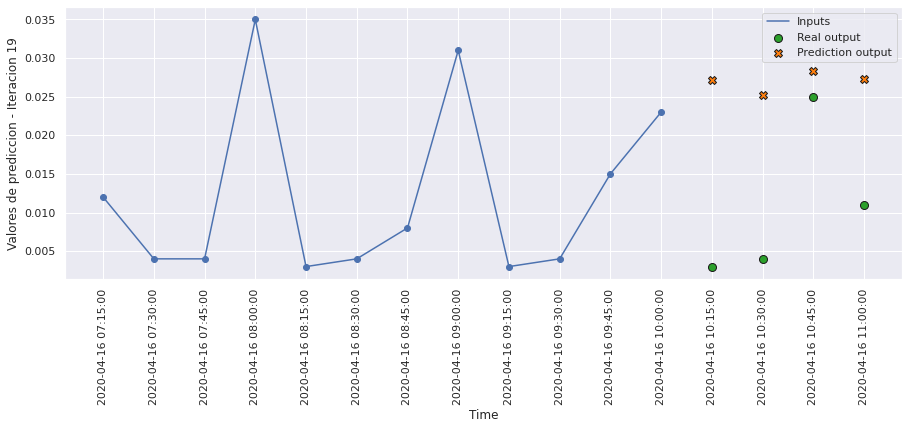

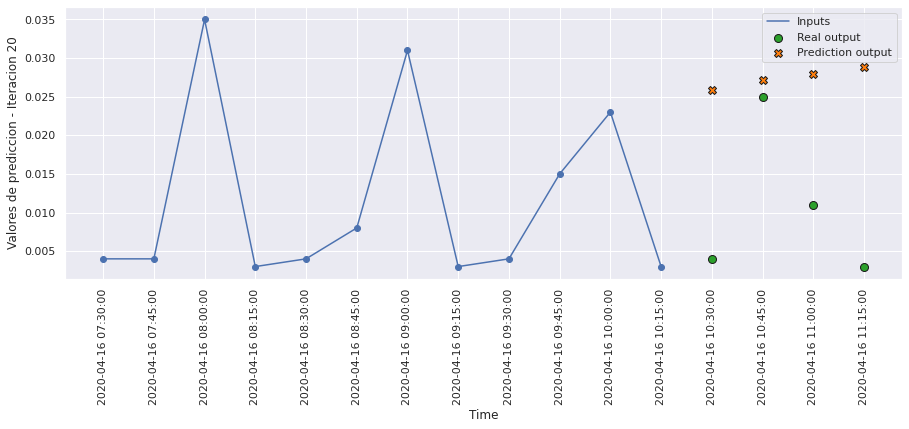

In [70]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict3, 20, 0)

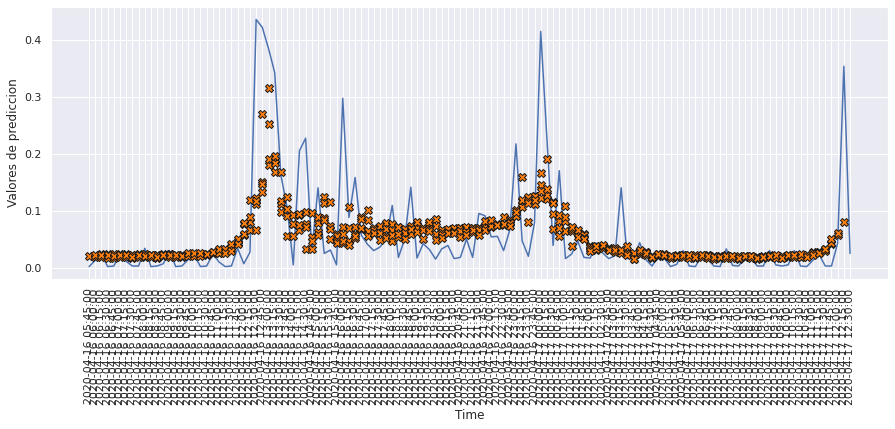

In [71]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict3, 120)

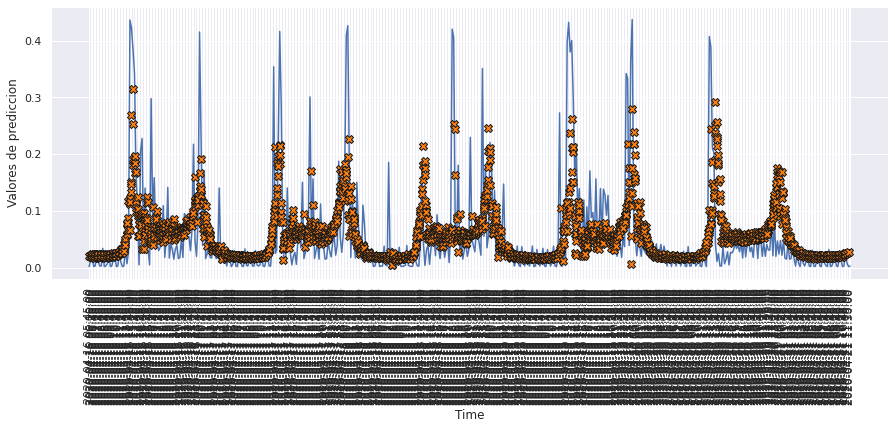

In [72]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict3, 500)

# MODELO 4: RECURRENT REGULARIZER L1 0.01

### Construimos el modelo

In [73]:
def build_model4():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.LSTM(128, activation='tanh', return_sequences = True, 
                             recurrent_regularizer=tf.keras.regularizers.L1L2(0.01, 0)),
        tf.keras.layers.LSTM(128, activation='tanh'),
        tf.keras.layers.Dense(n_predicciones)
    ])


    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [74]:
model4 = build_model4()
model4.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_6 (LSTM)               (None, 12, 128)           69632     
                                                                 
 lstm_7 (LSTM)               (None, 128)               131584    
                                                                 
 dense_3 (Dense)             (None, 4)                 516       
                                                                 
Total params: 201,732
Trainable params: 201,732
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [75]:
history4 = model4.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 7s 15ms/step - loss: 1.9855 - mae: 0.0479 - mse: 0.0062 - smape: 0.8690 - val_loss: 0.0879 - val_mae: 0.0480 - val_mse: 0.0063 - val_smape: 0.9725
Epoch 2/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0861 - mae: 0.0452 - mse: 0.0057 - smape: 0.8236 - val_loss: 0.0873 - val_mae: 0.0503 - val_mse: 0.0065 - val_smape: 0.9385
Epoch 3/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0854 - mae: 0.0437 - mse: 0.0054 - smape: 0.7989 - val_loss: 0.0863 - val_mae: 0.0458 - val_mse: 0.0060 - val_smape: 0.7934
Epoch 4/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0847 - mae: 0.0419 - mse: 0.0051 - smape: 0.7692 - val_loss: 0.0852 - val_mae: 0.0450 - val_mse: 0.0062 - val_smape: 0.8129
Epoch 5/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0844 - mae: 0.0413 - mse: 0.0050 - smape: 0.7563 - val_loss: 0.0857 - val_mae: 0.0433 - val_mse: 0.0059 - val_smap

354/354 [==============================] - 5s 14ms/step - loss: 0.0819 - mae: 0.0371 - mse: 0.0042 - smape: 0.6992 - val_loss: 0.0858 - val_mae: 0.0477 - val_mse: 0.0076 - val_smape: 0.8097
Epoch 42/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0818 - mae: 0.0370 - mse: 0.0042 - smape: 0.6984 - val_loss: 0.0856 - val_mae: 0.0494 - val_mse: 0.0079 - val_smape: 0.8084
Epoch 43/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0817 - mae: 0.0368 - mse: 0.0041 - smape: 0.6981 - val_loss: 0.0857 - val_mae: 0.0475 - val_mse: 0.0075 - val_smape: 0.8341
Epoch 44/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0817 - mae: 0.0366 - mse: 0.0041 - smape: 0.6961 - val_loss: 0.0857 - val_mae: 0.0493 - val_mse: 0.0078 - val_smape: 0.8319
Epoch 45/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0815 - mae: 0.0364 - mse: 0.0040 - smape: 0.6956 - val_loss: 0.0856 - val_mae: 0.0478 - val_mse: 0.0077 - val_smape: 0.797

354/354 [==============================] - 5s 14ms/step - loss: 0.0785 - mae: 0.0281 - mse: 0.0022 - smape: 0.6526 - val_loss: 0.0861 - val_mae: 0.0521 - val_mse: 0.0094 - val_smape: 0.8849
Epoch 82/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0783 - mae: 0.0278 - mse: 0.0021 - smape: 0.6513 - val_loss: 0.0854 - val_mae: 0.0525 - val_mse: 0.0094 - val_smape: 0.8385
Epoch 83/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0782 - mae: 0.0277 - mse: 0.0021 - smape: 0.6512 - val_loss: 0.0864 - val_mae: 0.0533 - val_mse: 0.0098 - val_smape: 0.8871
Epoch 84/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0782 - mae: 0.0274 - mse: 0.0020 - smape: 0.6483 - val_loss: 0.0850 - val_mae: 0.0514 - val_mse: 0.0092 - val_smape: 0.8433
Epoch 85/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0781 - mae: 0.0271 - mse: 0.0020 - smape: 0.6461 - val_loss: 0.0858 - val_mae: 0.0514 - val_mse: 0.0094 - val_smape: 0.862

354/354 [==============================] - 5s 14ms/step - loss: 0.0766 - mae: 0.0220 - mse: 0.0012 - smape: 0.6049 - val_loss: 0.0851 - val_mae: 0.0537 - val_mse: 0.0098 - val_smape: 0.8696
Epoch 122/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0765 - mae: 0.0219 - mse: 0.0012 - smape: 0.6038 - val_loss: 0.0852 - val_mae: 0.0543 - val_mse: 0.0101 - val_smape: 0.8848
Epoch 123/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0764 - mae: 0.0216 - mse: 0.0011 - smape: 0.6024 - val_loss: 0.0856 - val_mae: 0.0538 - val_mse: 0.0099 - val_smape: 0.8686
Epoch 124/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0765 - mae: 0.0218 - mse: 0.0012 - smape: 0.6026 - val_loss: 0.0850 - val_mae: 0.0540 - val_mse: 0.0100 - val_smape: 0.8743
Epoch 125/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0764 - mae: 0.0215 - mse: 0.0011 - smape: 0.6019 - val_loss: 0.0855 - val_mae: 0.0535 - val_mse: 0.0098 - val_smape: 0

In [76]:
hist4 = pd.DataFrame(history4.history)
hist4['epoch'] = history4.epoch
hist4

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,1.985531,0.047852,0.006200,0.869012,0.087932,0.047986,0.006293,0.972536,0
1,0.086114,0.045199,0.005689,0.823566,0.087282,0.050286,0.006468,0.938479,1
2,0.085372,0.043666,0.005412,0.798915,0.086290,0.045798,0.005961,0.793425,2
3,0.084693,0.041893,0.005097,0.769188,0.085166,0.044993,0.006153,0.812875,3
4,0.084379,0.041314,0.005007,0.756302,0.085664,0.043260,0.005906,0.772336,4
...,...,...,...,...,...,...,...,...,...
123,0.076478,0.021805,0.001163,0.602554,0.085011,0.053985,0.010010,0.874321,123
124,0.076422,0.021463,0.001116,0.601934,0.085547,0.053502,0.009845,0.879229,124
125,0.076356,0.021178,0.001082,0.597069,0.085261,0.053128,0.009842,0.863138,125
126,0.076365,0.021319,0.001092,0.599183,0.085510,0.053877,0.009882,0.861721,126


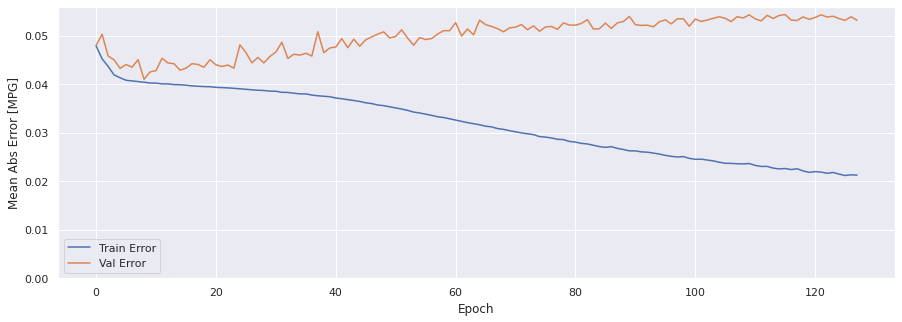

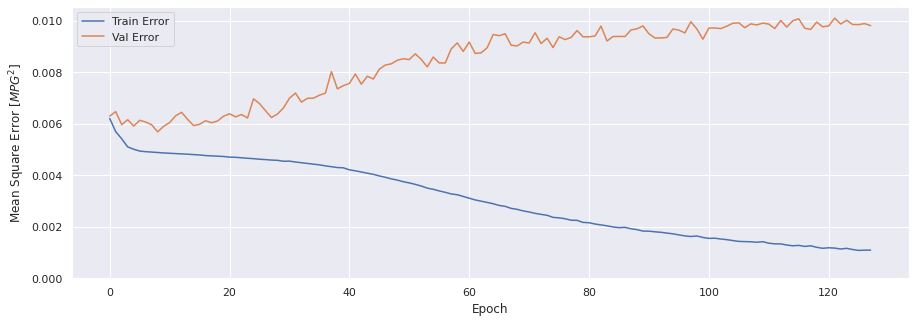

In [77]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history4)

### Evaluar predicciones

In [78]:
score_train4 = model4.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train4[0]}')
print(f'MAE:{score_train4[1]}')
print(f'MSE:{score_train4[2]}')
print(f'SMAPE:{score_train4[3]}')

1413/1413 [==============================] - 10s 7ms/step - loss: 0.0766 - mae: 0.0205 - mse: 0.0010 - smape: 0.5893
Loss:0.07661029696464539
MAE:0.020490871742367744
MSE:0.001013149623759091
SMAPE:0.5892612338066101


In [79]:
score_val4 = model4.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val4[0]}')
print(f'MAE:{score_val4[1]}')
print(f'MSE:{score_val4[2]}')
print(f'SMAPE:{score_val4[3]}')

303/303 [==============================] - 2s 7ms/step - loss: 0.0854 - mae: 0.0532 - mse: 0.0098 - smape: 0.8710
Loss:0.08539801836013794
MAE:0.053163811564445496
MSE:0.009800983592867851
SMAPE:0.8709754347801208


In [80]:
score_test4 = model4.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test4[0]}')
print(f'MAE:{score_test4[1]}')
print(f'MSE:{score_test4[2]}')
print(f'SMAPE:{score_test4[3]}')

303/303 [==============================] - 2s 7ms/step - loss: 0.0843 - mae: 0.0544 - mse: 0.0087 - smape: 0.8690
Loss:0.0843311995267868
MAE:0.05441472679376602
MSE:0.008734134957194328
SMAPE:0.86903315782547


### Comparativa de resultados

In [81]:
result = hist4.iloc[-1]
comparativa4 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test4[1], score_test4[2], score_test4[3], math.sqrt(score_test4[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

### Obtener predicciones

In [82]:
trainPredict4 = model4.predict(scaled_trainX)
testPredict4 = model4.predict(scaled_testX)

### Visualización de las predicciones

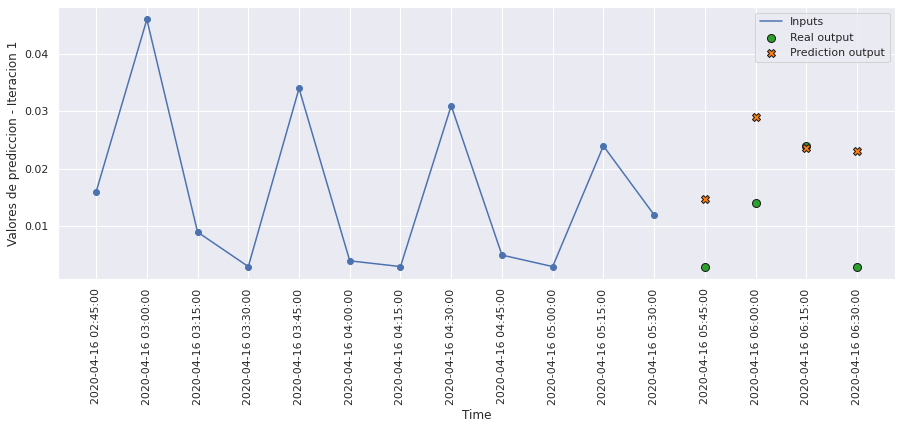

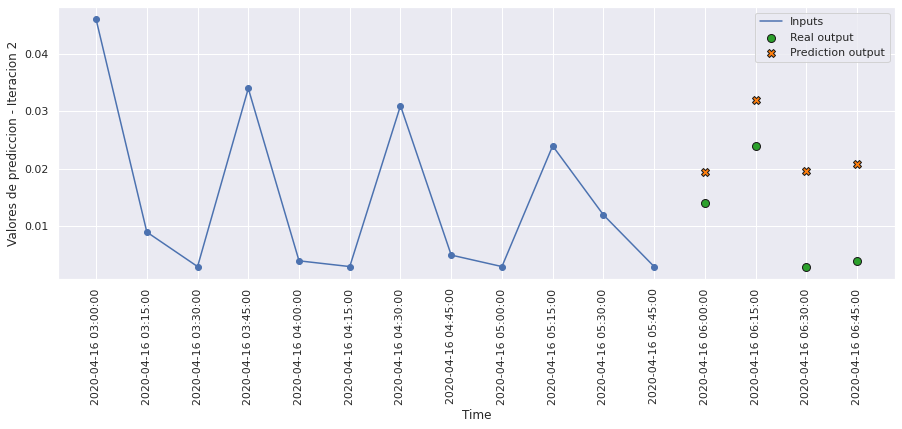

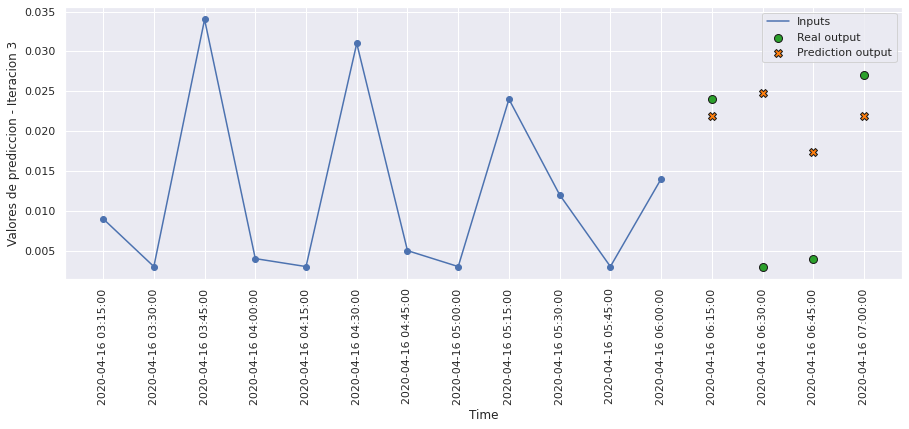

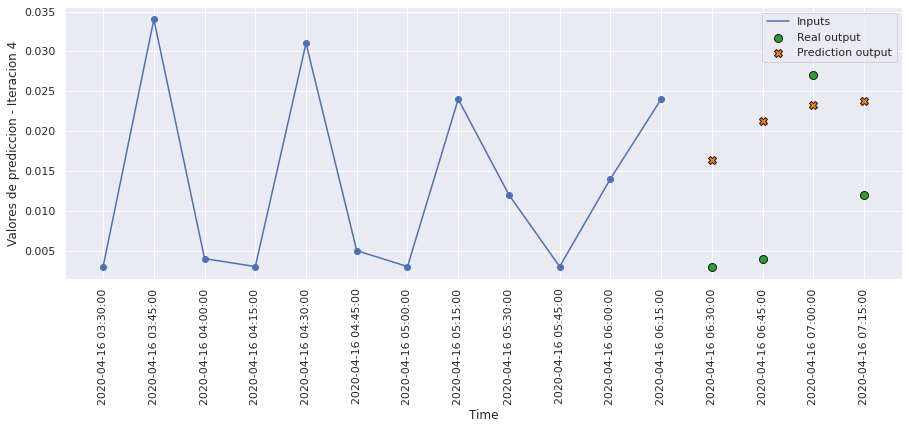

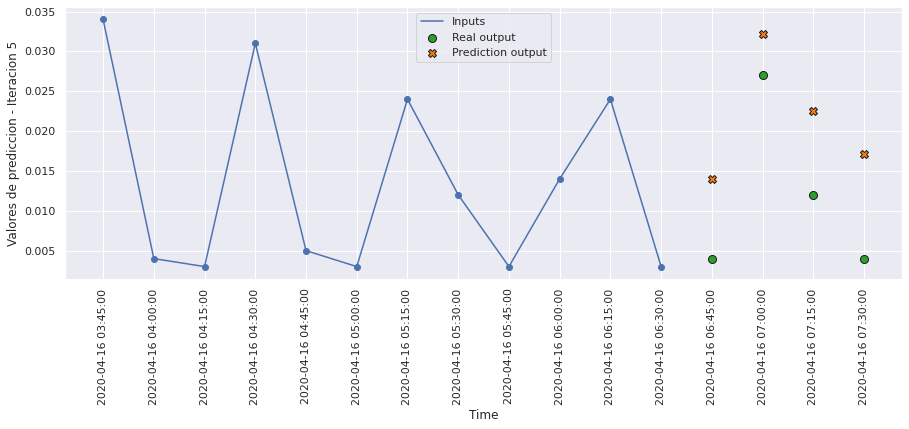

...

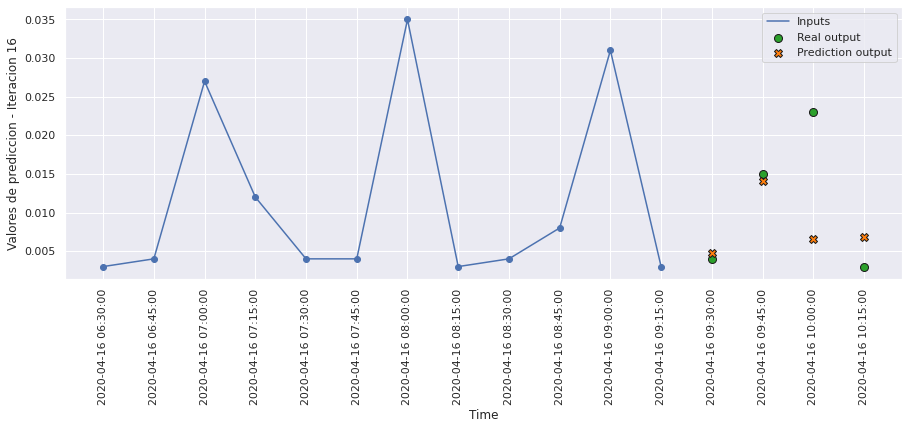

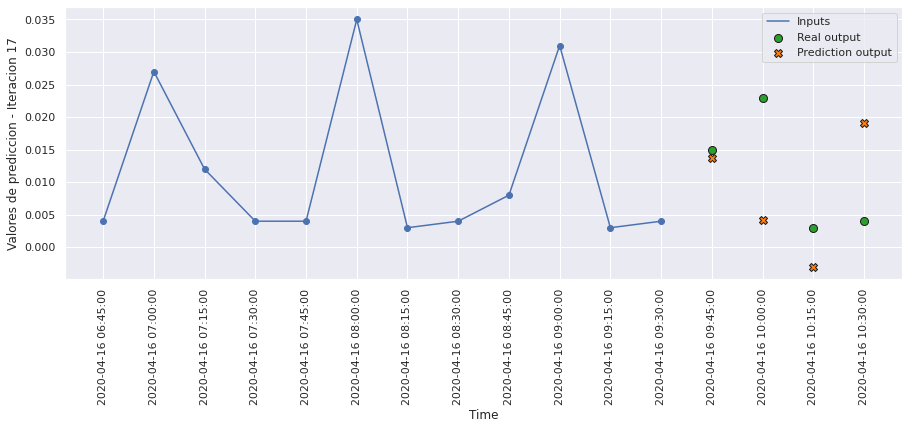

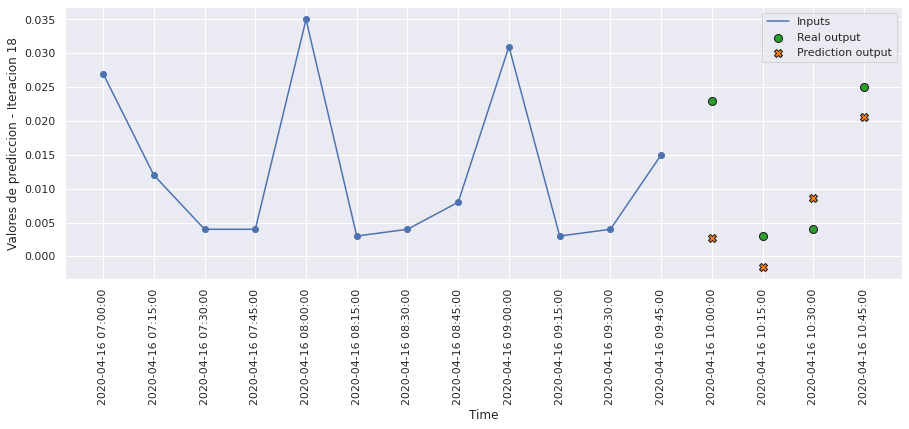

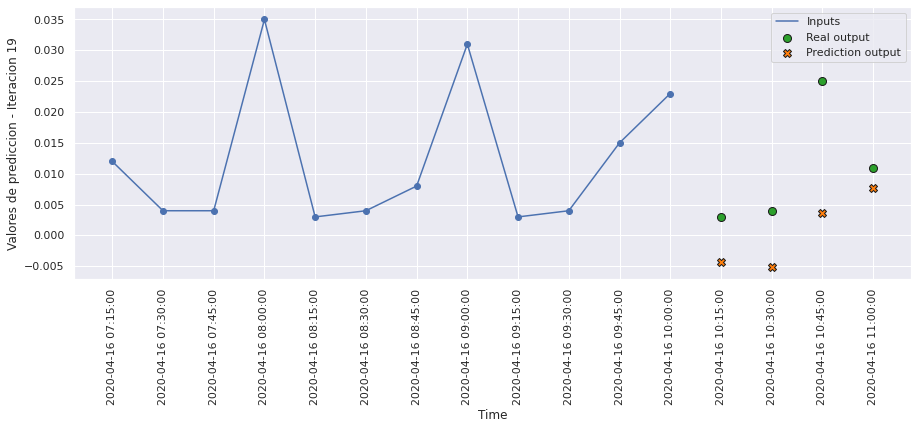

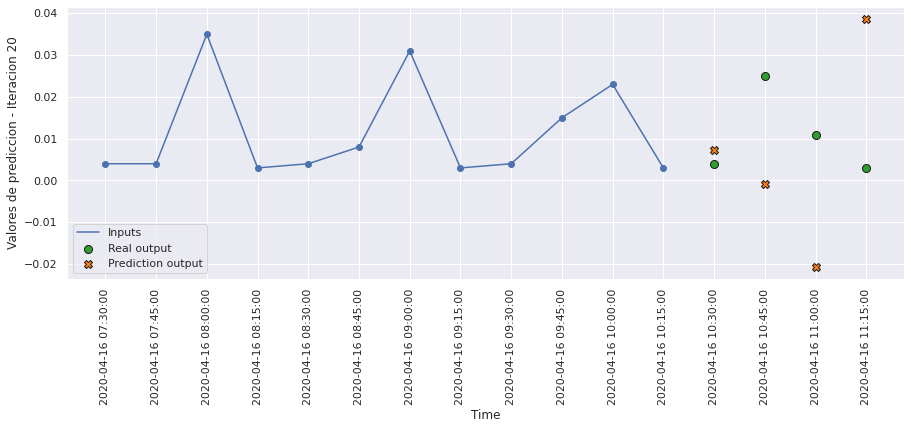

In [83]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict4, 20, 0)

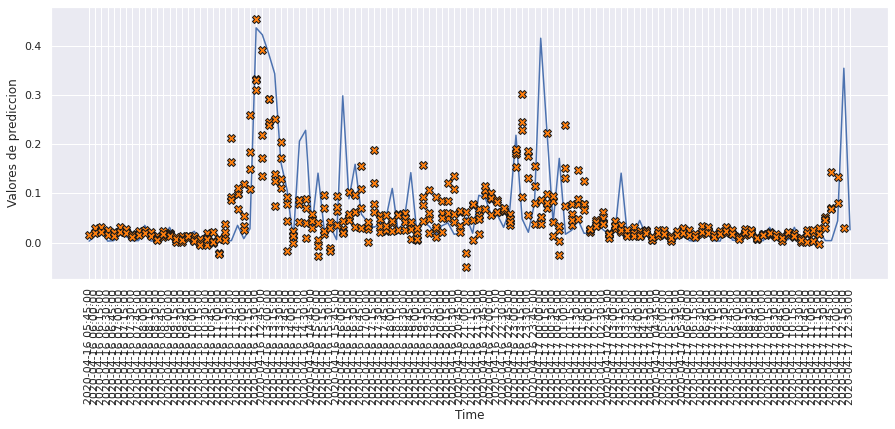

In [84]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict4, 120)

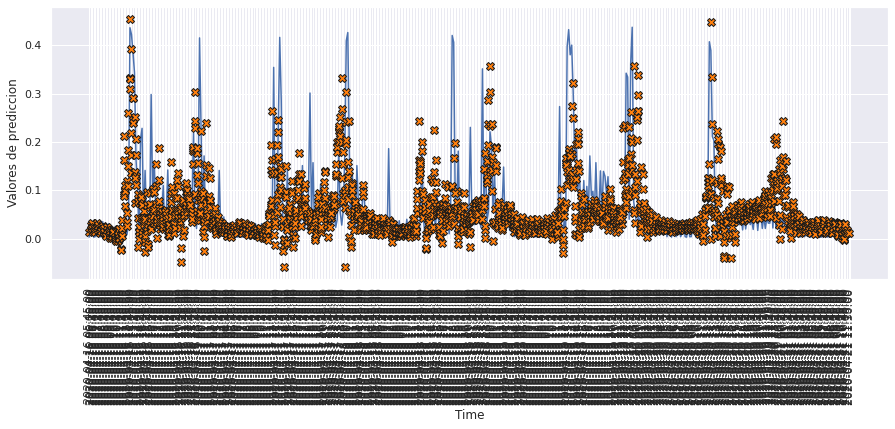

In [85]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict4, 500)

# MODELO 5: RECURRENT REGULARIZER L2 0.01

### Construimos el modelo

In [86]:
def build_model5():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.LSTM(128, activation='tanh', return_sequences = True, 
                             recurrent_regularizer=tf.keras.regularizers.L1L2(0, 0.01)),
        tf.keras.layers.LSTM(128, activation='tanh'),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [87]:
model5 = build_model5()
model5.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_8 (LSTM)               (None, 12, 128)           69632     
                                                                 
 lstm_9 (LSTM)               (None, 128)               131584    
                                                                 
 dense_4 (Dense)             (None, 4)                 516       
                                                                 
Total params: 201,732
Trainable params: 201,732
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [88]:
history5 = model5.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 7s 15ms/step - loss: 0.1039 - mae: 0.0477 - mse: 0.0062 - smape: 0.8639 - val_loss: 0.0064 - val_mae: 0.0482 - val_mse: 0.0064 - val_smape: 0.9408
Epoch 2/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0057 - mae: 0.0450 - mse: 0.0057 - smape: 0.8186 - val_loss: 0.0061 - val_mae: 0.0452 - val_mse: 0.0060 - val_smape: 0.8682
Epoch 3/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0054 - mae: 0.0435 - mse: 0.0054 - smape: 0.7932 - val_loss: 0.0060 - val_mae: 0.0458 - val_mse: 0.0059 - val_smape: 0.8545
Epoch 4/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0052 - mae: 0.0421 - mse: 0.0051 - smape: 0.7691 - val_loss: 0.0058 - val_mae: 0.0415 - val_mse: 0.0057 - val_smape: 0.8017
Epoch 5/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0050 - mae: 0.0412 - mse: 0.0050 - smape: 0.7510 - val_loss: 0.0061 - val_mae: 0.0428 - val_mse: 0.0060 - val_smap

354/354 [==============================] - 5s 14ms/step - loss: 0.0043 - mae: 0.0372 - mse: 0.0042 - smape: 0.7008 - val_loss: 0.0083 - val_mae: 0.0498 - val_mse: 0.0083 - val_smape: 0.7959
Epoch 42/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0043 - mae: 0.0370 - mse: 0.0042 - smape: 0.6987 - val_loss: 0.0079 - val_mae: 0.0482 - val_mse: 0.0078 - val_smape: 0.8209
Epoch 43/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0042 - mae: 0.0369 - mse: 0.0042 - smape: 0.6988 - val_loss: 0.0082 - val_mae: 0.0486 - val_mse: 0.0081 - val_smape: 0.8179
Epoch 44/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0042 - mae: 0.0368 - mse: 0.0041 - smape: 0.6985 - val_loss: 0.0082 - val_mae: 0.0483 - val_mse: 0.0081 - val_smape: 0.8020
Epoch 45/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0041 - mae: 0.0366 - mse: 0.0041 - smape: 0.6975 - val_loss: 0.0080 - val_mae: 0.0469 - val_mse: 0.0079 - val_smape: 0.794

354/354 [==============================] - 5s 14ms/step - loss: 0.0023 - mae: 0.0285 - mse: 0.0022 - smape: 0.6589 - val_loss: 0.0095 - val_mae: 0.0531 - val_mse: 0.0094 - val_smape: 0.9053
Epoch 82/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0023 - mae: 0.0283 - mse: 0.0022 - smape: 0.6578 - val_loss: 0.0096 - val_mae: 0.0535 - val_mse: 0.0095 - val_smape: 0.9286
Epoch 83/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0023 - mae: 0.0282 - mse: 0.0022 - smape: 0.6582 - val_loss: 0.0094 - val_mae: 0.0522 - val_mse: 0.0093 - val_smape: 0.8663
Epoch 84/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0022 - mae: 0.0280 - mse: 0.0021 - smape: 0.6567 - val_loss: 0.0095 - val_mae: 0.0535 - val_mse: 0.0094 - val_smape: 0.9214
Epoch 85/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0022 - mae: 0.0277 - mse: 0.0021 - smape: 0.6553 - val_loss: 0.0093 - val_mae: 0.0517 - val_mse: 0.0091 - val_smape: 0.874

In [89]:
hist5 = pd.DataFrame(history5.history)
hist5['epoch'] = history5.epoch
hist5

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.103949,0.047652,0.006179,0.863857,0.006428,0.048223,0.006413,0.940798,0
1,0.005684,0.044957,0.005667,0.818565,0.006061,0.045240,0.006045,0.868236,1
2,0.005402,0.043455,0.005385,0.793230,0.005964,0.045800,0.005943,0.854517,2
3,0.005154,0.042065,0.005130,0.769137,0.005753,0.041487,0.005727,0.801690,3
4,0.005028,0.041214,0.005005,0.750953,0.006066,0.042826,0.006030,0.754866,4
...,...,...,...,...,...,...,...,...,...
99,0.001751,0.025335,0.001660,0.638502,0.009652,0.053004,0.009530,0.861428,99
100,0.001713,0.025133,0.001630,0.636026,0.009598,0.052474,0.009488,0.931682,100
101,0.001718,0.025183,0.001628,0.638016,0.009395,0.051874,0.009274,0.859263,101
102,0.001665,0.024846,0.001579,0.633821,0.009530,0.052470,0.009458,0.895880,102


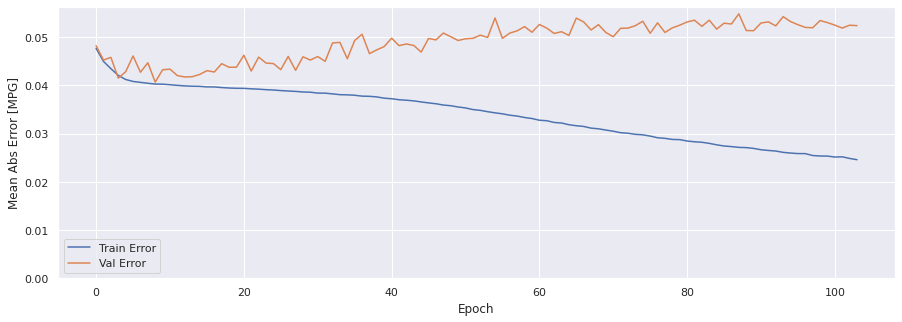

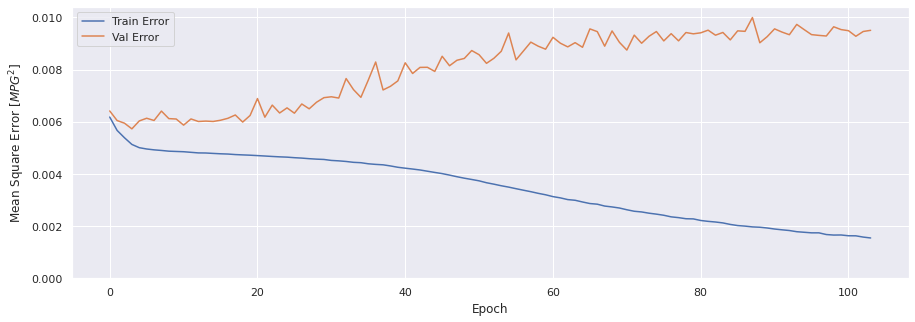

In [90]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history5)

### Evaluar predicciones

In [91]:
score_train5 = model5.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train5[0]}')
print(f'MAE:{score_train5[1]}')
print(f'MSE:{score_train5[2]}')
print(f'SMAPE:{score_train5[3]}')

1413/1413 [==============================] - 8s 6ms/step - loss: 0.0017 - mae: 0.0248 - mse: 0.0015 - smape: 0.6309
Loss:0.0016710181953385472
MAE:0.024762462824583054
MSE:0.001531493733637035
SMAPE:0.6309013366699219


In [92]:
score_val5 = model5.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val5[0]}')
print(f'MAE:{score_val5[1]}')
print(f'MSE:{score_val5[2]}')
print(f'SMAPE:{score_val5[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0096 - mae: 0.0524 - mse: 0.0095 - smape: 0.8555
Loss:0.009641292504966259
MAE:0.052372176200151443
MSE:0.009501764550805092
SMAPE:0.8555285930633545


In [93]:
score_test5 = model5.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test5[0]}')
print(f'MAE:{score_test5[1]}')
print(f'MSE:{score_test5[2]}')
print(f'SMAPE:{score_test5[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0088 - mae: 0.0543 - mse: 0.0086 - smape: 0.8562
Loss:0.008752006106078625
MAE:0.0543043315410614
MSE:0.008612478151917458
SMAPE:0.8562172055244446


### Comparativa de resultados

In [94]:
result = hist5.iloc[-1]
comparativa5 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test5[1], score_test5[2], score_test5[3], math.sqrt(score_test5[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

### Obtener predicciones

In [95]:
trainPredict5 = model5.predict(scaled_trainX)
testPredict5 = model5.predict(scaled_testX)

### Visualización de las predicciones

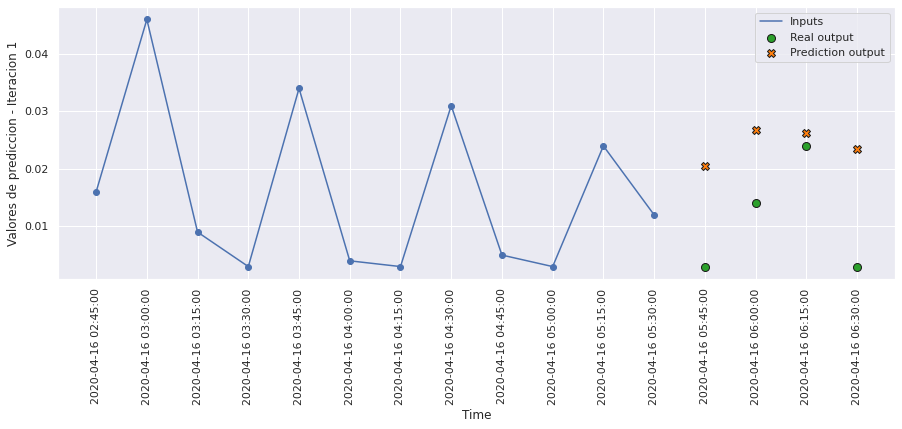

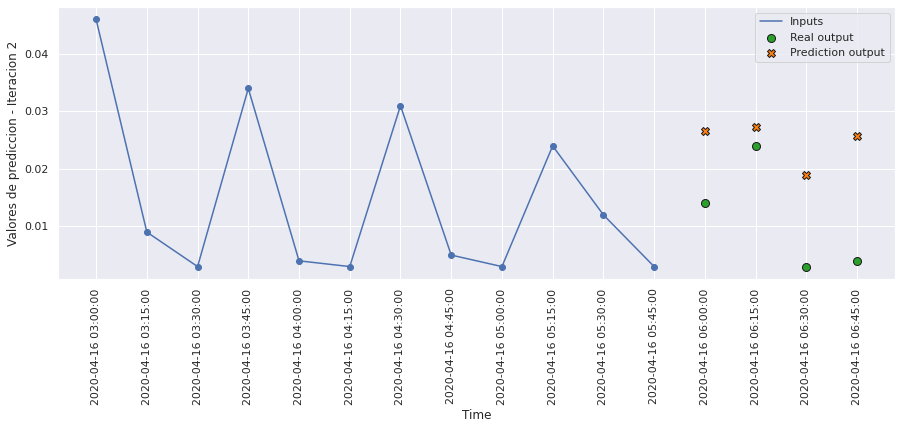

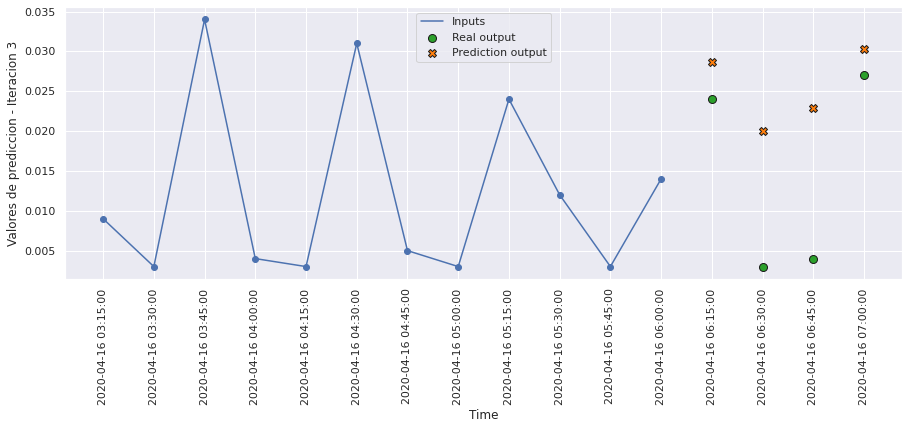

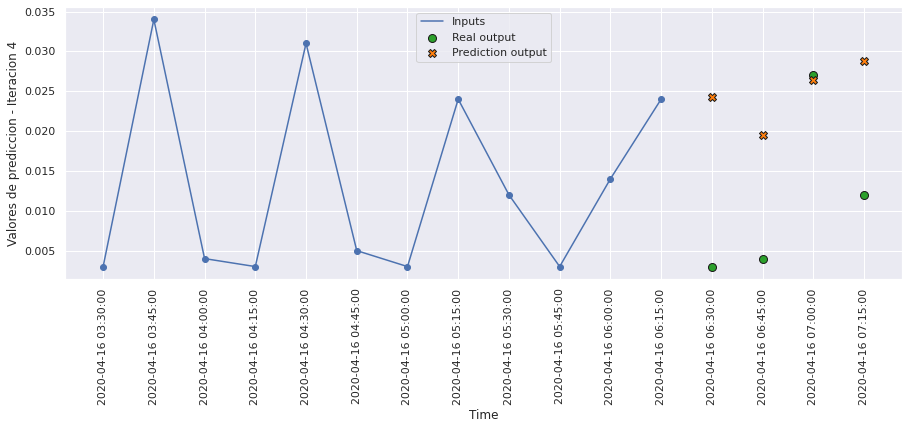

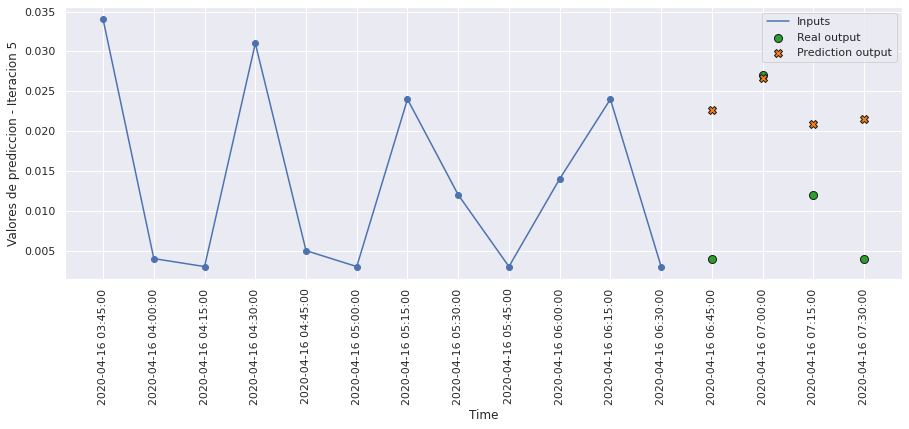

...

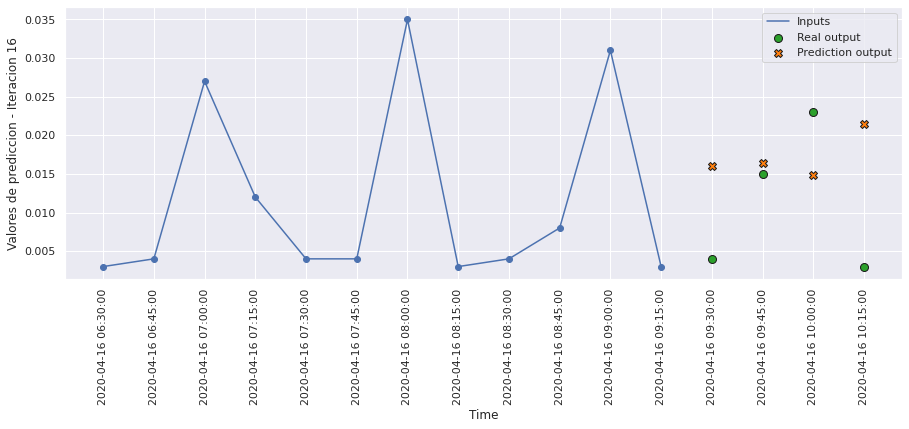

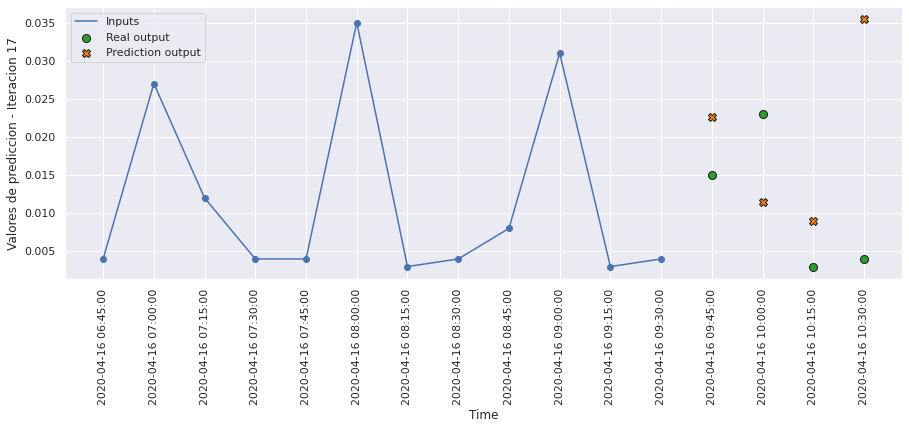

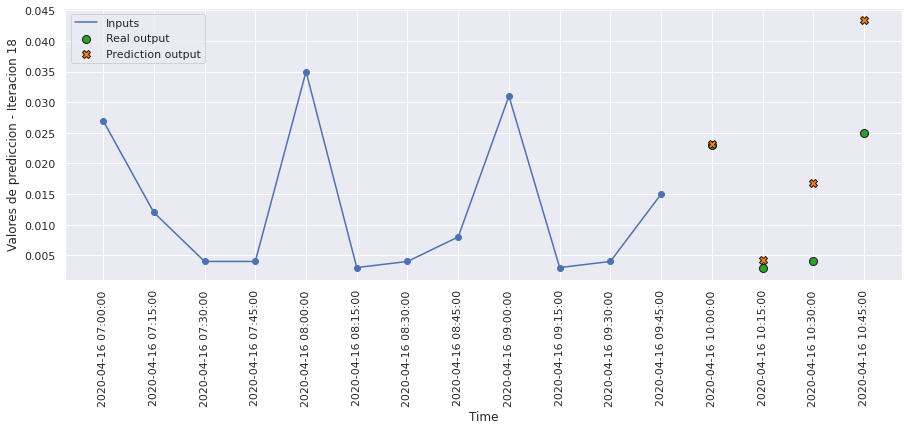

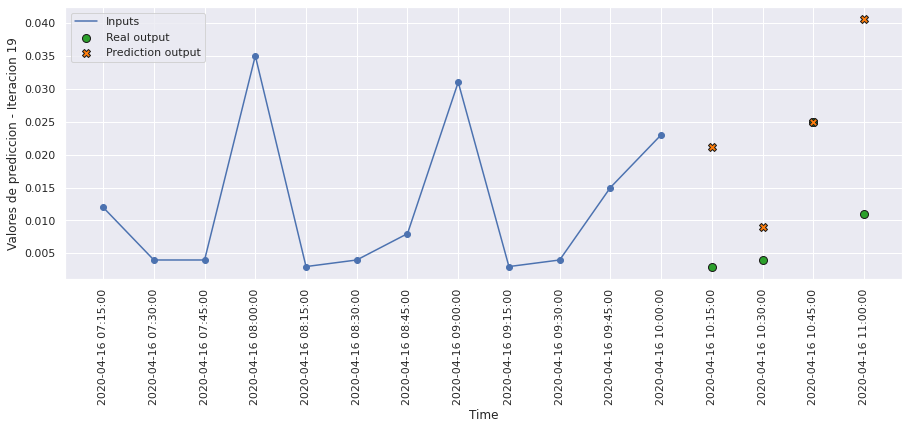

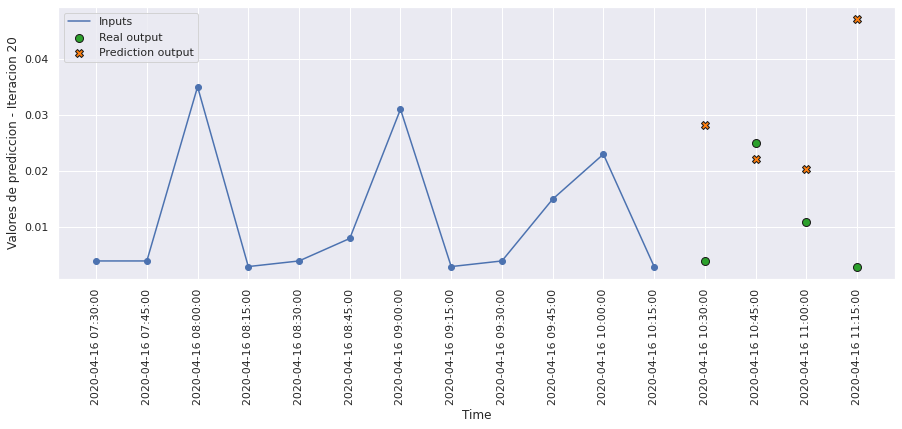

In [96]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, 
                        testPredict5, 20, 0)

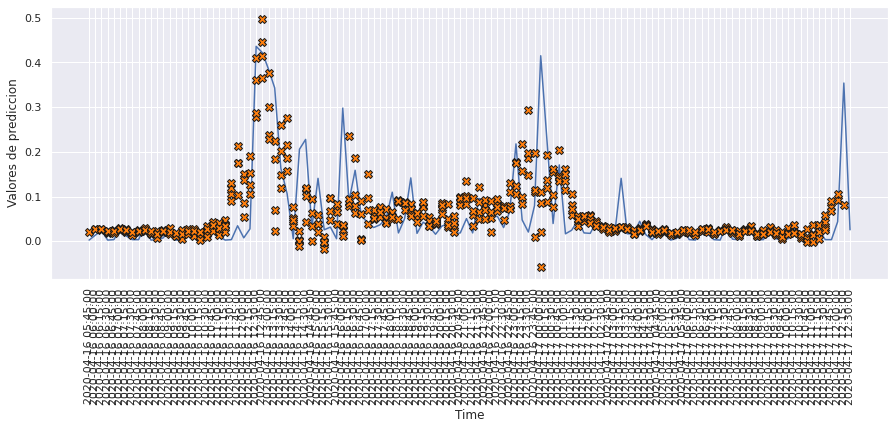

In [97]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict5, 120)

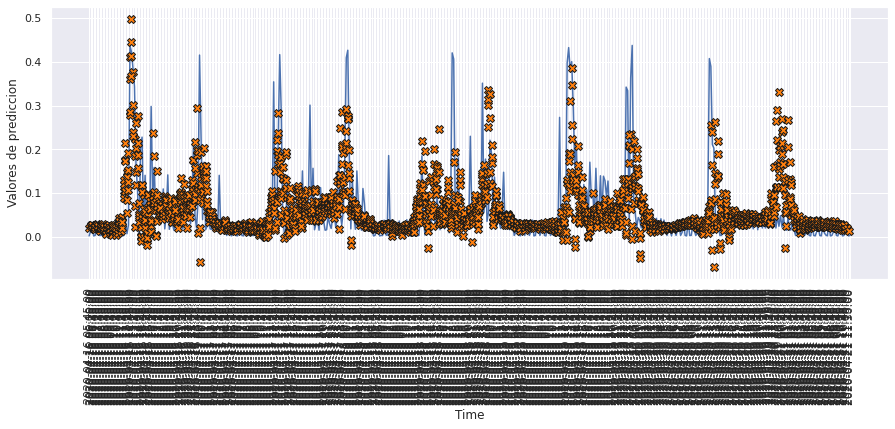

In [98]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict5, 500)

# MODELO 6: BIAS REGULARIZER L1 0.01

### Construimos el modelo

In [99]:
def build_model6():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.LSTM(128, activation='tanh', return_sequences = True, 
                             bias_regularizer=tf.keras.regularizers.L1L2(0.01, 0)),
        tf.keras.layers.LSTM(128, activation='tanh'),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [100]:
model6 = build_model6()
model6.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_10 (LSTM)              (None, 12, 128)           69632     
                                                                 
 lstm_11 (LSTM)              (None, 128)               131584    
                                                                 
 dense_5 (Dense)             (None, 4)                 516       
                                                                 
Total params: 201,732
Trainable params: 201,732
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [101]:
history6 = model6.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 7s 14ms/step - loss: 1.0614 - mae: 0.0473 - mse: 0.0061 - smape: 0.8579 - val_loss: 0.8336 - val_mae: 0.0458 - val_mse: 0.0062 - val_smape: 0.9584
Epoch 2/200
354/354 [==============================] - 4s 12ms/step - loss: 0.6077 - mae: 0.0442 - mse: 0.0055 - smape: 0.8020 - val_loss: 0.3804 - val_mae: 0.0473 - val_mse: 0.0059 - val_smape: 0.8281
Epoch 3/200
354/354 [==============================] - 4s 12ms/step - loss: 0.1610 - mae: 0.0419 - mse: 0.0051 - smape: 0.7592 - val_loss: 0.0064 - val_mae: 0.0423 - val_mse: 0.0057 - val_smape: 0.7442
Epoch 4/200
354/354 [==============================] - 4s 12ms/step - loss: 0.0056 - mae: 0.0411 - mse: 0.0050 - smape: 0.7444 - val_loss: 0.0068 - val_mae: 0.0435 - val_mse: 0.0062 - val_smape: 0.7446
Epoch 5/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0056 - mae: 0.0408 - mse: 0.0050 - smape: 0.7391 - val_loss: 0.0064 - val_mae: 0.0400 - val_mse: 0.0059 - val_smap

354/354 [==============================] - 5s 14ms/step - loss: 0.0045 - mae: 0.0359 - mse: 0.0039 - smape: 0.6903 - val_loss: 0.0094 - val_mae: 0.0515 - val_mse: 0.0088 - val_smape: 0.7925
Epoch 42/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0045 - mae: 0.0356 - mse: 0.0039 - smape: 0.6886 - val_loss: 0.0086 - val_mae: 0.0483 - val_mse: 0.0081 - val_smape: 0.7779
Epoch 43/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0044 - mae: 0.0353 - mse: 0.0038 - smape: 0.6870 - val_loss: 0.0090 - val_mae: 0.0499 - val_mse: 0.0084 - val_smape: 0.7955
Epoch 44/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0043 - mae: 0.0350 - mse: 0.0037 - smape: 0.6842 - val_loss: 0.0087 - val_mae: 0.0484 - val_mse: 0.0082 - val_smape: 0.7977
Epoch 45/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0043 - mae: 0.0347 - mse: 0.0037 - smape: 0.6822 - val_loss: 0.0091 - val_mae: 0.0493 - val_mse: 0.0086 - val_smape: 0.776

354/354 [==============================] - 5s 14ms/step - loss: 0.0021 - mae: 0.0236 - mse: 0.0015 - smape: 0.6107 - val_loss: 0.0100 - val_mae: 0.0519 - val_mse: 0.0094 - val_smape: 0.8546
Epoch 82/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0021 - mae: 0.0235 - mse: 0.0015 - smape: 0.6108 - val_loss: 0.0100 - val_mae: 0.0522 - val_mse: 0.0094 - val_smape: 0.8471
Epoch 83/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0021 - mae: 0.0235 - mse: 0.0015 - smape: 0.6096 - val_loss: 0.0100 - val_mae: 0.0521 - val_mse: 0.0095 - val_smape: 0.8638
Epoch 84/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0020 - mae: 0.0232 - mse: 0.0014 - smape: 0.6085 - val_loss: 0.0105 - val_mae: 0.0527 - val_mse: 0.0100 - val_smape: 0.8412
Epoch 85/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0019 - mae: 0.0227 - mse: 0.0014 - smape: 0.6022 - val_loss: 0.0101 - val_mae: 0.0526 - val_mse: 0.0096 - val_smape: 0.857

In [102]:
hist6 = pd.DataFrame(history6.history)
hist6['epoch'] = history6.epoch
hist6

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,1.061376,0.047297,0.006105,0.857933,0.833555,0.045811,0.006194,0.958446,0
1,0.607670,0.044194,0.005535,0.801954,0.380358,0.047305,0.005923,0.828113,1
2,0.161034,0.041874,0.005131,0.759244,0.006436,0.042345,0.005739,0.744204,2
3,0.005633,0.041128,0.005008,0.744372,0.006808,0.043488,0.006159,0.744637,3
4,0.005575,0.040833,0.004959,0.739059,0.006449,0.040003,0.005882,0.722759,4
...,...,...,...,...,...,...,...,...,...
98,0.001512,0.019756,0.000964,0.574654,0.010162,0.052860,0.009578,0.874907,98
99,0.001534,0.019825,0.000983,0.573134,0.010058,0.052850,0.009504,0.890292,99
100,0.001501,0.019526,0.000944,0.571745,0.010188,0.053107,0.009642,0.872524,100
101,0.001544,0.019899,0.000985,0.575661,0.010165,0.052450,0.009587,0.862777,101


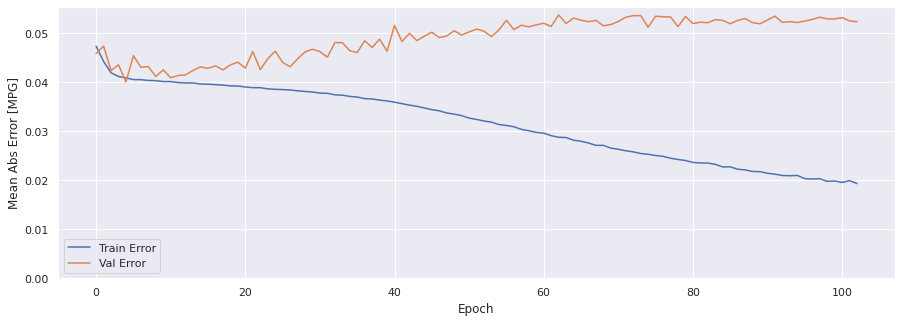

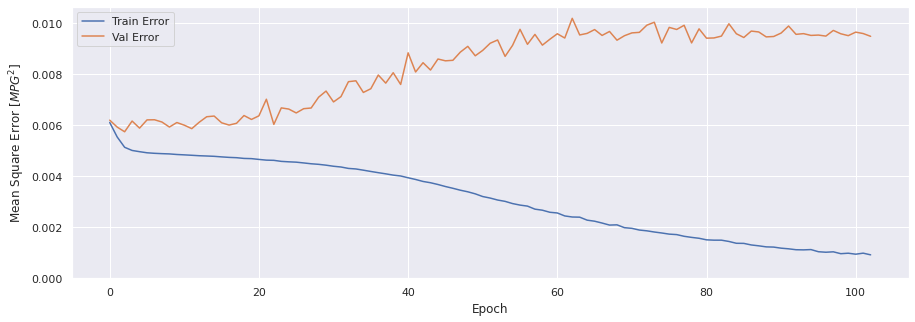

In [103]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history6)

### Evaluar predicciones

In [104]:
score_train6 = model6.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train6[0]}')
print(f'MAE:{score_train6[1]}')
print(f'MSE:{score_train6[2]}')
print(f'SMAPE:{score_train6[3]}')

1413/1413 [==============================] - 10s 7ms/step - loss: 0.0014 - mae: 0.0185 - mse: 8.3575e-04 - smape: 0.5544
Loss:0.0013945931568741798
MAE:0.01846054196357727
MSE:0.0008357508922927082
SMAPE:0.5544291734695435


In [105]:
score_val6 = model6.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val6[0]}')
print(f'MAE:{score_val6[1]}')
print(f'MSE:{score_val6[2]}')
print(f'SMAPE:{score_val6[3]}')

303/303 [==============================] - 2s 7ms/step - loss: 0.0100 - mae: 0.0523 - mse: 0.0095 - smape: 0.8627
Loss:0.010036677122116089
MAE:0.052274852991104126
MSE:0.009477834217250347
SMAPE:0.8626627326011658


In [106]:
score_test6 = model6.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test6[0]}')
print(f'MAE:{score_test6[1]}')
print(f'MSE:{score_test6[2]}')
print(f'SMAPE:{score_test6[3]}')

303/303 [==============================] - 2s 7ms/step - loss: 0.0091 - mae: 0.0537 - mse: 0.0086 - smape: 0.8660
Loss:0.009138688445091248
MAE:0.05372827500104904
MSE:0.008579844608902931
SMAPE:0.8660131096839905


### Comparativa de resultados

In [107]:
result = hist6.iloc[-1]
comparativa6 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test6[1], score_test6[2], score_test6[3], math.sqrt(score_test6[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

### Obtener predicciones

In [108]:
trainPredict6 = model6.predict(scaled_trainX)
testPredict6 = model6.predict(scaled_testX)

### Visualización de las predicciones

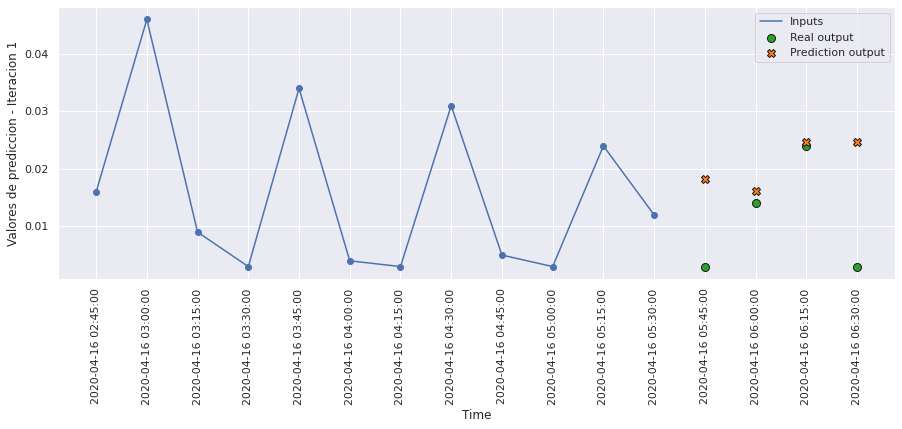

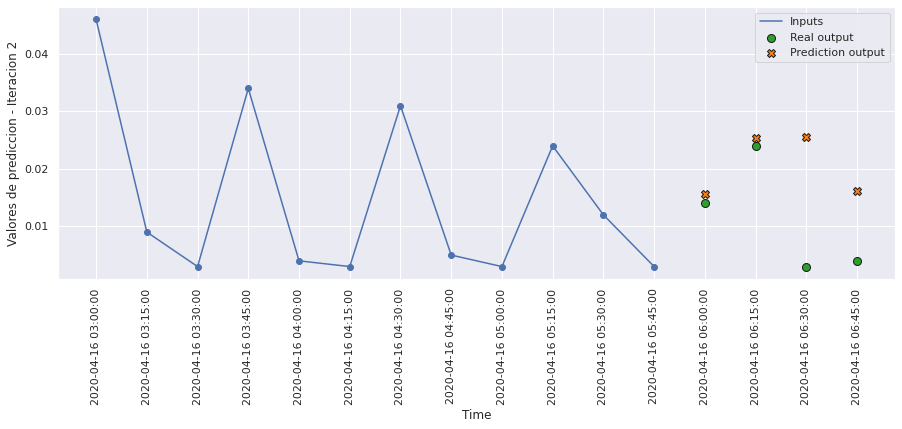

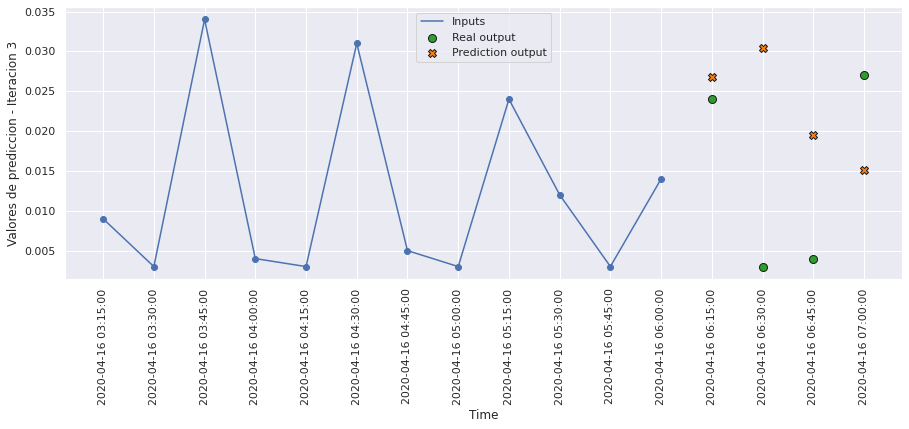

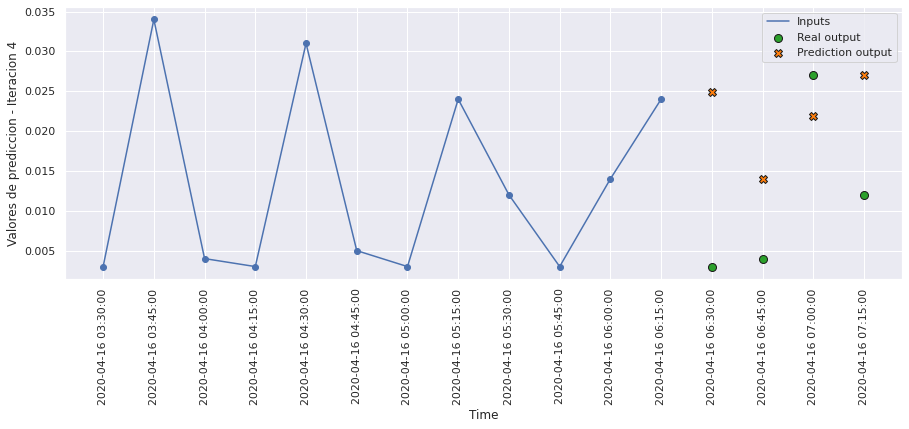

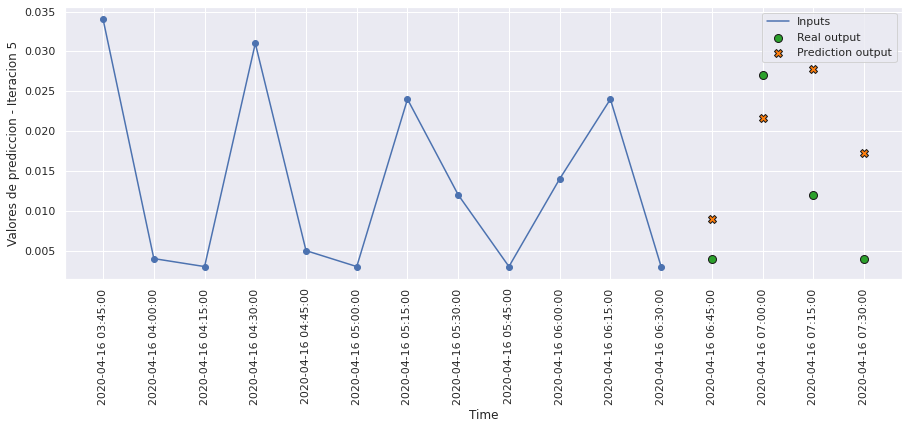

...

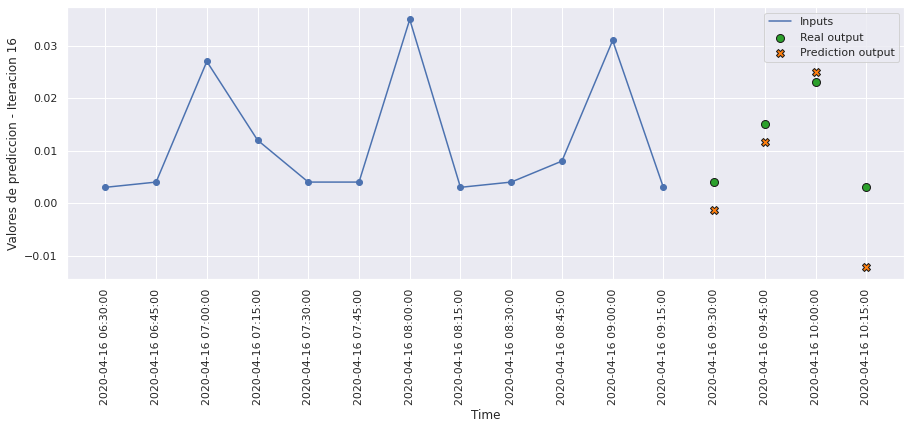

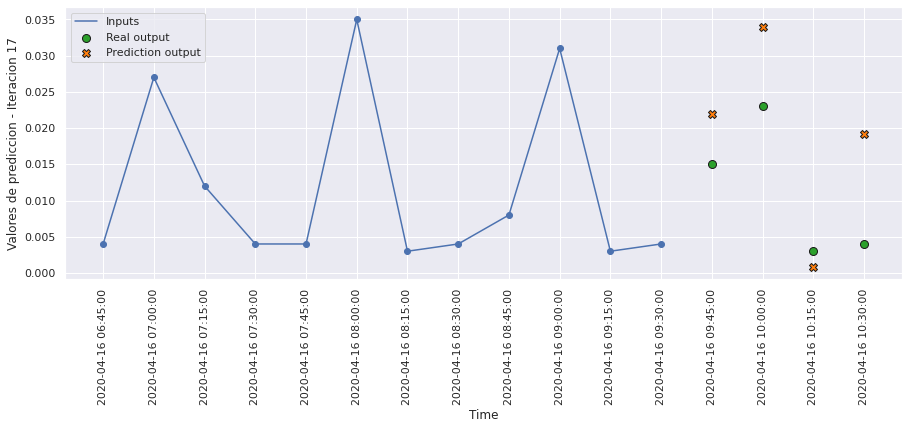

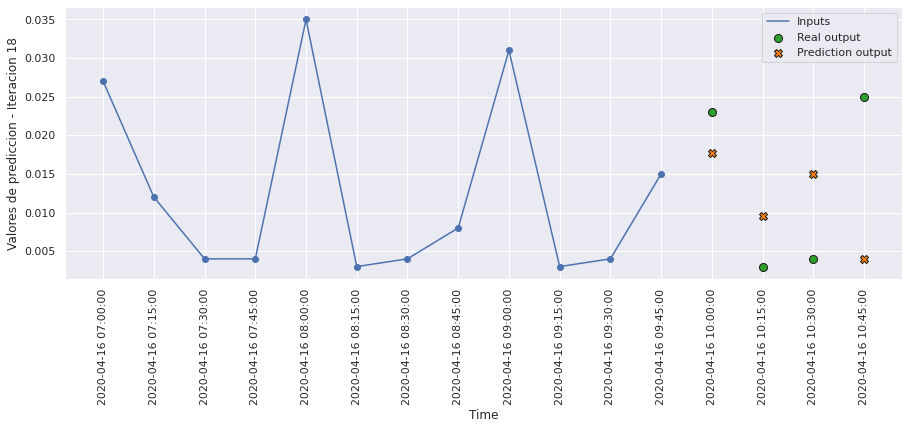

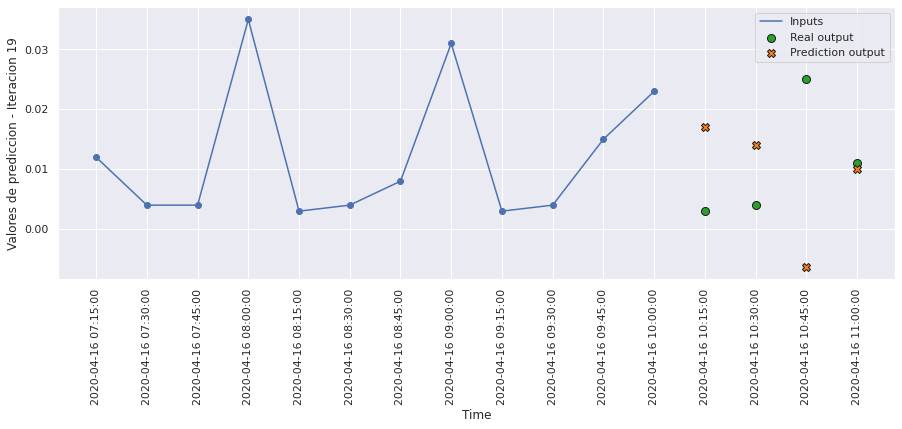

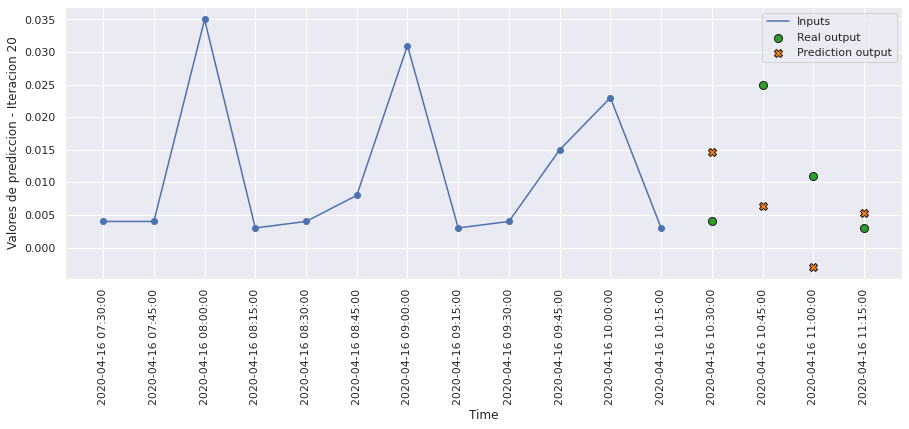

In [109]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, 
                        testPredict6, 20, 0)

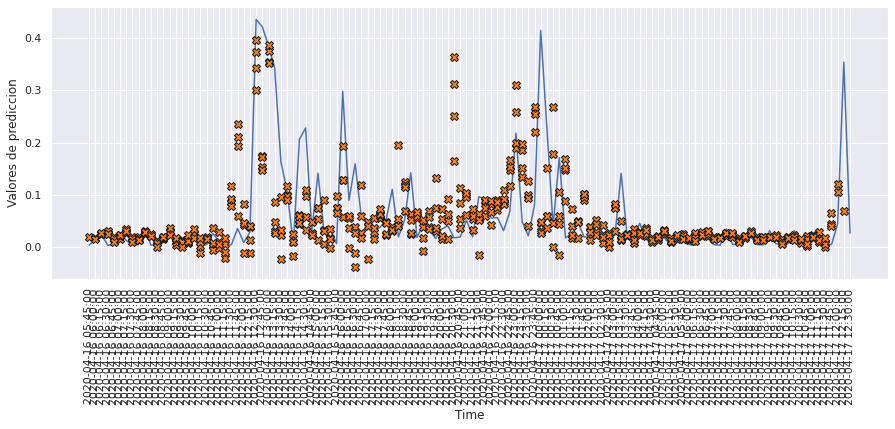

In [110]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict6, 120)

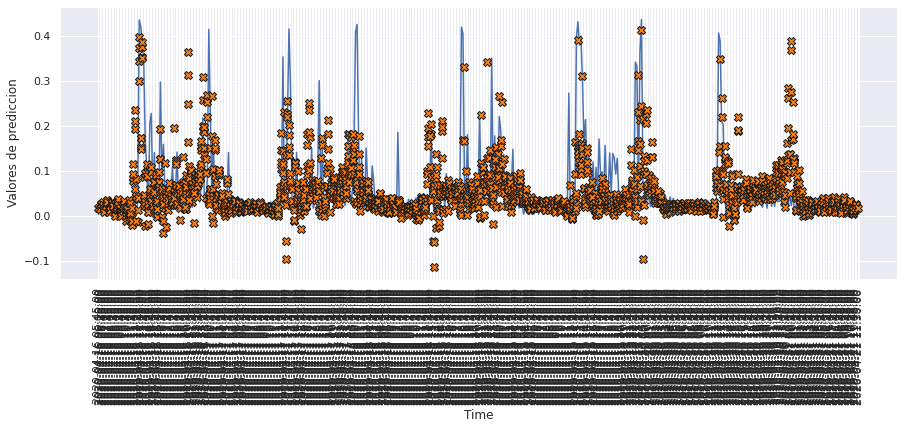

In [111]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict6, 500)

# MODELO 7: BIAS REGULARIZER L2 0.01

### Construimos el modelo

In [112]:
def build_model7():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.LSTM(128, activation='tanh', return_sequences = True, 
                             bias_regularizer=tf.keras.regularizers.L1L2(0, 0.01)),
        tf.keras.layers.LSTM(128, activation='tanh'),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [113]:
model7 = build_model7()
model7.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_12 (LSTM)              (None, 12, 128)           69632     
                                                                 
 lstm_13 (LSTM)              (None, 128)               131584    
                                                                 
 dense_6 (Dense)             (None, 4)                 516       
                                                                 
Total params: 201,732
Trainable params: 201,732
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [114]:
history7 = model7.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 7s 15ms/step - loss: 0.9057 - mae: 0.0473 - mse: 0.0061 - smape: 0.8589 - val_loss: 0.5896 - val_mae: 0.0470 - val_mse: 0.0061 - val_smape: 0.9057
Epoch 2/200
354/354 [==============================] - 5s 14ms/step - loss: 0.3876 - mae: 0.0442 - mse: 0.0055 - smape: 0.7991 - val_loss: 0.2291 - val_mae: 0.0420 - val_mse: 0.0059 - val_smape: 0.7791
Epoch 3/200
354/354 [==============================] - 5s 14ms/step - loss: 0.1386 - mae: 0.0419 - mse: 0.0051 - smape: 0.7600 - val_loss: 0.0734 - val_mae: 0.0438 - val_mse: 0.0058 - val_smape: 0.7799
Epoch 4/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0412 - mae: 0.0412 - mse: 0.0050 - smape: 0.7470 - val_loss: 0.0209 - val_mae: 0.0407 - val_mse: 0.0057 - val_smape: 0.7486
Epoch 5/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0121 - mae: 0.0408 - mse: 0.0050 - smape: 0.7404 - val_loss: 0.0081 - val_mae: 0.0425 - val_mse: 0.0057 - val_smap

354/354 [==============================] - 5s 13ms/step - loss: 0.0038 - mae: 0.0354 - mse: 0.0038 - smape: 0.6871 - val_loss: 0.0085 - val_mae: 0.0491 - val_mse: 0.0085 - val_smape: 0.8012
Epoch 42/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0038 - mae: 0.0351 - mse: 0.0037 - smape: 0.6851 - val_loss: 0.0082 - val_mae: 0.0492 - val_mse: 0.0082 - val_smape: 0.8052
Epoch 43/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0037 - mae: 0.0347 - mse: 0.0037 - smape: 0.6829 - val_loss: 0.0083 - val_mae: 0.0479 - val_mse: 0.0083 - val_smape: 0.7752
Epoch 44/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0036 - mae: 0.0345 - mse: 0.0036 - smape: 0.6808 - val_loss: 0.0084 - val_mae: 0.0497 - val_mse: 0.0084 - val_smape: 0.8142
Epoch 45/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0035 - mae: 0.0341 - mse: 0.0035 - smape: 0.6794 - val_loss: 0.0088 - val_mae: 0.0494 - val_mse: 0.0088 - val_smape: 0.799

354/354 [==============================] - 5s 14ms/step - loss: 0.0014 - mae: 0.0227 - mse: 0.0013 - smape: 0.6019 - val_loss: 0.0098 - val_mae: 0.0525 - val_mse: 0.0098 - val_smape: 0.8442
Epoch 82/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0013 - mae: 0.0224 - mse: 0.0013 - smape: 0.5982 - val_loss: 0.0101 - val_mae: 0.0536 - val_mse: 0.0101 - val_smape: 0.8386
Epoch 83/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0013 - mae: 0.0223 - mse: 0.0013 - smape: 0.5980 - val_loss: 0.0097 - val_mae: 0.0524 - val_mse: 0.0097 - val_smape: 0.8685
Epoch 84/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0013 - mae: 0.0222 - mse: 0.0013 - smape: 0.5977 - val_loss: 0.0099 - val_mae: 0.0534 - val_mse: 0.0099 - val_smape: 0.8724
Epoch 85/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0012 - mae: 0.0215 - mse: 0.0012 - smape: 0.5903 - val_loss: 0.0099 - val_mae: 0.0530 - val_mse: 0.0099 - val_smape: 0.836

In [115]:
hist7 = pd.DataFrame(history7.history)
hist7['epoch'] = history7.epoch
hist7

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.905656,0.047322,0.006113,0.858915,0.589633,0.046992,0.006132,0.905660,0
1,0.387620,0.044193,0.005549,0.799122,0.229127,0.042014,0.005931,0.779056,1
2,0.138647,0.041948,0.005141,0.760001,0.073445,0.043835,0.005825,0.779947,2
3,0.041182,0.041188,0.005010,0.746982,0.020908,0.040743,0.005747,0.748607,3
4,0.012074,0.040807,0.004959,0.740353,0.008084,0.042469,0.005744,0.750996,4
...,...,...,...,...,...,...,...,...,...
107,0.000763,0.017776,0.000758,0.550481,0.010358,0.055244,0.010352,0.872887,107
108,0.000784,0.017885,0.000778,0.549977,0.010208,0.054621,0.010203,0.865341,108
109,0.000709,0.017242,0.000705,0.543240,0.010173,0.054569,0.010170,0.872227,109
110,0.000659,0.016672,0.000656,0.537216,0.009761,0.053435,0.009756,0.849075,110


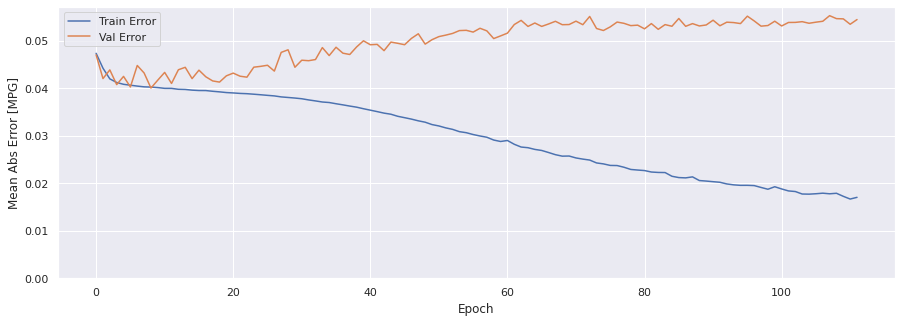

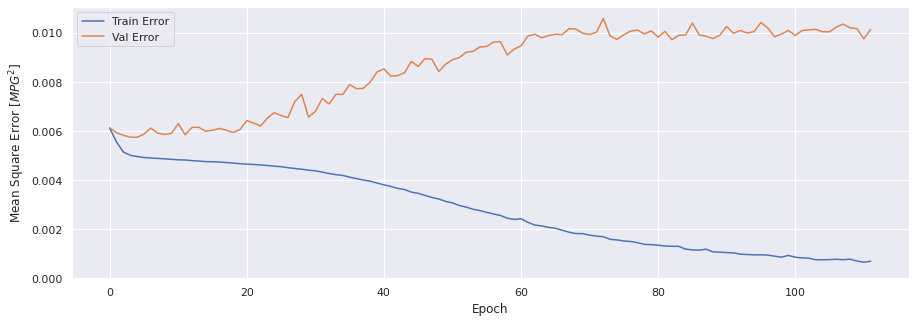

In [116]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history7)

### Evaluar predicciones

In [117]:
score_train7 = model7.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train7[0]}')
print(f'MAE:{score_train7[1]}')
print(f'MSE:{score_train7[2]}')
print(f'SMAPE:{score_train7[3]}')

1413/1413 [==============================] - 10s 7ms/step - loss: 6.4989e-04 - mae: 0.0166 - mse: 6.4546e-04 - smape: 0.5290
Loss:0.0006498903967440128
MAE:0.016597602516412735
MSE:0.0006454577087424695
SMAPE:0.5290132761001587


In [118]:
score_val7 = model7.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val7[0]}')
print(f'MAE:{score_val7[1]}')
print(f'MSE:{score_val7[2]}')
print(f'SMAPE:{score_val7[3]}')

303/303 [==============================] - 2s 7ms/step - loss: 0.0101 - mae: 0.0544 - mse: 0.0101 - smape: 0.8462
Loss:0.010136631317436695
MAE:0.054427169263362885
MSE:0.010132203809916973
SMAPE:0.8461578488349915


In [119]:
score_test7 = model7.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test7[0]}')
print(f'MAE:{score_test7[1]}')
print(f'MSE:{score_test7[2]}')
print(f'SMAPE:{score_test7[3]}')

303/303 [==============================] - 2s 7ms/step - loss: 0.0092 - mae: 0.0560 - mse: 0.0092 - smape: 0.8647
Loss:0.009214778430759907
MAE:0.056043218821287155
MSE:0.009210344403982162
SMAPE:0.8647388219833374


### Comparativa de resultados

In [120]:
result = hist7.iloc[-1]
comparativa7 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test7[1], score_test7[2], score_test7[3], math.sqrt(score_test7[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa7.style.set_caption("Método de ventana de un paso - CONVLSTM 1D")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.017031,0.000693,0.540686,0.026317
VALIDACION,0.054427,0.010132,0.846830,0.100659
TEST,0.056043,0.009210,0.864739,0.095971


### Obtener predicciones

In [121]:
trainPredict7 = model7.predict(scaled_trainX)
testPredict7 = model7.predict(scaled_testX)

### Visualización de las predicciones

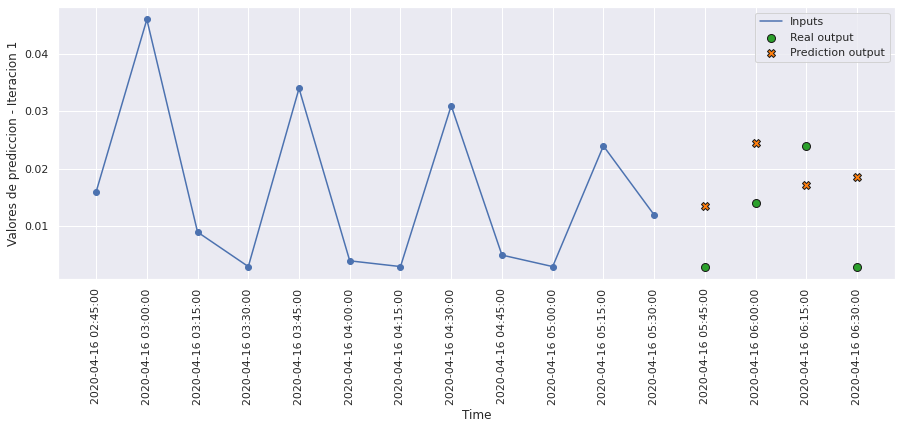

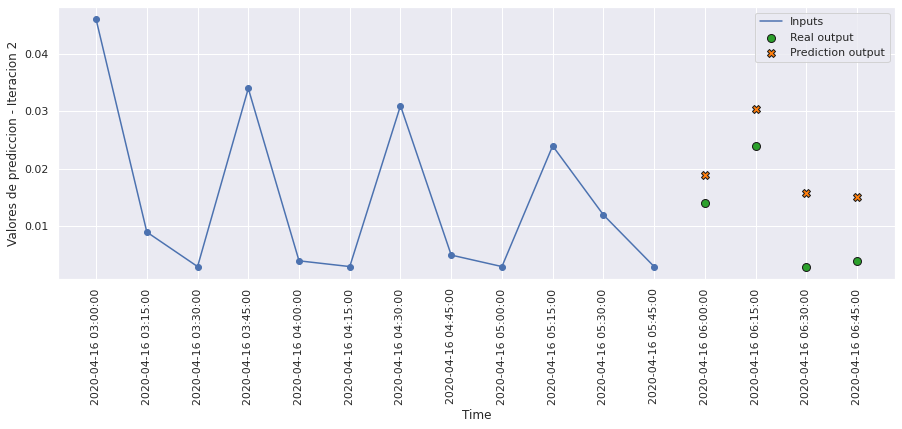

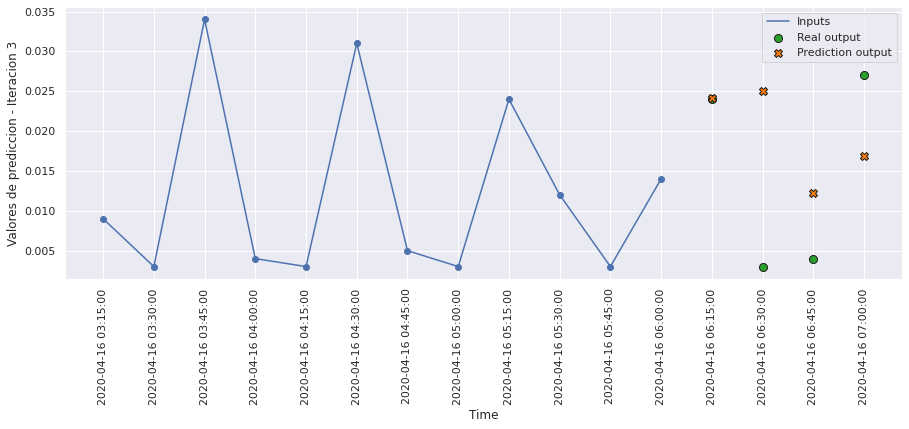

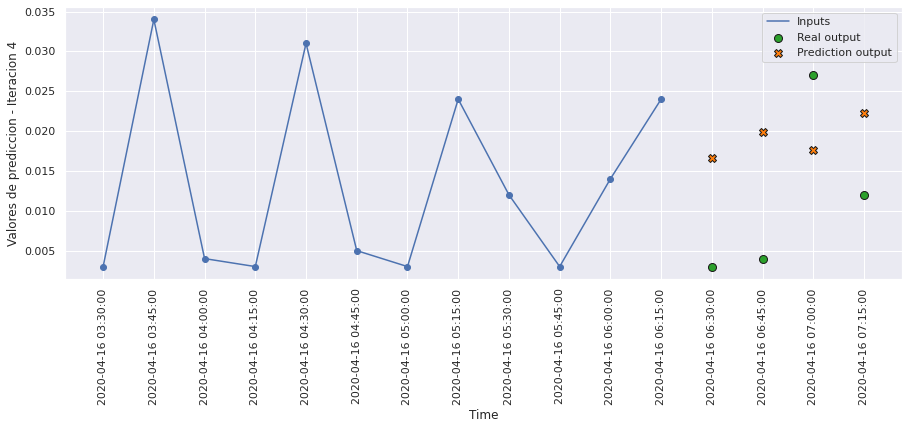

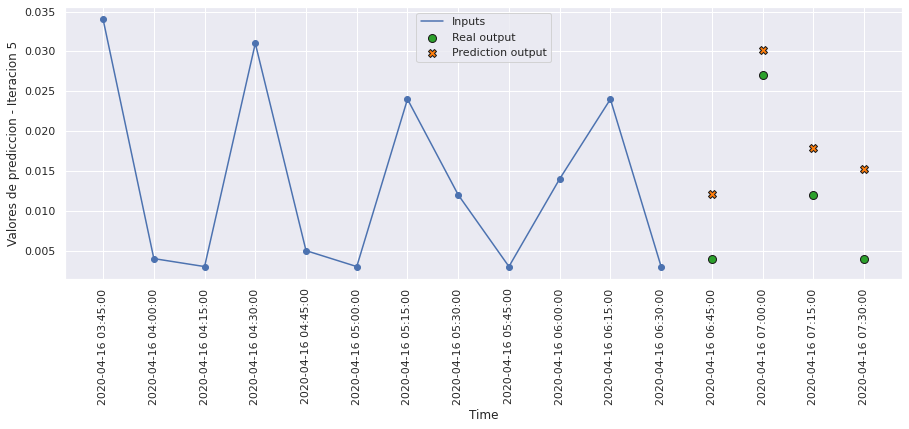

...

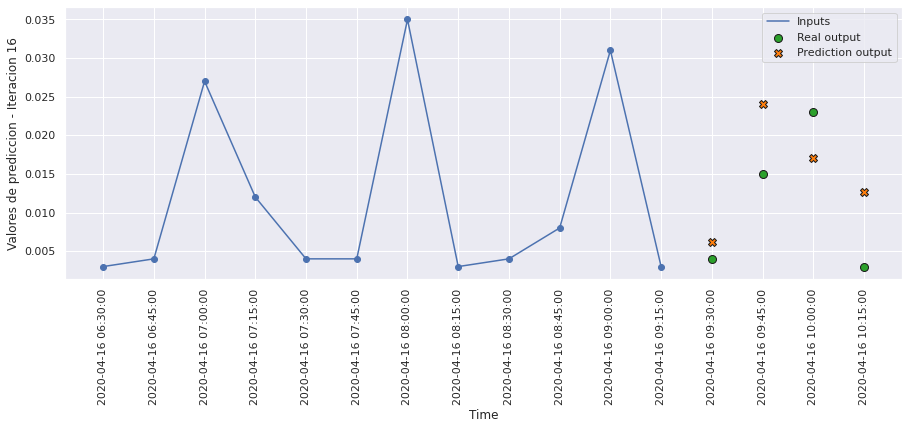

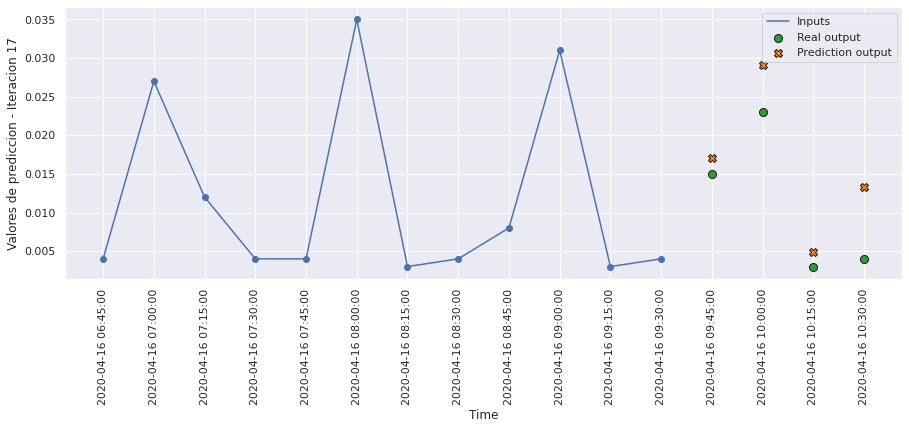

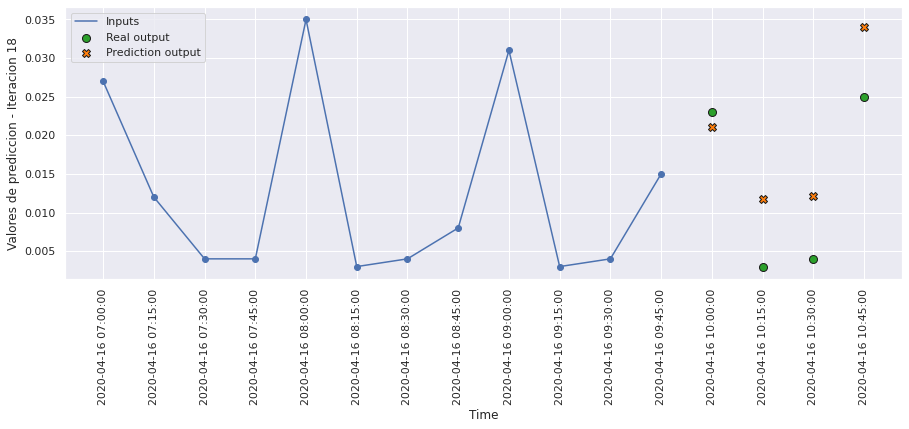

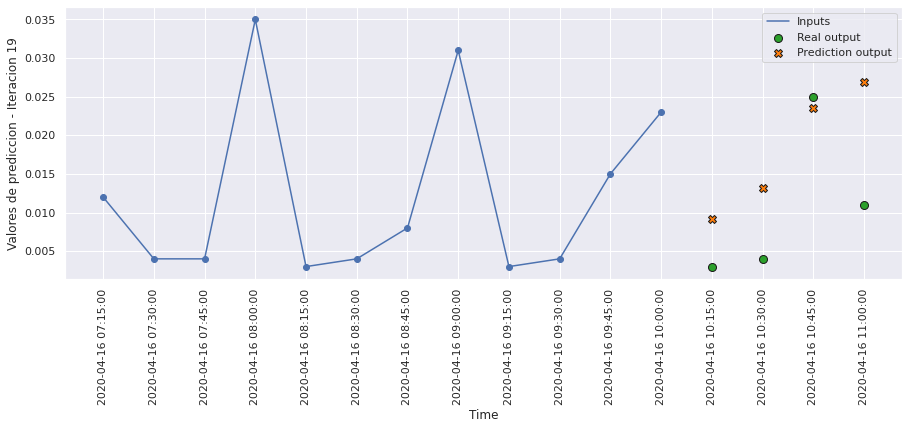

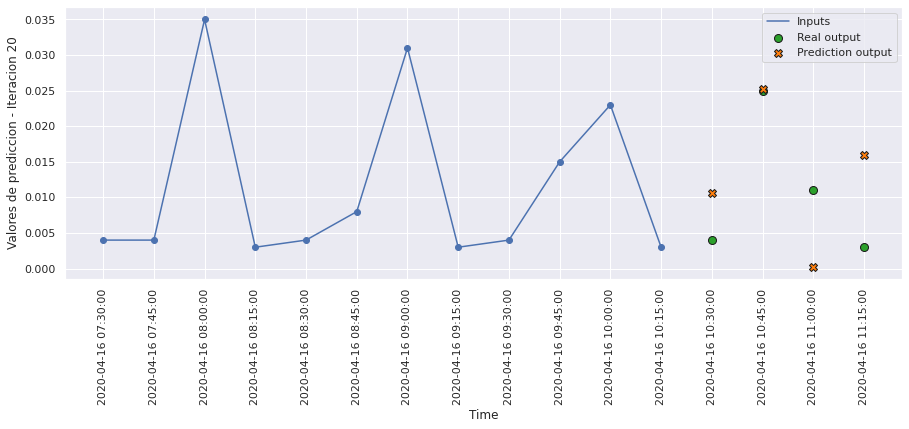

In [122]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict7, 20, 0)

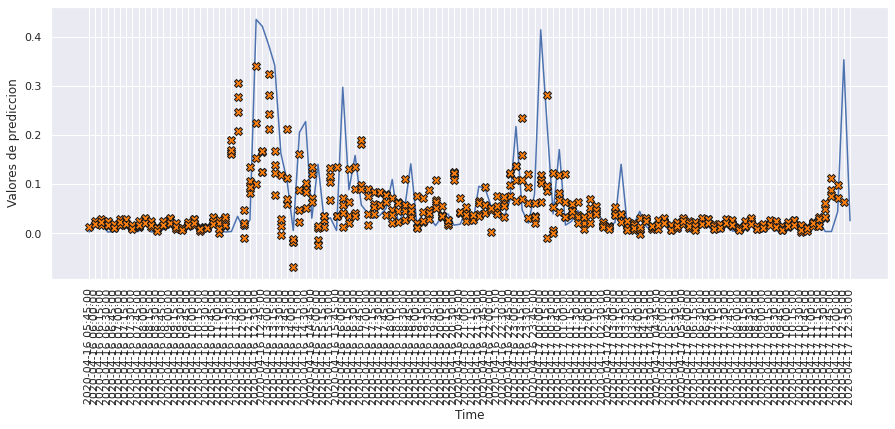

In [123]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict7, 120)

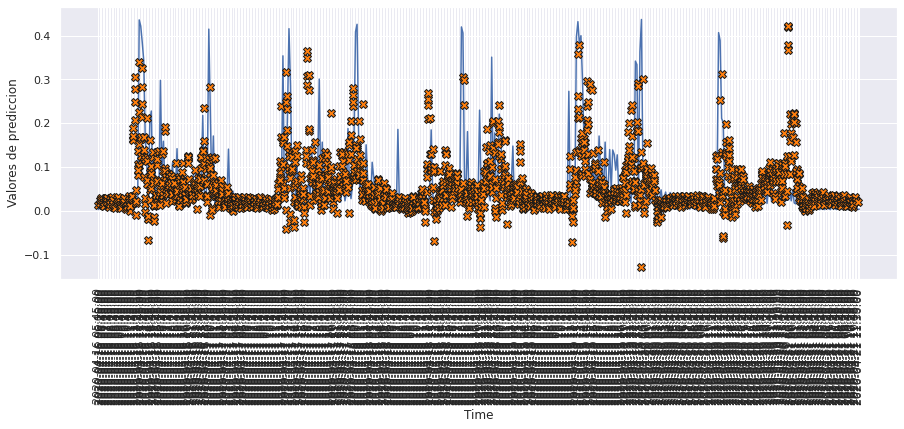

In [124]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict7, 500)

# MODELO 8: ACTIVITY REGULARIZER L1 0.01

### Construimos el modelo

In [125]:
def build_model8():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.LSTM(128, activation='tanh', return_sequences = True, 
                             activity_regularizer=tf.keras.regularizers.L1L2(0.01, 0)),
        tf.keras.layers.LSTM(128, activation='tanh'),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [126]:
model8 = build_model8()
model8.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_14 (LSTM)              (None, 12, 128)           69632     
                                                                 
 lstm_15 (LSTM)              (None, 128)               131584    
                                                                 
 dense_7 (Dense)             (None, 4)                 516       
                                                                 
Total params: 201,732
Trainable params: 201,732
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [127]:
history8 = model8.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 8s 16ms/step - loss: 0.0933 - mae: 0.0498 - mse: 0.0069 - smape: 0.8679 - val_loss: 0.0097 - val_mae: 0.0496 - val_mse: 0.0071 - val_smape: 0.8790
Epoch 2/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0085 - mae: 0.0504 - mse: 0.0069 - smape: 0.8718 - val_loss: 0.0091 - val_mae: 0.0478 - val_mse: 0.0070 - val_smape: 0.8543
Epoch 3/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0083 - mae: 0.0503 - mse: 0.0069 - smape: 0.8714 - val_loss: 0.0089 - val_mae: 0.0502 - val_mse: 0.0071 - val_smape: 0.8879
Epoch 4/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0082 - mae: 0.0503 - mse: 0.0069 - smape: 0.8717 - val_loss: 0.0088 - val_mae: 0.0515 - val_mse: 0.0071 - val_smape: 0.9039
Epoch 5/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0081 - mae: 0.0503 - mse: 0.0069 - smape: 0.8717 - val_loss: 0.0089 - val_mae: 0.0498 - val_mse: 0.0071 - val_smap

354/354 [==============================] - 5s 14ms/step - loss: 0.0069 - mae: 0.0504 - mse: 0.0069 - smape: 0.8727 - val_loss: 0.0071 - val_mae: 0.0505 - val_mse: 0.0071 - val_smape: 0.8913
Epoch 42/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0069 - mae: 0.0503 - mse: 0.0069 - smape: 0.8721 - val_loss: 0.0071 - val_mae: 0.0503 - val_mse: 0.0071 - val_smape: 0.8888
Epoch 43/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0069 - mae: 0.0503 - mse: 0.0069 - smape: 0.8719 - val_loss: 0.0070 - val_mae: 0.0486 - val_mse: 0.0070 - val_smape: 0.8665
Epoch 44/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0069 - mae: 0.0503 - mse: 0.0069 - smape: 0.8712 - val_loss: 0.0071 - val_mae: 0.0497 - val_mse: 0.0070 - val_smape: 0.8814
Epoch 45/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0069 - mae: 0.0503 - mse: 0.0069 - smape: 0.8721 - val_loss: 0.0071 - val_mae: 0.0504 - val_mse: 0.0071 - val_smape: 0.890

354/354 [==============================] - 5s 14ms/step - loss: 0.0069 - mae: 0.0504 - mse: 0.0069 - smape: 0.8729 - val_loss: 0.0070 - val_mae: 0.0485 - val_mse: 0.0070 - val_smape: 0.8660
Epoch 82/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0069 - mae: 0.0503 - mse: 0.0069 - smape: 0.8709 - val_loss: 0.0070 - val_mae: 0.0496 - val_mse: 0.0070 - val_smape: 0.8799
Epoch 83/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0069 - mae: 0.0504 - mse: 0.0069 - smape: 0.8729 - val_loss: 0.0070 - val_mae: 0.0488 - val_mse: 0.0070 - val_smape: 0.8692
Epoch 84/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0069 - mae: 0.0503 - mse: 0.0069 - smape: 0.8713 - val_loss: 0.0070 - val_mae: 0.0486 - val_mse: 0.0070 - val_smape: 0.8667
Epoch 85/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0069 - mae: 0.0503 - mse: 0.0069 - smape: 0.8715 - val_loss: 0.0070 - val_mae: 0.0494 - val_mse: 0.0070 - val_smape: 0.877

354/354 [==============================] - 5s 14ms/step - loss: 0.0069 - mae: 0.0502 - mse: 0.0069 - smape: 0.8710 - val_loss: 0.0070 - val_mae: 0.0485 - val_mse: 0.0070 - val_smape: 0.8655
Epoch 122/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0069 - mae: 0.0503 - mse: 0.0069 - smape: 0.8716 - val_loss: 0.0070 - val_mae: 0.0497 - val_mse: 0.0070 - val_smape: 0.8821
Epoch 123/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0069 - mae: 0.0504 - mse: 0.0069 - smape: 0.8723 - val_loss: 0.0070 - val_mae: 0.0494 - val_mse: 0.0070 - val_smape: 0.8784
Epoch 124/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0069 - mae: 0.0504 - mse: 0.0069 - smape: 0.8723 - val_loss: 0.0070 - val_mae: 0.0481 - val_mse: 0.0070 - val_smape: 0.8605
Epoch 125/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0069 - mae: 0.0503 - mse: 0.0069 - smape: 0.8719 - val_loss: 0.0070 - val_mae: 0.0488 - val_mse: 0.0070 - val_smape: 0

354/354 [==============================] - 5s 14ms/step - loss: 0.0069 - mae: 0.0503 - mse: 0.0069 - smape: 0.8722 - val_loss: 0.0070 - val_mae: 0.0489 - val_mse: 0.0070 - val_smape: 0.8709
Epoch 162/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0069 - mae: 0.0503 - mse: 0.0069 - smape: 0.8719 - val_loss: 0.0070 - val_mae: 0.0483 - val_mse: 0.0070 - val_smape: 0.8626
Epoch 163/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0069 - mae: 0.0503 - mse: 0.0069 - smape: 0.8717 - val_loss: 0.0070 - val_mae: 0.0497 - val_mse: 0.0070 - val_smape: 0.8811
Epoch 164/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0069 - mae: 0.0503 - mse: 0.0069 - smape: 0.8712 - val_loss: 0.0070 - val_mae: 0.0500 - val_mse: 0.0070 - val_smape: 0.8850
Epoch 165/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0069 - mae: 0.0503 - mse: 0.0069 - smape: 0.8723 - val_loss: 0.0070 - val_mae: 0.0494 - val_mse: 0.0070 - val_smape: 0

In [128]:
hist8 = pd.DataFrame(history8.history)
hist8['epoch'] = history8.epoch
hist8

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.093295,0.049806,0.006854,0.867933,0.009702,0.049576,0.007052,0.879035,0
1,0.008494,0.050372,0.006928,0.871849,0.009118,0.047783,0.007030,0.854260,1
2,0.008310,0.050340,0.006923,0.871416,0.008897,0.050247,0.007059,0.887903,2
3,0.008199,0.050297,0.006917,0.871661,0.008813,0.051493,0.007084,0.903937,3
4,0.008102,0.050340,0.006919,0.871706,0.008884,0.049776,0.007053,0.881794,4
...,...,...,...,...,...,...,...,...,...
190,0.006910,0.050333,0.006910,0.872300,0.007038,0.049255,0.007037,0.875763,190
191,0.006911,0.050276,0.006911,0.871272,0.007072,0.050988,0.007072,0.897736,191
192,0.006909,0.050321,0.006909,0.872099,0.007069,0.050756,0.007069,0.894631,192
193,0.006911,0.050367,0.006911,0.872541,0.007044,0.049671,0.007044,0.881214,193


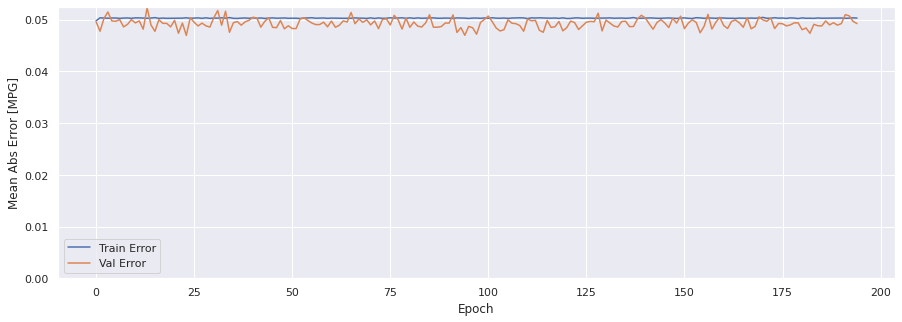

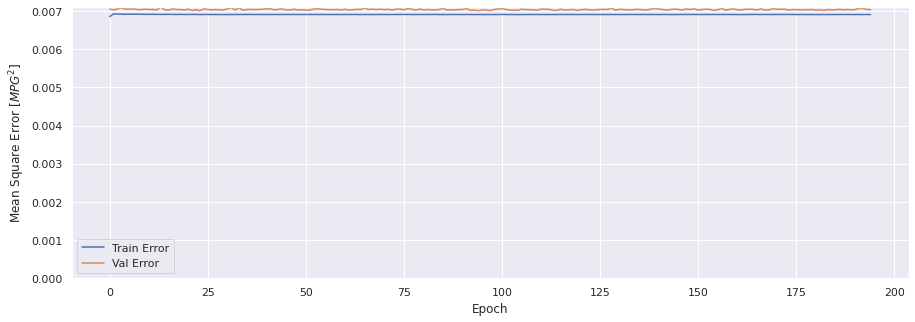

In [129]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history8)

### Evaluar predicciones

In [130]:
score_train8 = model8.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train8[0]}')
print(f'MAE:{score_train8[1]}')
print(f'MSE:{score_train8[2]}')
print(f'SMAPE:{score_train8[3]}')

1413/1413 [==============================] - 10s 7ms/step - loss: 0.0069 - mae: 0.0502 - mse: 0.0069 - smape: 0.8706
Loss:0.0069070723839104176
MAE:0.05018848553299904
MSE:0.00690689031034708
SMAPE:0.8706279397010803


In [131]:
score_val8 = model8.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val8[0]}')
print(f'MAE:{score_val8[1]}')
print(f'MSE:{score_val8[2]}')
print(f'SMAPE:{score_val8[3]}')

303/303 [==============================] - 2s 7ms/step - loss: 0.0070 - mae: 0.0493 - mse: 0.0070 - smape: 0.8741
Loss:0.007037424948066473
MAE:0.049258120357990265
MSE:0.007037172559648752
SMAPE:0.8740707635879517


In [132]:
score_test8 = model8.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test8[0]}')
print(f'MAE:{score_test8[1]}')
print(f'MSE:{score_test8[2]}')
print(f'SMAPE:{score_test8[3]}')

303/303 [==============================] - 2s 7ms/step - loss: 0.0069 - mae: 0.0512 - mse: 0.0069 - smape: 0.8819
Loss:0.006850498262792826
MAE:0.05116520822048187
MSE:0.006850310601294041
SMAPE:0.8819414973258972


### Comparativa de resultados

In [133]:
result = hist8.iloc[-1]
comparativa8 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test8[1], score_test8[2], score_test8[3], math.sqrt(score_test8[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa8.style.set_caption("Método de ventana de un paso - CONVLSTM 2D")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.050320,0.006909,0.871917,0.083122
VALIDACION,0.049258,0.007037,0.875822,0.083888
TEST,0.051165,0.006850,0.881941,0.082767


### Obtener predicciones

In [134]:
trainPredict8 = model8.predict(scaled_trainX)
testPredict8 = model8.predict(scaled_testX)

### Visualización de las predicciones

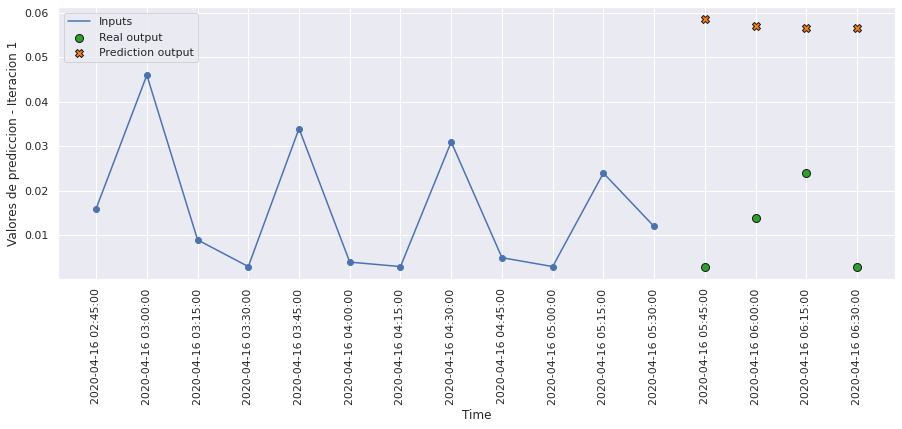

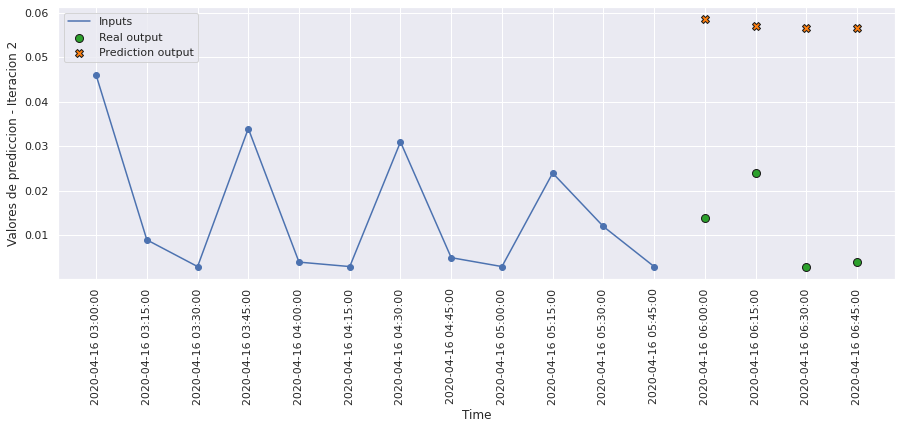

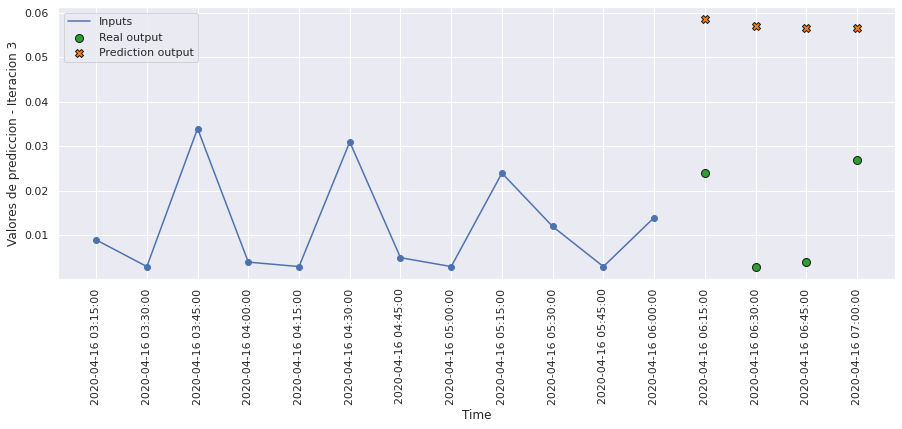

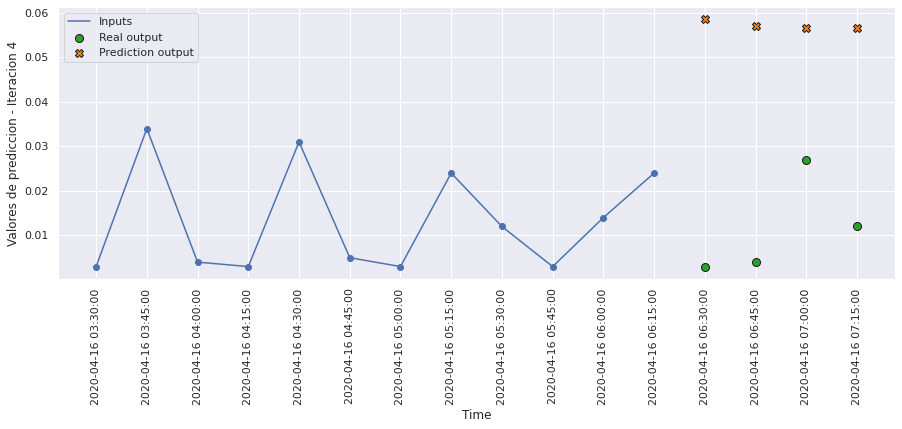

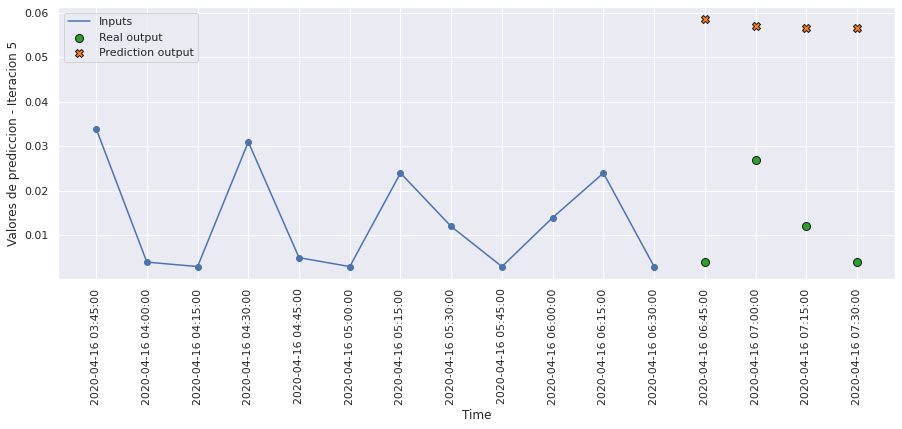

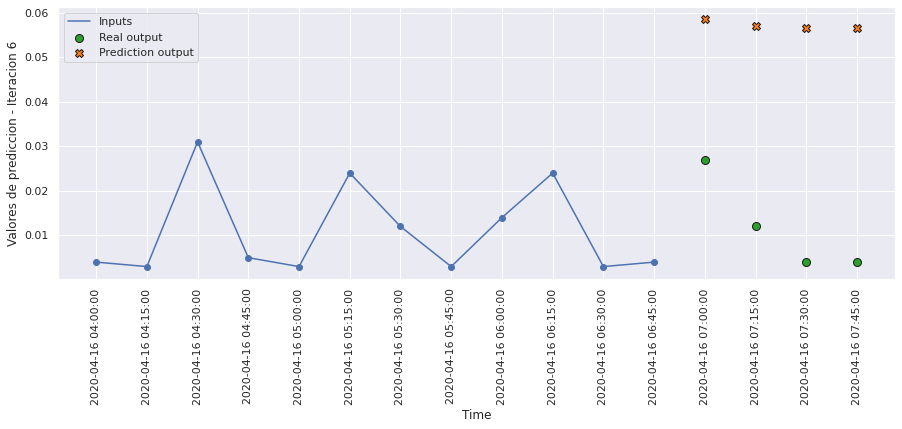

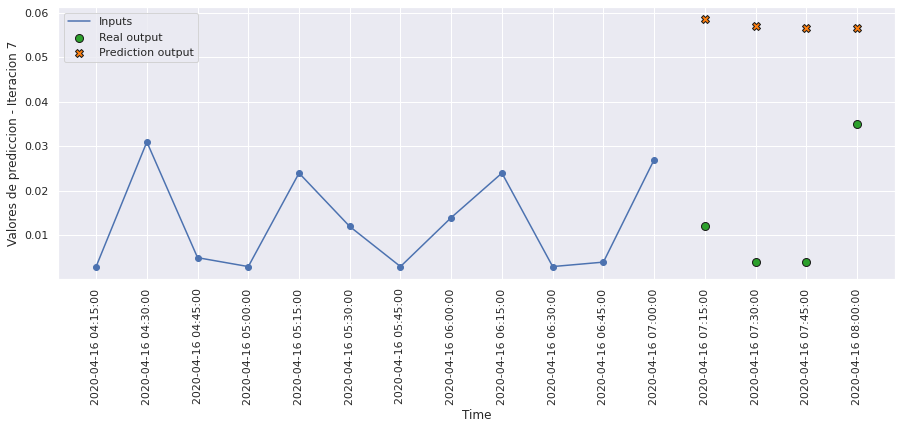

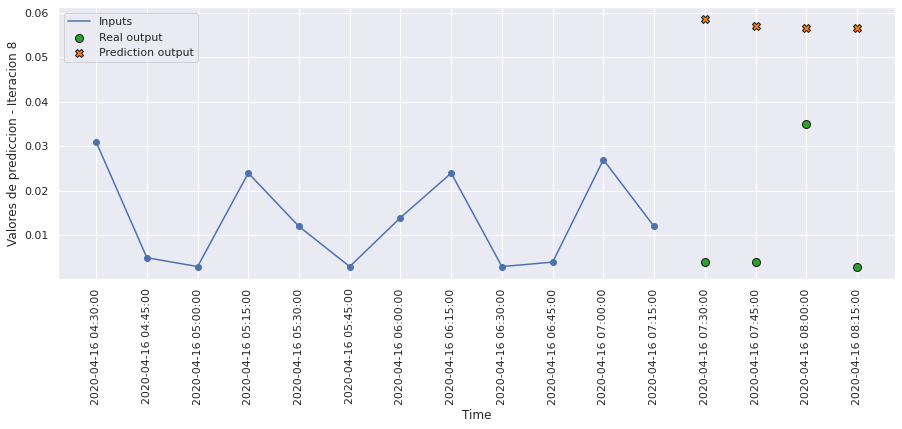

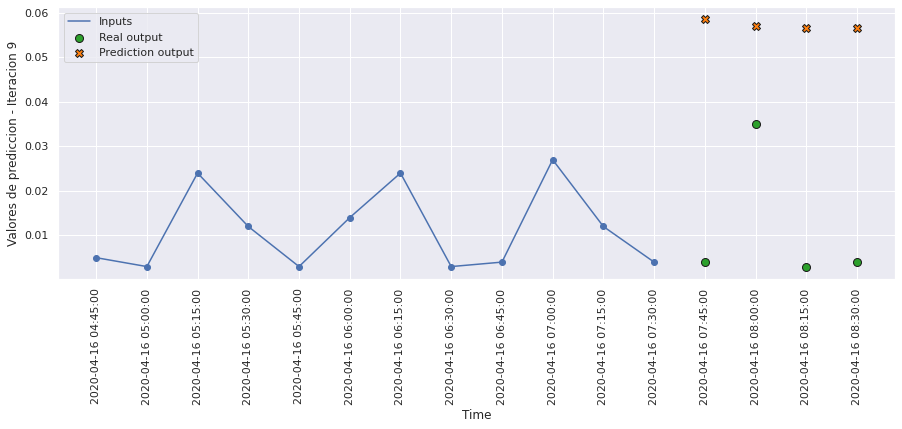

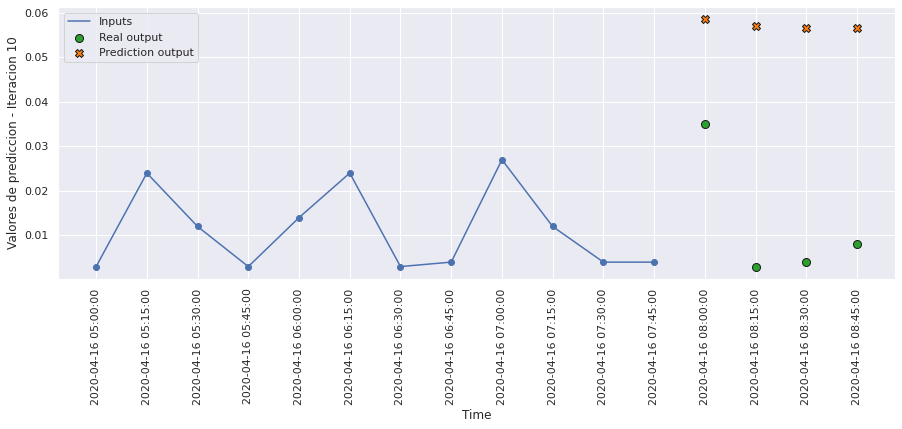

In [135]:
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict8, 10, 0)

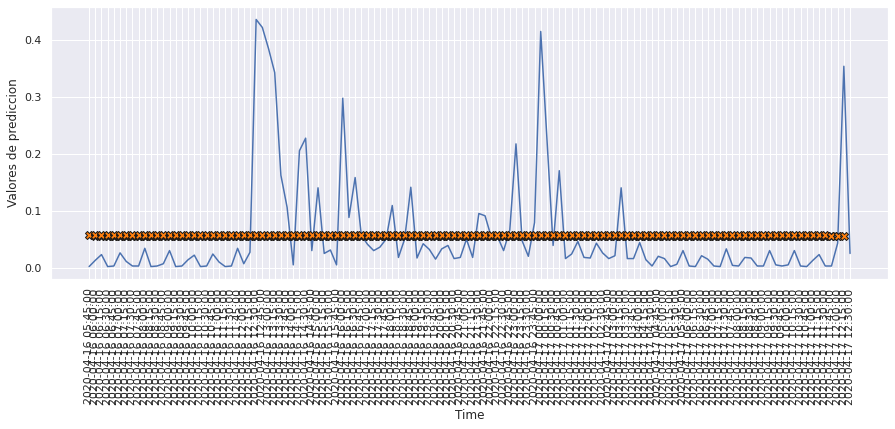

In [136]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict8, 120)

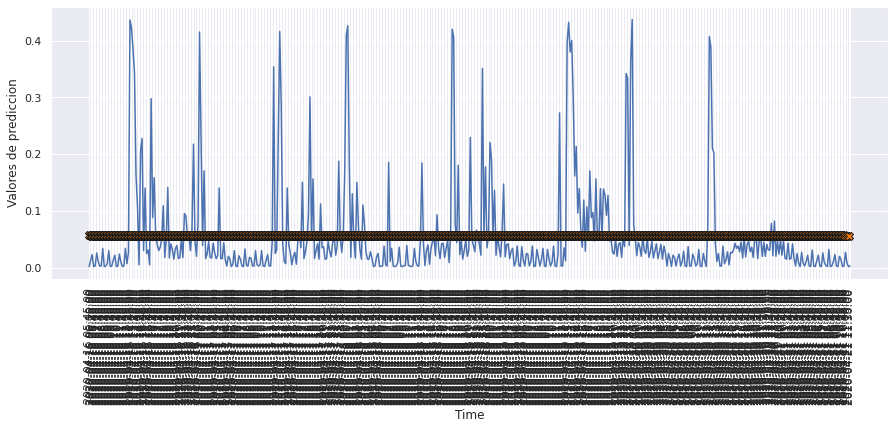

In [137]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict8, 500)

# MODELO 9: ACTIVITY REGULARIZER L2 0.01

### Construimos el modelo

In [138]:
def build_model9():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.LSTM(128, activation='tanh', return_sequences = True, 
                             activity_regularizer=tf.keras.regularizers.L1L2(0, 0.01)),
        tf.keras.layers.LSTM(128, activation='tanh'),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [139]:
model9 = build_model9()
model9.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_16 (LSTM)              (None, 12, 128)           69632     
                                                                 
 lstm_17 (LSTM)              (None, 128)               131584    
                                                                 
 dense_8 (Dense)             (None, 4)                 516       
                                                                 
Total params: 201,732
Trainable params: 201,732
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [140]:
history9 = model9.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 7s 16ms/step - loss: 0.0122 - mae: 0.0465 - mse: 0.0063 - smape: 0.8197 - val_loss: 0.0063 - val_mae: 0.0420 - val_mse: 0.0062 - val_smape: 0.7570
Epoch 2/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0060 - mae: 0.0449 - mse: 0.0059 - smape: 0.7983 - val_loss: 0.0061 - val_mae: 0.0459 - val_mse: 0.0059 - val_smape: 0.8276
Epoch 3/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0058 - mae: 0.0444 - mse: 0.0057 - smape: 0.8020 - val_loss: 0.0058 - val_mae: 0.0409 - val_mse: 0.0057 - val_smape: 0.7905
Epoch 4/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0057 - mae: 0.0443 - mse: 0.0056 - smape: 0.8027 - val_loss: 0.0059 - val_mae: 0.0418 - val_mse: 0.0057 - val_smape: 0.8961
Epoch 5/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0056 - mae: 0.0442 - mse: 0.0055 - smape: 0.8047 - val_loss: 0.0059 - val_mae: 0.0434 - val_mse: 0.0057 - val_smap

354/354 [==============================] - 5s 14ms/step - loss: 0.0049 - mae: 0.0398 - mse: 0.0048 - smape: 0.7249 - val_loss: 0.0061 - val_mae: 0.0416 - val_mse: 0.0060 - val_smape: 0.7418
Epoch 42/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0049 - mae: 0.0398 - mse: 0.0048 - smape: 0.7244 - val_loss: 0.0060 - val_mae: 0.0427 - val_mse: 0.0059 - val_smape: 0.7441
Epoch 43/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0049 - mae: 0.0398 - mse: 0.0048 - smape: 0.7241 - val_loss: 0.0059 - val_mae: 0.0403 - val_mse: 0.0058 - val_smape: 0.7253
Epoch 44/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0049 - mae: 0.0397 - mse: 0.0048 - smape: 0.7233 - val_loss: 0.0060 - val_mae: 0.0411 - val_mse: 0.0059 - val_smape: 0.7545
Epoch 45/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0049 - mae: 0.0397 - mse: 0.0048 - smape: 0.7221 - val_loss: 0.0061 - val_mae: 0.0432 - val_mse: 0.0060 - val_smape: 0.754

354/354 [==============================] - 5s 13ms/step - loss: 0.0047 - mae: 0.0390 - mse: 0.0047 - smape: 0.7094 - val_loss: 0.0066 - val_mae: 0.0453 - val_mse: 0.0065 - val_smape: 0.7674
Epoch 82/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0047 - mae: 0.0390 - mse: 0.0047 - smape: 0.7074 - val_loss: 0.0062 - val_mae: 0.0421 - val_mse: 0.0061 - val_smape: 0.7406
Epoch 83/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0047 - mae: 0.0390 - mse: 0.0047 - smape: 0.7087 - val_loss: 0.0063 - val_mae: 0.0422 - val_mse: 0.0062 - val_smape: 0.7423
Epoch 84/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0047 - mae: 0.0389 - mse: 0.0047 - smape: 0.7081 - val_loss: 0.0060 - val_mae: 0.0419 - val_mse: 0.0059 - val_smape: 0.7615
Epoch 85/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0047 - mae: 0.0388 - mse: 0.0047 - smape: 0.7073 - val_loss: 0.0062 - val_mae: 0.0439 - val_mse: 0.0061 - val_smape: 0.757

In [141]:
hist9 = pd.DataFrame(history9.history)
hist9['epoch'] = history9.epoch
hist9

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.012165,0.046547,0.006310,0.819690,0.006342,0.041984,0.006196,0.756956,0
1,0.006029,0.044876,0.005907,0.798254,0.006066,0.045870,0.005936,0.827604,1
2,0.005786,0.044445,0.005677,0.802023,0.005829,0.040885,0.005720,0.790505,2
3,0.005689,0.044285,0.005595,0.802719,0.005867,0.041839,0.005731,0.896074,3
4,0.005645,0.044175,0.005542,0.804654,0.005861,0.043441,0.005730,0.854877,4
...,...,...,...,...,...,...,...,...,...
111,0.004582,0.038214,0.004507,0.700699,0.006298,0.042819,0.006194,0.749714,111
112,0.004575,0.038176,0.004498,0.699994,0.006769,0.045339,0.006653,0.801466,112
113,0.004571,0.038139,0.004494,0.698769,0.006363,0.042092,0.006253,0.763227,113
114,0.004560,0.038070,0.004483,0.698883,0.006586,0.044060,0.006471,0.790822,114


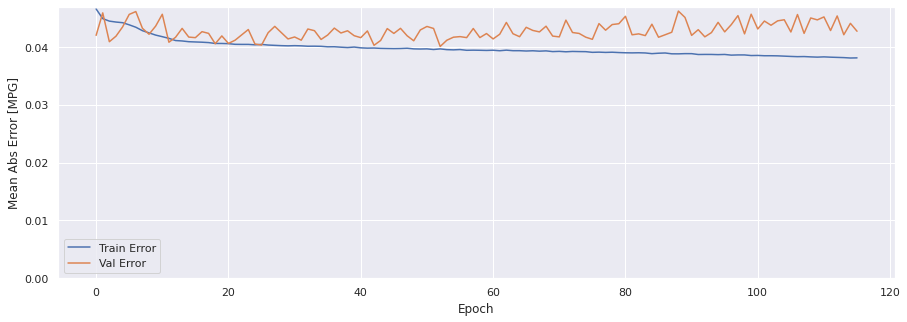

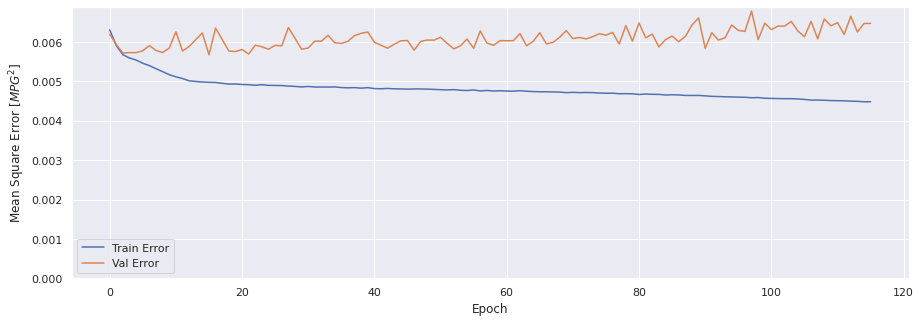

In [142]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history9)

### Evaluar predicciones

In [143]:
score_train9 = model9.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train9[0]}')
print(f'MAE:{score_train9[1]}')
print(f'MSE:{score_train9[2]}')
print(f'SMAPE:{score_train9[3]}')

1413/1413 [==============================] - 9s 6ms/step - loss: 0.0045 - mae: 0.0376 - mse: 0.0044 - smape: 0.6943
Loss:0.004517483990639448
MAE:0.037557199597358704
MSE:0.004439986776560545
SMAPE:0.6942646503448486


In [144]:
score_val9 = model9.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val9[0]}')
print(f'MAE:{score_val9[1]}')
print(f'MSE:{score_val9[2]}')
print(f'SMAPE:{score_val9[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0066 - mae: 0.0427 - mse: 0.0065 - smape: 0.7537
Loss:0.0065826899372041225
MAE:0.04269537702202797
MSE:0.006472144275903702
SMAPE:0.7536917924880981


In [145]:
score_test9 = model9.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test9[0]}')
print(f'MAE:{score_test9[1]}')
print(f'MSE:{score_test9[2]}')
print(f'SMAPE:{score_test9[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0064 - mae: 0.0454 - mse: 0.0063 - smape: 0.7690
Loss:0.006425964180380106
MAE:0.045427605509757996
MSE:0.006339889019727707
SMAPE:0.7690388560295105


### Comparativa de resultados

In [146]:
result = hist9.iloc[-1]
comparativa9 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test9[1], score_test9[2], score_test9[3], math.sqrt(score_test9[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

### Obtener predicciones

In [147]:
trainPredict9 = model9.predict(scaled_trainX)
testPredict9 = model9.predict(scaled_testX)

### Visualización de las predicciones

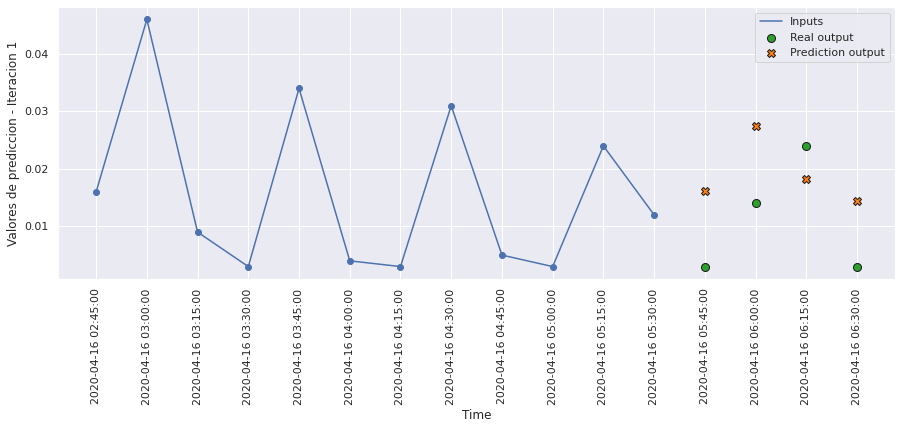

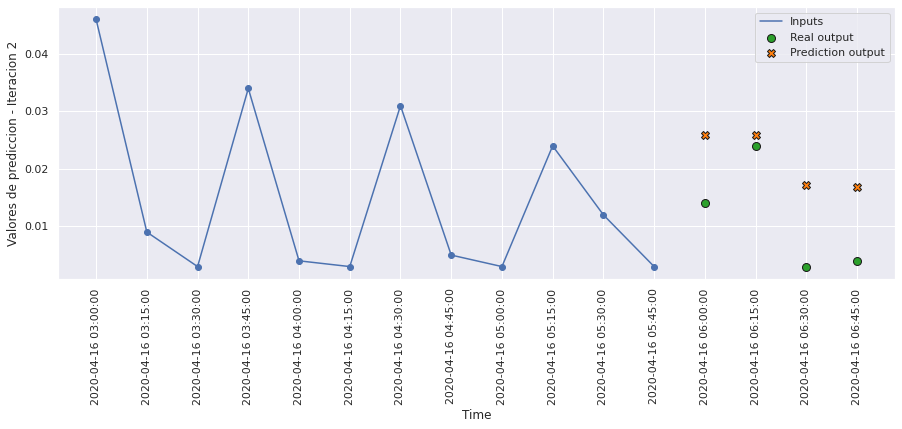

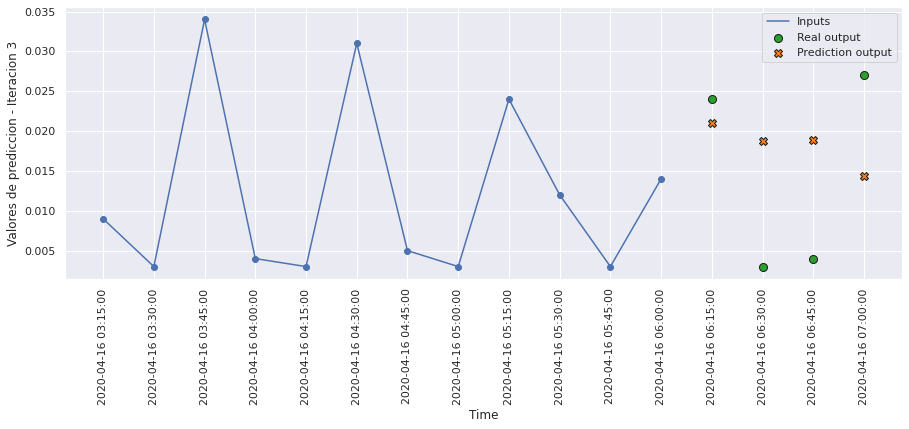

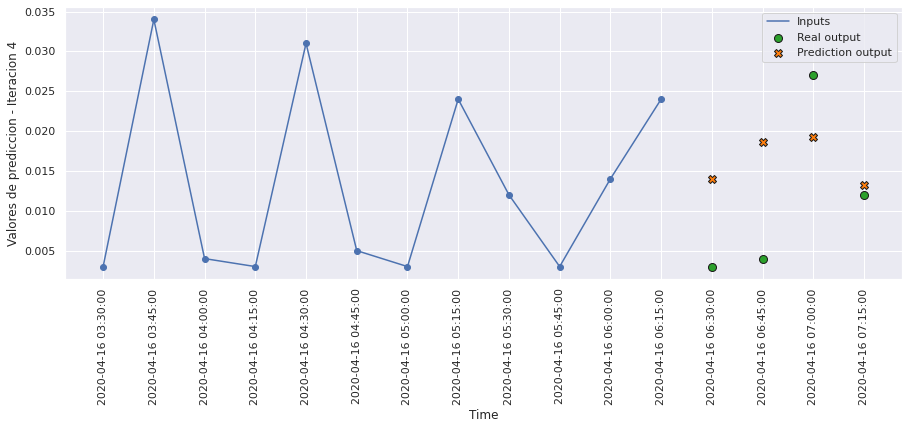

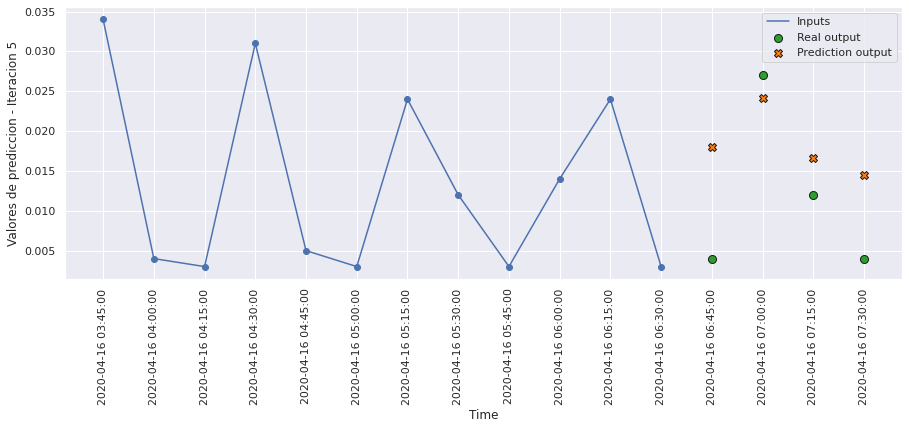

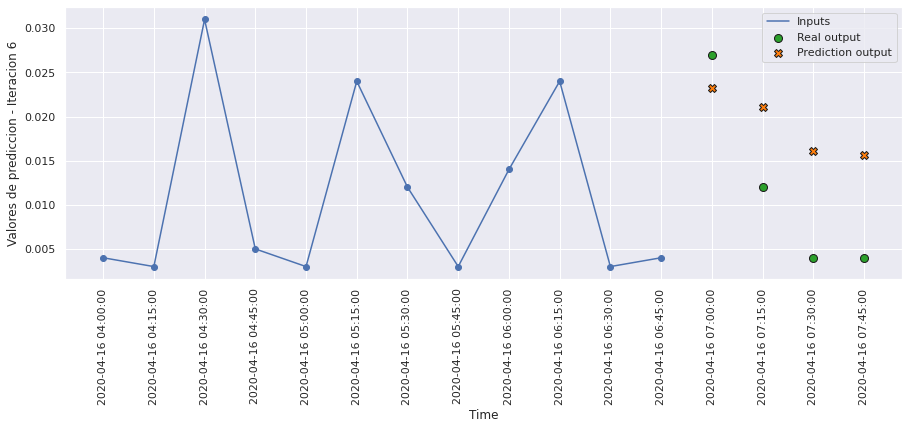

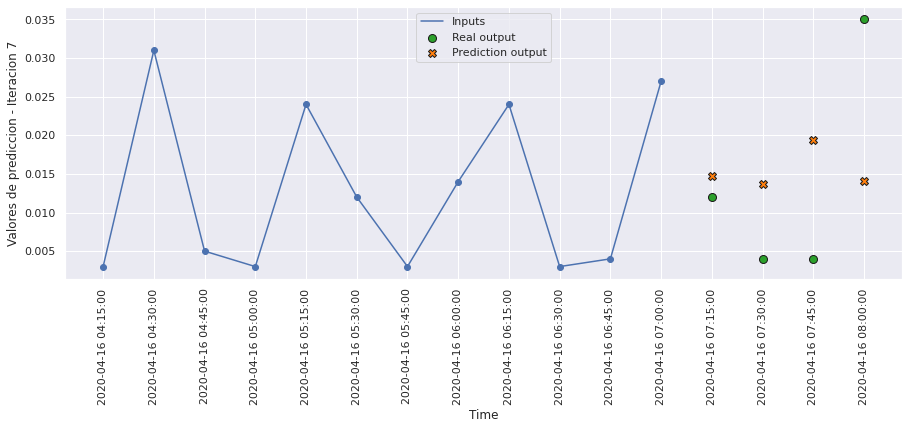

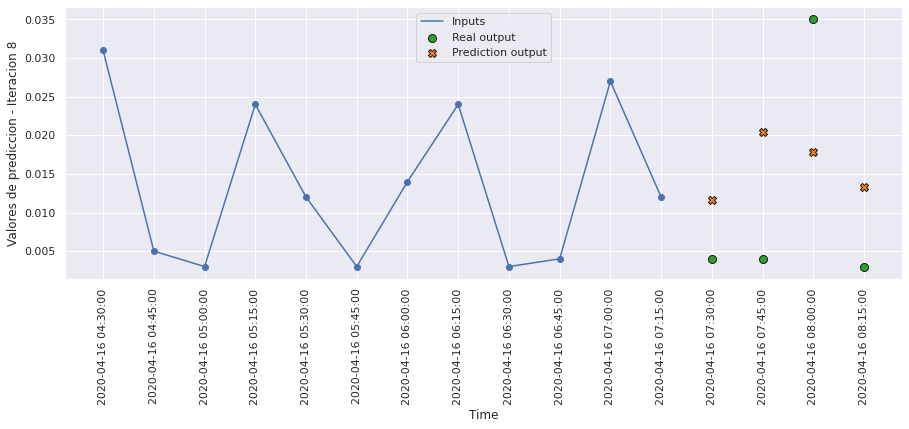

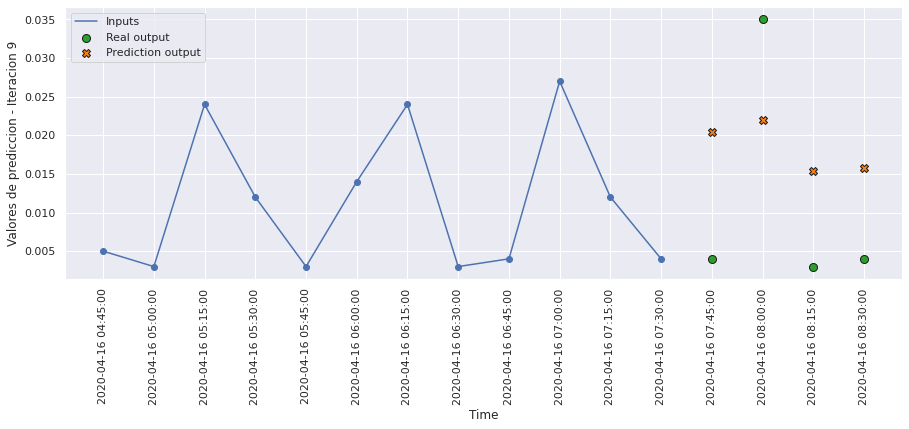

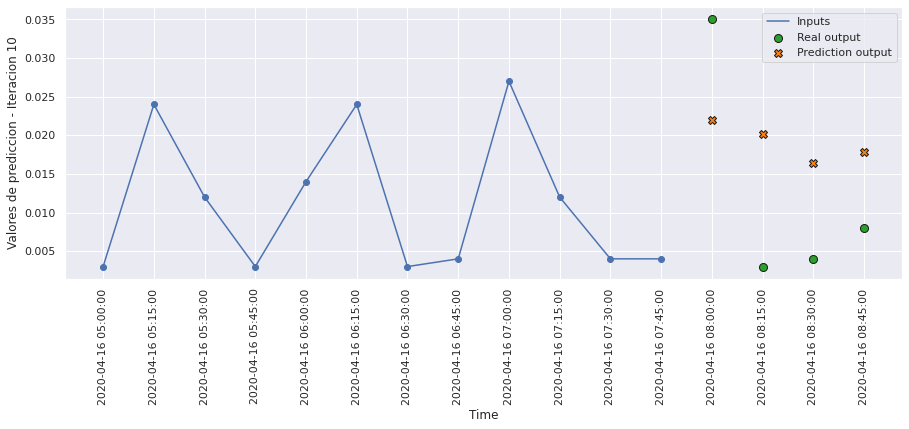

In [148]:
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, 
                        testPredict9, 10, 0)

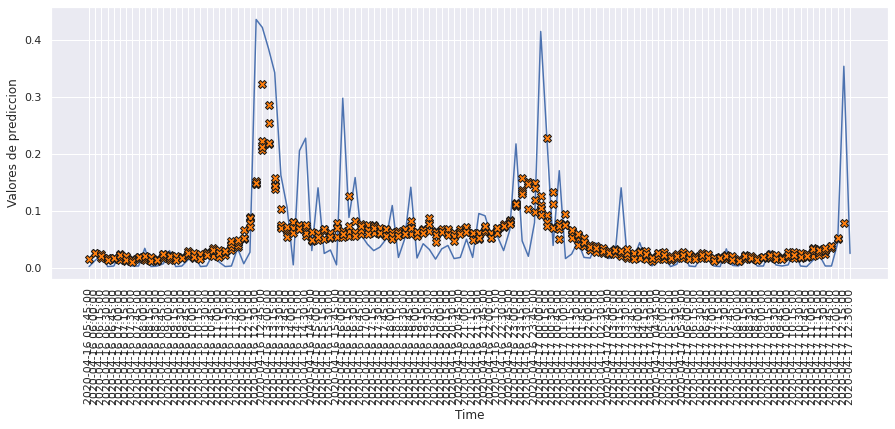

In [149]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict9, 120)

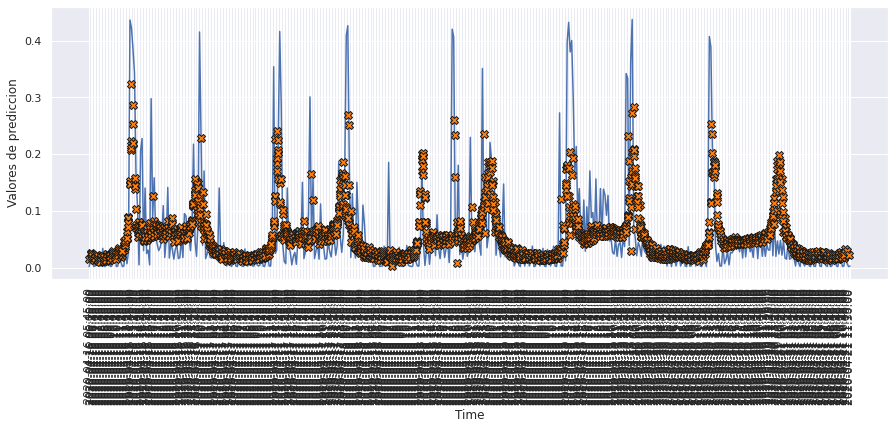

In [150]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict9, 500)

# Comparación de modelos

In [151]:
idx = ['Dropout', 'Kernel Regularizer L1', 'Kernel Regularizer L2', 'Recurrent Regularizer L1', 'Recurrent Regularizer L2', 
       'Bias Regularizer L1', 'Bias Regularizer L2', 'Activity Regularizer L1', 'Activity Regularizer L2']

col = ['TR_MAE', 'TR_MSE', 'TR_SMAPE', 'TR_RMSE',
       'V_MAE', 'V_MSE', 'V_SMAPE', 'V_RMSE',
       'TS_MAE', 'TS_MSE', 'TS_SMAPE', 'TS_RMSE']

datos = [[score_train1[1], score_train1[2], score_train1[3], math.sqrt(score_train1[2]),
            score_val1[1],   score_val1[2],   score_val1[3],   math.sqrt(score_val1[2]),
           score_test1[1],  score_test1[2],  score_test1[3],  math.sqrt(score_test1[2])],
         [score_train2[1], score_train2[2], score_train2[3], math.sqrt(score_train2[2]),
            score_val2[1],   score_val2[2],   score_val2[3],   math.sqrt(score_val2[2]),
           score_test2[1],  score_test2[2],  score_test2[3],  math.sqrt(score_test2[2])],
         [score_train3[1], score_train3[2], score_train3[3], math.sqrt(score_train3[2]),
            score_val3[1],   score_val3[2],   score_val3[3],   math.sqrt(score_val3[2]),
           score_test3[1],  score_test3[2],  score_test3[3],  math.sqrt(score_test3[2])],
         [score_train4[1], score_train4[2], score_train4[3], math.sqrt(score_train4[2]),
            score_val4[1],   score_val4[2],   score_val4[3],   math.sqrt(score_val4[2]),
           score_test4[1],  score_test4[2],  score_test4[3],  math.sqrt(score_test4[2])],
         [score_train5[1], score_train5[2], score_train5[3], math.sqrt(score_train5[2]),
            score_val5[1],   score_val5[2],   score_val5[3],   math.sqrt(score_val5[2]),
           score_test5[1],  score_test5[2],  score_test5[3],  math.sqrt(score_test5[2])],
         [score_train6[1], score_train6[2], score_train6[3], math.sqrt(score_train6[2]),
            score_val6[1],   score_val6[2],   score_val6[3],   math.sqrt(score_val6[2]),
           score_test6[1],  score_test6[2],  score_test6[3],  math.sqrt(score_test6[2])],
         [score_train7[1], score_train7[2], score_train7[3], math.sqrt(score_train7[2]),
            score_val7[1],   score_val7[2],   score_val7[3],   math.sqrt(score_val7[2]),
           score_test7[1],  score_test7[2],  score_test7[3],  math.sqrt(score_test7[2])],
         [score_train8[1], score_train8[2], score_train8[3], math.sqrt(score_train8[2]),
            score_val8[1],   score_val8[2],   score_val8[3],   math.sqrt(score_val8[2]),
           score_test8[1],  score_test8[2],  score_test8[3],  math.sqrt(score_test8[2])],
         [score_train9[1], score_train9[2], score_train9[3], math.sqrt(score_train9[2]),
            score_val9[1],   score_val9[2],   score_val9[3],   math.sqrt(score_val9[2]),
           score_test9[1],  score_test9[2],  score_test9[3],  math.sqrt(score_test9[2])]]

comparativa = pd.DataFrame(datos, columns = col, index = idx)
comparativa.style.set_caption("Tabla de comparación de todos los modelos - Optimización LSTM 2 capas fecha y valor 12 - 4")

,TR_MAE,TR_MSE,TR_SMAPE,TR_RMSE,V_MAE,V_MSE,V_SMAPE,V_RMSE,TS_MAE,TS_MSE,TS_SMAPE,TS_RMSE
Dropout,0.030613,0.002764,0.653070,0.052577,0.049323,0.008291,0.822241,0.091052,0.052495,0.008181,0.790159,0.090449
Kernel Regularizer L1,0.049060,0.006913,0.857348,0.083142,0.047645,0.007016,0.852317,0.083761,0.049774,0.006847,0.863559,0.082747
Kernel Regularizer L2,0.037618,0.004317,0.709430,0.065704,0.044165,0.006584,0.774334,0.081143,0.046517,0.006441,0.771869,0.080254
Recurrent Regularizer L1,0.020491,0.001013,0.589261,0.031830,0.053164,0.009801,0.870975,0.099000,0.054415,0.008734,0.869033,0.093457
Recurrent Regularizer L2,0.024762,0.001531,0.630901,0.039134,0.052372,0.009502,0.855529,0.097477,0.054304,0.008612,0.856217,0.092803
Bias Regularizer L1,0.018461,0.000836,0.554429,0.028909,0.052275,0.009478,0.862663,0.097354,0.053728,0.008580,0.866013,0.092627
Bias Regularizer L2,0.016598,0.000645,0.529013,0.025406,0.054427,0.010132,0.846158,0.100659,0.056043,0.009210,0.864739,0.095971
Activity Regularizer L1,0.050188,0.006907,0.870628,0.083108,0.049258,0.007037,0.874071,0.083888,0.051165,0.006850,0.881941,0.082767
Activity Regularizer L2,0.037557,0.004440,0.694265,0.066633,0.042695,0.006472,0.753692,0.080450,0.045428,0.006340,0.769039,0.079623


<AxesSubplot:title={'center':'Comparativa del error en los modelos para la optimización del LSTM de 2 capas de la hora del método de ventana de varios pasos fecha y valor'}>

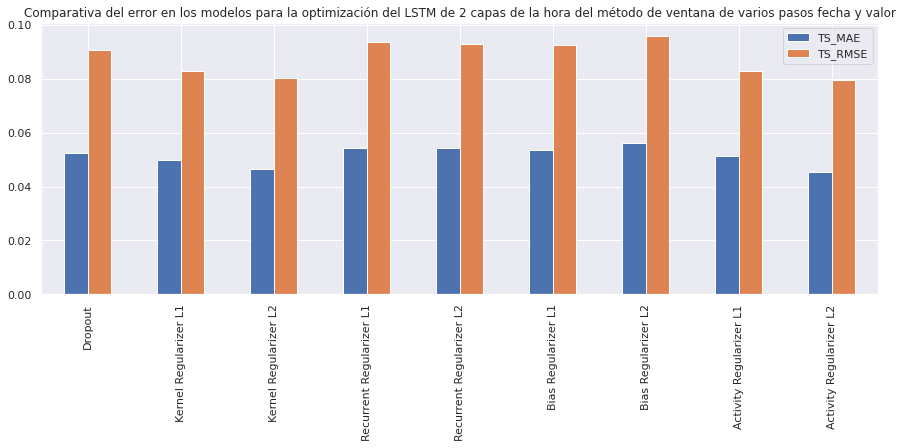

In [152]:
comparativa.loc[:, ['TS_MAE', 'TS_RMSE']].plot(kind='bar', title = 'Comparativa del error en los modelos para la optimización del LSTM de 2 capas de la hora del método de ventana de varios pasos fecha y valor')

<AxesSubplot:title={'center':'Comparativa del error porcentual absoluto medio simétrico para la optimización del LSTM de 2 capas de la hora del método de ventana de varios pasos fecha y valor'}>

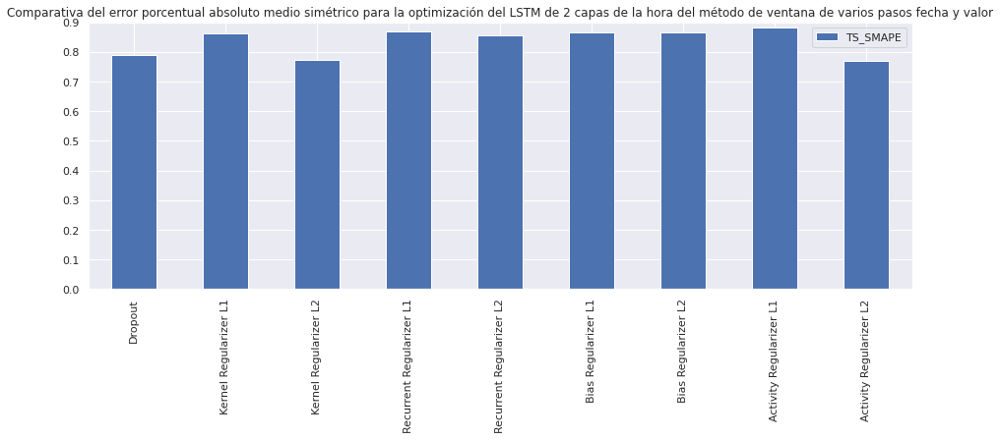

In [153]:
comparativa.loc[:, 'TS_SMAPE'].plot(kind='bar', legend=(['SMAPE']), ylim=(0, 0.9), 
                    title = 'Comparativa del error porcentual absoluto medio simétrico para la optimización del LSTM de 2 capas de la hora del método de ventana de varios pasos fecha y valor')